In [ ]:
# basic stuff
import scipy.io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
from google.colab import files
import os
import sklearn
import time
import json

# !pip install mat73

# dim reduction and visualization
from sklearn.decomposition import PCA
# !pip install umap
# !pip install umap-learn
# import umap.umap_ as umap
from sklearn.manifold import TSNE

# torch stuff
import torch
from torch.utils.data import Dataset, DataLoader, Subset
from torch import nn
import torch.nn.functional as F

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import sys
sys.path.append('/content/drive/MyDrive/Miller_Lab/FIU/xds_python/')

In [ ]:
sys.path

['/content',
 '/env/python',
 '/usr/lib/python38.zip',
 '/usr/lib/python3.8',
 '/usr/lib/python3.8/lib-dynload',
 '',
 '/usr/local/lib/python3.8/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.8/dist-packages/IPython/extensions',
 '/root/.ipython',
 '/content/drive/MyDrive/Miller_Lab/FIU/xds_python/']

# Notebook Description - Data Preprocessing and Network Architecture

All neural data are in .mat files ("xds" files compatible with the package imported below) stored on my google drive. Jarvis kinematic data are stored on my local computer in csv's - it is necessary to upload every time you start a new runtime.

### Preprocessing - Jarvis Kinematics Data

Kinematics data were obtained from the prediction software Jarvis, which takes in videos as input and outputs 3D keypoint predictions, along with their likelihoods, in a csv. There are 23 keypoints on the monkey's hand, including fingertips, joints, palm, and wrist. Videos were captured at a rate of 30Hz (1 frame/33.3ms). Likelihoods were removed, producing a csv of shape num_frames x 69 (23 keypoints in 3D -> 69 columns). For the time being, csv's with any NaN values are ignored, but those with a small number of NaN's will likely be interpolated within the bounds of the Nyquist criterion.

### Preprocessing - Neural Data

The main field of interest in the xds files is "spike_counts". This field is an array containing spike information for each of the sorted units - 1's and 0's where threshold crossings do and do not occur. This data was preprocessed in the following way:
- Sorting was done before creating xds files. This was done manually using the OfflineSorter software to identify "units" - these can more or less be thought of as individual neurons. Electrodes often pick up signals from multiple neurons simultaneously, and distinguishing these neurons from one another might be helpful for our encoding project (note - this is not usually done for decoding, where neural signals are inputs, and kinematics are outputs). 
- xds files are now created, containing the spike_counts field. As mentioned, this is an array containing 1's and 0's every 1ms. These spikes are binned to 33ms (1's and 0's are summed in 33ms intervals), and then divided by 33ms to produce firing rates. Each element of the array is now the average number of spikes per ms across a 33ms interval. 33ms was chosen in accordance with the frame rate of the cameras used for the videos; this bin size reduces the number of neural data points to exactly the number of kinematic data points.
- Firing rates are now smoothed with a Gaussian filter. This is a standard practice in neuroscience - it produces a moving weighted average (where the weights are determined by a Gaussian distribution) and mitigates the effects of imperfections in the data collection process.



### Data batches and Network Architecture

- Data batching
  - Each session was broken into chunks of length 100. Therefore, a session with 18000 frames produces a dataset with 180 instances, each with length 100.
- Network Architecture
  - Temporal convolutional network with varying number of convolutional layers, ReLU, and single linear readout layer.

In [ ]:
from xds import lab_data

In [ ]:
#DONE!
# Store each of the 3D csvs locally DONE
    # Import jarvis data for the following dates:
    # 2021/07/12
    # 2021/08/14
    # 2021/11/05
    # 2021/11/08
    # 2022/02/03
    #CHECK WHICH ONE'S NEV WAS MADE FIRST - FIRST ONE IS 001, SECOND ONE IS 002
    # 2022/02/10 PIPE - 002
    # 2022/02/10 UC - 001
    # 2022/02/24
    #CHECK WHICH ONE'S NEV WAS MADE FIRST - FIRST ONE IS 001, SECOND ONE IS 002
    # 2022/03/09-STICK (data1) - 002
    # 2022/04/05-UC(002) - 002

#DONE!
#Import neural data
#Find the function used to read matlab files in python and/or upload xds.py


In [ ]:
jarvispreds20210712 = np.genfromtxt('20210712_data3D.csv', delimiter = ',')
jarvispreds20210814 = np.genfromtxt('20210814_data3D.csv', delimiter = ',')
jarvispreds20211105 = np.genfromtxt('20211105_data3D.csv', delimiter = ',')
jarvispreds20220203 = np.genfromtxt('20220203_data3D.csv', delimiter = ',')
jarvispreds20220210_001 = np.genfromtxt('20220210uc_data3D.csv', delimiter = ',')
jarvispreds20220210_002 = np.genfromtxt('20220210pipe_data3D.csv', delimiter = ',')
jarvispreds20220224 = np.genfromtxt('20220224_data3D.csv', delimiter = ',')
jarvispreds20220405_002 = np.genfromtxt('20220405uc_data3D.csv', delimiter = ',')

In [ ]:
jarvispreds_list_untrimmed = [jarvispreds20210712,jarvispreds20210814,jarvispreds20211105,jarvispreds20220203 
                    ,jarvispreds20220210_001,jarvispreds20220210_002,jarvispreds20220224,jarvispreds20220405_002]

In [ ]:
# Remove likelihoods from jarvis csv's - they are every 4th column
# Trim videos to remove extra frames
jarvispreds_list = []
for jarvispred_untrimmed in jarvispreds_list_untrimmed:
  x = np.arange(92)
  liks = (np.arange(0, x.size+1, 4) -1)[1:]
  x = np.delete(x, liks)
  shape_before = jarvispred_untrimmed.shape
  num_frames = jarvispred_untrimmed.shape[0]
  num_frames_trimmed = int(num_frames/18000)*18000
  jarvispred_trimmed = jarvispred_untrimmed[:num_frames_trimmed, x]
  shape_after = jarvispred_trimmed.shape
  jarvispreds_list.append(jarvispred_trimmed)
  print('Shape before: {}, shape after: {}'.format(shape_before, shape_after))

Shape before: (37455, 92), shape after: (36000, 69)
Shape before: (55374, 92), shape after: (54000, 69)
Shape before: (36930, 92), shape after: (36000, 69)
Shape before: (18000, 92), shape after: (18000, 69)
Shape before: (18475, 92), shape after: (18000, 69)
Shape before: (18000, 92), shape after: (18000, 69)
Shape before: (18464, 92), shape after: (18000, 69)
Shape before: (18000, 92), shape after: (18000, 69)


In [ ]:
binnedsortedspikes20210712 = lab_data('/content/drive/MyDrive/Miller_Lab/FIU/PopFR_Jarvis/neuraldata/','20210712_Pop_FR_01.mat')
binnedsortedspikes20210814 = lab_data('/content/drive/MyDrive/Miller_Lab/FIU/PopFR_Jarvis/neuraldata/','20210814_Pop_FR_001.mat')
binnedsortedspikes20211105 = lab_data('/content/drive/MyDrive/Miller_Lab/FIU/PopFR_Jarvis/neuraldata/','20211105_Pop_FR_001.mat')
binnedsortedspikes20220203 = lab_data('/content/drive/MyDrive/Miller_Lab/FIU/PopFR_Jarvis/neuraldata/','20220203_Pop_FR_003.mat')
binnedsortedspikes20220210_001 = lab_data('/content/drive/MyDrive/Miller_Lab/FIU/PopFR_Jarvis/neuraldata/','20220210_Pop_FR_001.mat')
binnedsortedspikes20220210_002 = lab_data('/content/drive/MyDrive/Miller_Lab/FIU/PopFR_Jarvis/neuraldata/','20220210_Pop_FR_002.mat')
binnedsortedspikes20220224 = lab_data('/content/drive/MyDrive/Miller_Lab/FIU/PopFR_Jarvis/neuraldata/','20220224_Pop_FR_001.mat')
binnedsortedspikes20220405_002 = lab_data('/content/drive/MyDrive/Miller_Lab/FIU/PopFR_Jarvis/neuraldata/','20220405_Pop_FR_002.mat')

In [ ]:
date_list = ['20210712','20210814','20211105', '20220203','20220210_001','20220210_002',
              '20220224','20220405']

In [ ]:
neuraldata_list = [binnedsortedspikes20210712,binnedsortedspikes20210814,binnedsortedspikes20211105, 
                  binnedsortedspikes20220203,binnedsortedspikes20220210_001,binnedsortedspikes20220210_002,
                  binnedsortedspikes20220224,binnedsortedspikes20220405_002]

In [ ]:
for binnedsortedspikes  in neuraldata_list:
    print(binnedsortedspikes.get_meta())

{'monkey_name': 'Pop', 'hand': 'Left', 'task_name': 'FR', 'duration': 1200.0040000000001, 'collect_date': '2021/7/12 20:17:2.453', 'raw_file_name': '20210712_Pop_FR_01', 'array': 'M1', 'processed_time': '05-Dec-2022'}
{'monkey_name': 'Pop', 'hand': 'Left', 'task_name': 'FR', 'duration': 1800.0095, 'collect_date': '2021/8/14 18:45:31.170', 'raw_file_name': 'Pop_20210814_FR_001', 'array': 'M1', 'processed_time': '05-Dec-2022'}
{'monkey_name': 'Pop', 'hand': 'Left', 'task_name': 'FR', 'duration': 1200.0040000000001, 'collect_date': '2021/11/5 21:5:8.218', 'raw_file_name': '20211105_Pop_FR_001', 'array': 'M1', 'processed_time': '08-Dec-2022'}
{'monkey_name': 'Pop', 'hand': 'Left', 'task_name': 'FR', 'duration': 600.0095, 'collect_date': '2022/2/3 21:43:57.717', 'raw_file_name': '20220203_Pop_FR_003', 'array': 'M1', 'processed_time': '05-Dec-2022'}
{'monkey_name': 'Pop', 'hand': 'Left', 'task_name': 'FR', 'duration': 600.0095, 'collect_date': '2022/2/10 22:16:49.778', 'raw_file_name': '2022

In [ ]:
# Check for nans in neural data
for i, (binnedsortedspikes, jarvispred) in enumerate(zip(neuraldata_list, jarvispreds_list)):
    date = date_list[i]
    num_neural_nans = np.sum(np.isnan(binnedsortedspikes.spike_counts))
    print('DATE: {} \nNeural num nans: {}\n'\
          .format(date, num_neural_nans))

DATE: 20210712 
Neural num nans: 0

DATE: 20210814 
Neural num nans: 0

DATE: 20211105 
Neural num nans: 0

DATE: 20220203 
Neural num nans: 0

DATE: 20220210_001 
Neural num nans: 0

DATE: 20220210_002 
Neural num nans: 0

DATE: 20220224 
Neural num nans: 0

DATE: 20220405 
Neural num nans: 0



In [ ]:
# Check for nans in jarvis csv's and keep only those with non-nan values
jarvispreds_list_nonans = []
neuraldata_list_nonans = []
date_list_nonans = []
for i, (binnedsortedspikes, jarvispred) in enumerate(zip(neuraldata_list, jarvispreds_list)):
    date = date_list[i]
    num_jarv_nans = np.sum(np.isnan(jarvispred))
    print('DATE: {} \nNeural File Time Duration: {} \nNeural File Spikes Length: {} \nJarvis Preds Length: {} \nJarvis Preds num nans: {}\n'\
          .format(date, binnedsortedspikes.get_meta()['duration'], binnedsortedspikes.spike_counts.shape, jarvispred.shape[0], num_jarv_nans))
    if num_jarv_nans == 0:
        print('KEPT - NO NANS: {}\n'.format(date))
        jarvispreds_list_nonans.append(jarvispred)
        neuraldata_list_nonans.append(binnedsortedspikes)
        date_list_nonans.append(date)

DATE: 20210712 
Neural File Time Duration: 1200.0040000000001 
Neural File Spikes Length: (1200005, 142) 
Jarvis Preds Length: 36000 
Jarvis Preds num nans: 690

DATE: 20210814 
Neural File Time Duration: 1800.0095 
Neural File Spikes Length: (1800010, 145) 
Jarvis Preds Length: 54000 
Jarvis Preds num nans: 81696

DATE: 20211105 
Neural File Time Duration: 1200.0040000000001 
Neural File Spikes Length: (1200005, 113) 
Jarvis Preds Length: 36000 
Jarvis Preds num nans: 276

DATE: 20220203 
Neural File Time Duration: 600.0095 
Neural File Spikes Length: (600010, 44) 
Jarvis Preds Length: 18000 
Jarvis Preds num nans: 0

KEPT - NO NANS: 20220203

DATE: 20220210_001 
Neural File Time Duration: 600.0095 
Neural File Spikes Length: (600010, 62) 
Jarvis Preds Length: 18000 
Jarvis Preds num nans: 0

KEPT - NO NANS: 20220210_001

DATE: 20220210_002 
Neural File Time Duration: 600.0095 
Neural File Spikes Length: (600010, 62) 
Jarvis Preds Length: 18000 
Jarvis Preds num nans: 0

KEPT - NO NAN

In [ ]:
# bin spike counts, convert to firing rates, and smooth with gaussian filter (stand. dev. = 2xbin_size)
bin_size = 1/30
for binnedsortedspikes in neuraldata_list_nonans:
    binnedsortedspikes.update_bin_data(bin_size)
    binnedsortedspikes.spike_counts = binnedsortedspikes.spike_counts/bin_size
    binnedsortedspikes.smooth_binned_spikes(bin_size, 'gaussian', bin_size*2)

The new bin size is 0.0333 s
The spike counts have been smoothed.
The new bin size is 0.0333 s
The spike counts have been smoothed.
The new bin size is 0.0333 s
The spike counts have been smoothed.
The new bin size is 0.0333 s
The spike counts have been smoothed.


# Data Visualization

In [ ]:
for i in range(len(neuraldata_list_nonans)):
    date = neuraldata_list_nonans[i].get_meta()['collect_date']
    print(date)

2022/2/3 21:43:57.717
2022/2/10 22:16:49.778
2022/2/10 22:29:3.268
2022/2/24 21:2:12.116


In [ ]:
import math
def visualize_neuraloutputs_histogram(dataset, nrows, ncols, figsize):
    date = dataset.get_meta()['collect_date']
    fig, ax = plt.subplots(nrows = nrows, ncols = ncols)
    fig.set_size_inches(30, 50)
    # fig.suptitle('Session Dataset {}'.format(dataset.session_num))
    fig.tight_layout(pad=3.0)
    fig.subplots_adjust(top=0.95)
    for i in range(nrows*ncols):
        j = math.floor(i/ncols)
        k = i%ncols
        if (date != '2022/2/24 21:2:12.116') and (i ==(nrows*ncols -1)):
            ax[j][k].hist(np.zeros(dim_vals.shape[0]), bins = 300)
        else:
            dim_vals = dataset.spike_counts[:,i]
            ax[j][k].hist(dim_vals, bins = 300)
        # dim_vals = dataset[:,i]
        # ax[j][k].hist(dim_vals, bins = 300)
        ax[j][k].set_title('Electrode {}'.format(i))
        ax[j][k].set_xlabel('Firing Rate')
        ax[j][k].set_ylabel('Count')
      
    plt.show()

In [ ]:
for neuraldata in neuraldata_list_nonans:
    print(neuraldata.spike_counts.shape)

(18001, 44)
(18001, 62)
(18001, 62)
(18001, 108)


<IPython.core.display.Javascript object>

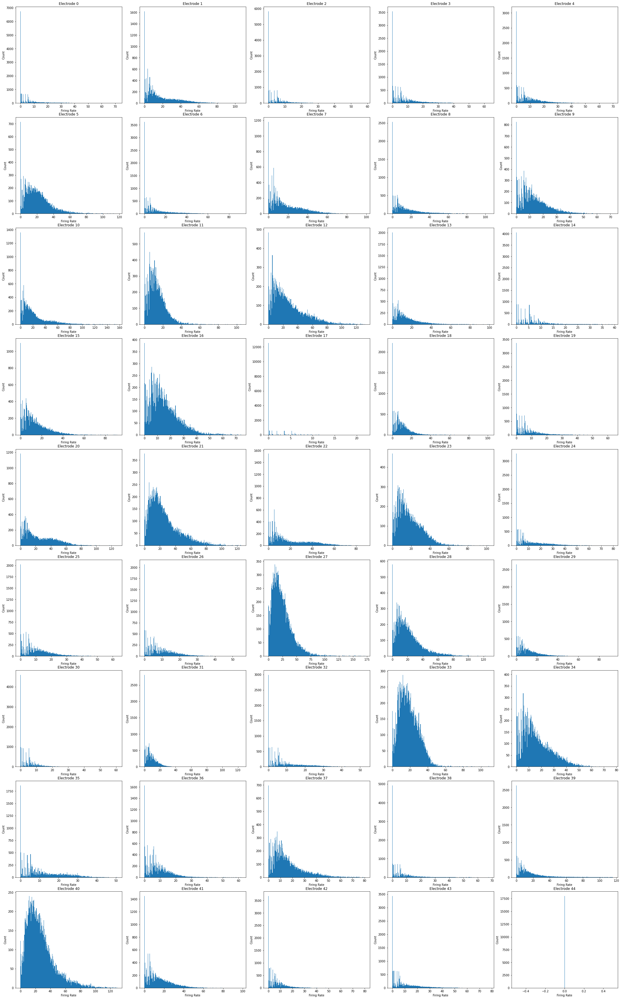

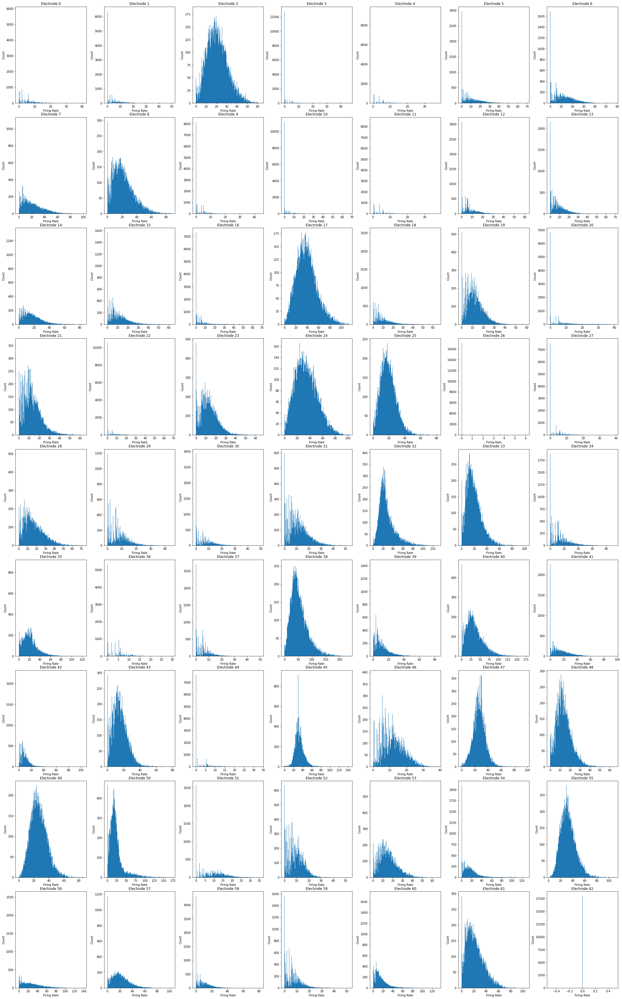

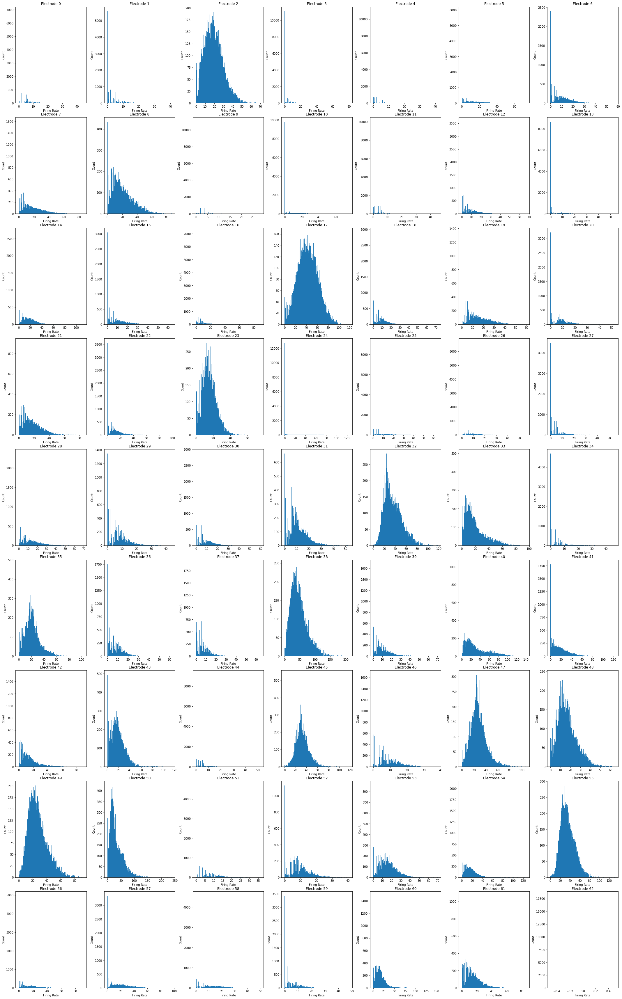

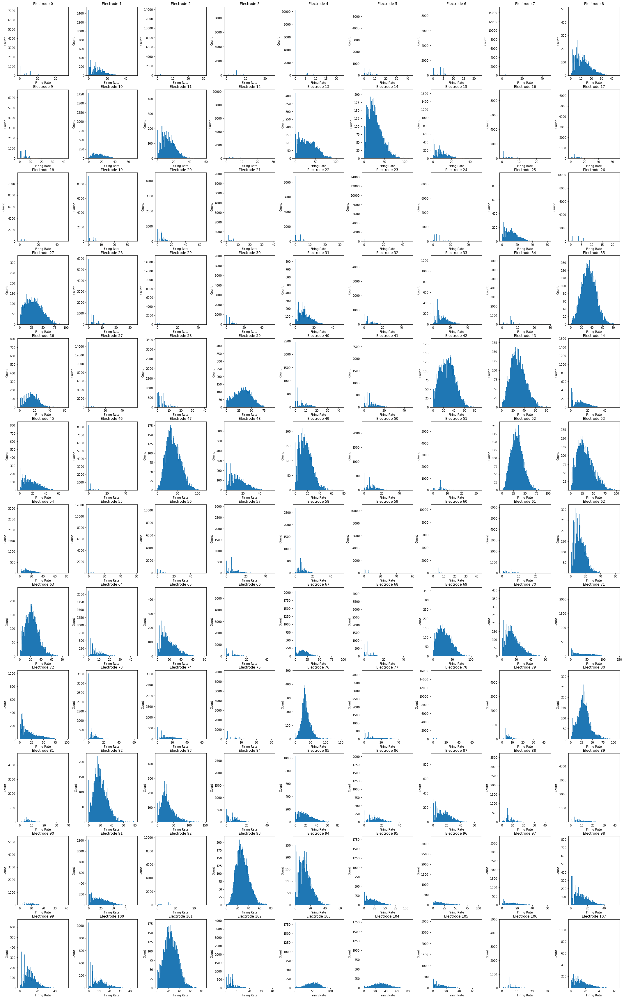

In [ ]:
hist_shapes_list = [(9,5),(9,7),(9,7),(12,9)]
from IPython.display import Javascript
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 5000})'''))
for i, neuraldata in enumerate(neuraldata_list_nonans):
    nrows, ncols = hist_shapes_list[i]
    visualize_neuraloutputs_histogram(neuraldata, nrows, ncols, (70,30))

DATE: 20220203 
Neural File Time Duration: 600.0095 
Neural File Spikes Length: (18001, 44) 
Jarvis Preds Length: 18000 
Jarvis Preds num nans: 0

Kinematic Variance PC1: 0.4984, Kinematic Variance PC2: 0.3177
Neural Variance PC1: 0.4939, Neural Variance PC2: 0.0916


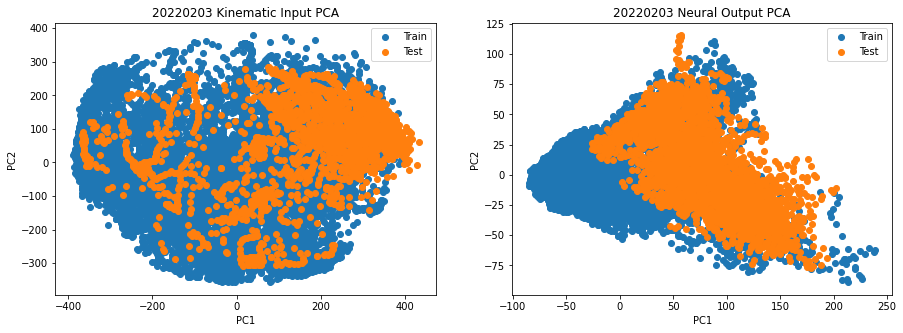



DATE: 20220210_001 
Neural File Time Duration: 600.0095 
Neural File Spikes Length: (18001, 62) 
Jarvis Preds Length: 18000 
Jarvis Preds num nans: 0

Kinematic Variance PC1: 0.5451, Kinematic Variance PC2: 0.3356
Neural Variance PC1: 0.2238, Neural Variance PC2: 0.1374


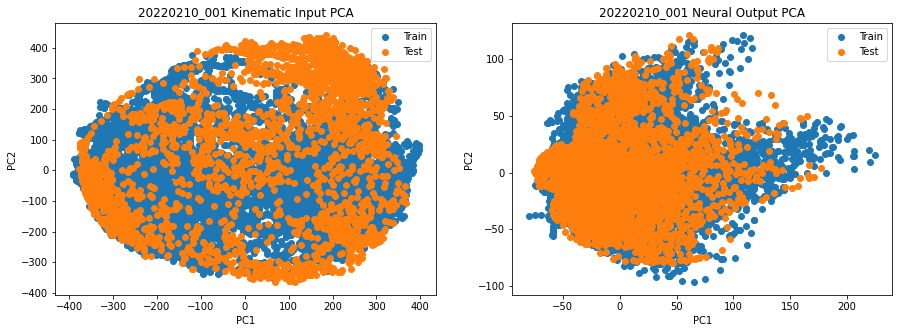



DATE: 20220210_002 
Neural File Time Duration: 600.0095 
Neural File Spikes Length: (18001, 62) 
Jarvis Preds Length: 18000 
Jarvis Preds num nans: 0

Kinematic Variance PC1: 0.7581, Kinematic Variance PC2: 0.1396
Neural Variance PC1: 0.2088, Neural Variance PC2: 0.1394


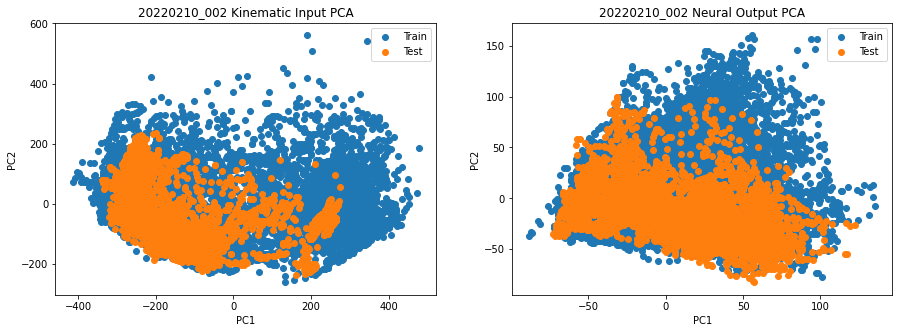



DATE: 20220224 
Neural File Time Duration: 600.0095 
Neural File Spikes Length: (18001, 108) 
Jarvis Preds Length: 18000 
Jarvis Preds num nans: 0

Kinematic Variance PC1: 0.6498, Kinematic Variance PC2: 0.1839
Neural Variance PC1: 0.2135, Neural Variance PC2: 0.1311


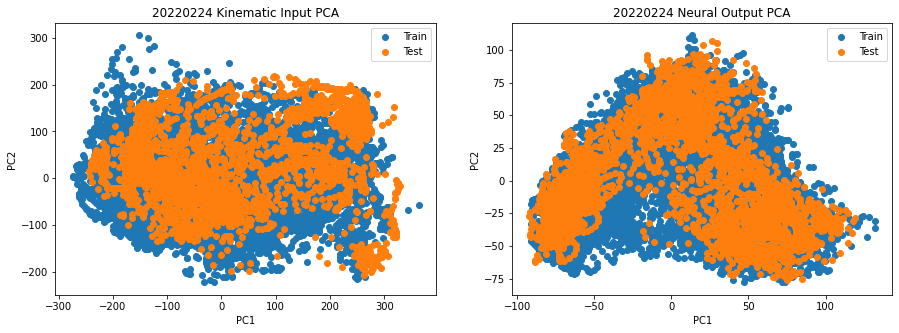

In [ ]:
# Visualize data using PCA
for i, (binnedsortedspikes, jarvispred) in enumerate(zip(neuraldata_list_nonans, jarvispreds_list_nonans)):
    date = date_list_nonans[i]
    num_jarv_nans = np.sum(np.isnan(jarvispred))
    print('DATE: {} \nNeural File Time Duration: {} \nNeural File Spikes Length: {} \nJarvis Preds Length: {} \nJarvis Preds num nans: {}\n'\
          .format(date, binnedsortedspikes.get_meta()['duration'], binnedsortedspikes.spike_counts.shape, jarvispred.shape[0], num_jarv_nans))

    # PCA - visualization
    num_instances = jarvispred.shape[0]
    train_split = int(num_instances*.8)

    fig, ax = plt.subplots(nrows = 1, ncols = 2)

    pca_glove = PCA(n_components=2)
    pca_neural = PCA(n_components=2)

    pca_glove_features = pca_glove.fit_transform(jarvispred)
    pca_neural_features = pca_neural.fit_transform(binnedsortedspikes.spike_counts)
    
    pca_glove_var = pca_glove.explained_variance_ratio_
    pca_neural_var = pca_neural.explained_variance_ratio_

    pca1_glove_var, pca2_glove_var = round(pca_glove_var[0],4), round(pca_glove_var[1],4)
    pca1_neural_var, pca2_neural_var = round(pca_neural_var[0],4), round(pca_neural_var[1],4)

    print('Kinematic Variance PC1: {}, Kinematic Variance PC2: {}'.format(pca1_glove_var, pca2_glove_var))
    print('Neural Variance PC1: {}, Neural Variance PC2: {}'.format(pca1_neural_var, pca2_neural_var))
    
    fig.set_size_inches(15, 5)
    ax[0].scatter(pca_glove_features[:train_split,0], pca_glove_features[:train_split,1], label='Train')
    ax[0].scatter(pca_glove_features[train_split:,0], pca_glove_features[train_split:,1], label='Test')

    ax[1].scatter(pca_neural_features[:train_split,0], pca_neural_features[:train_split,1],label='Train')
    ax[1].scatter(pca_neural_features[train_split:,0], pca_neural_features[train_split:,1], label='Test')

    ax[0].set_xlabel('PC1')
    ax[0].set_ylabel('PC2')
    ax[1].set_xlabel('PC1')
    ax[1].set_ylabel('PC2')

    ax[0].set_title('{} Kinematic Input PCA'.format(date))
    ax[1].set_title('{} Neural Output PCA'.format(date))

    ax[0].legend()
    ax[1].legend()

    plt.show()

    print('\n')

In [ ]:
# Next steps
# Trim off last neural frame
# Reshape each video/session so the length of each "trial" is 100

#Proof we want order = 'C'
x = np.array([[1,1,1,1,2,2,2,2,3,3,3,3,4,4,4,4],[1,1,1,1,2,2,2,2,3,3,3,3,4,4,4,4]])
x.reshape((-1,4,4), order = 'C')

array([[[1, 1, 1, 1],
        [2, 2, 2, 2],
        [3, 3, 3, 3],
        [4, 4, 4, 4]],

       [[1, 1, 1, 1],
        [2, 2, 2, 2],
        [3, 3, 3, 3],
        [4, 4, 4, 4]]])

# Create Datasets

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, date, normalize_inputs = False, shuffle = False):

        jarvispred, neuraldata = jarvispreds_list_nonans[index_dict[date]], neuraldata_list_nonans[index_dict[date]].spike_counts[:-1,:]
        self.date = date
        self.jarvisinputs = jarvispred
        self.num_neural_units = neuraldata.shape[1]
        self.neuraloutputs = neuraldata.reshape((-1, 100, self.num_neural_units), order = 'C') #I checked. We want order C
        self.normalize_inputs = normalize_inputs

        def normalize_inputs(inp):
            mean = np.mean(inp, axis = 0)
            var = np.var(inp, axis = 0)

            normalized_inputs = []
            for trial in self.jarvisinputs:
                normalized = (trial-mean)/var
                normalized_inputs.append(normalized)

            return(normalized_inputs)

        def shuffle_data(g, n, t, sn):
            assert len(g) == len(n)
            assert len(g) == len(t)
            assert len(g) == len(sn)
            p = np.random.permutation(len(g))
            return(g[p], n[p], t[p], sn[p])

        if normalize_inputs == True:
            self.jarvisinputs_normalized = normalize_inputs(self.jarvisinputs)
        self.jarvisinputs = self.jarvisinputs.reshape((-1, 100, 69), order = 'C') #I checked. We want order C

        if shuffle == True:
            self.jarvisinputs, self.neuraloutputs = shuffle_data(self.gloveinputs, self.neuraloutputs)

    def __len__(self):
        assert len(self.jarvisinputs) == len(self.neuraloutputs)
        return len(self.jarvisinputs)

    def __getitem__(self, idx):
        if self.normalize_inputs == True:
            jarvisinput = torch.from_numpy(self.jarvisinput_normalized[idx])
        else:
            jarvisinput = torch.from_numpy(self.jarvisinputs[idx])
        neuraloutput = torch.from_numpy(self.neuraloutputs[idx])

        return jarvisinput.float().t(), neuraloutput.float() #input is transposed for convenience - better for Conv1D

In [ ]:
date_list_nonans

['20220203', '20220210_001', '20220210_002', '20220224']

In [ ]:
index_dict = {'20220203': 0, '20220210_001': 1, '20220210_002': 2, '20220224': 3}

In [ ]:
neuraldata_list_nonans[0].spike_counts.shape

(18001, 44)

In [ ]:
dataset20220203 = CustomDataset('20220203')
dataset20220210_001 = CustomDataset('20220210_001')
dataset20220210_002 = CustomDataset('20220210_002')
dataset20220224 = CustomDataset('20220224')

dataset_list = [dataset20220203,dataset20220210_001,dataset20220210_002,dataset20220224]

In [ ]:
#input is transposed for convenience - better for Conv1D
for dataset in dataset_list:
  print(('{} \nnum instances: {} \nJarvis input shape: {} \nNeural Spikes shape: {}\n').\
        format(dataset.date, len(dataset), dataset[0][0].shape, dataset[0][1].shape))

20220203 
num instances: 180 
Jarvis input shape: torch.Size([69, 100]) 
Neural Spikes shape: torch.Size([100, 44])

20220210_001 
num instances: 180 
Jarvis input shape: torch.Size([69, 100]) 
Neural Spikes shape: torch.Size([100, 62])

20220210_002 
num instances: 180 
Jarvis input shape: torch.Size([69, 100]) 
Neural Spikes shape: torch.Size([100, 62])

20220224 
num instances: 180 
Jarvis input shape: torch.Size([69, 100]) 
Neural Spikes shape: torch.Size([100, 108])



In [ ]:
torch.manual_seed(1)

train_dataset_list = []
test_dataset_list = []
toy_dataset_list = []

train_loaders_list = []
test_loaders_list = []
toy_loaders_list = []

# 60/20/20 split for each session
for i, dataset in enumerate(dataset_list):
    num_instances = len(dataset)
    train_split = int(num_instances*.8)

    train_dataset = Subset(dataset, np.arange(num_instances)[:train_split])
    test_dataset = Subset(dataset, np.arange(num_instances)[train_split:])
    # this is used to make sure the network can achieve zero loss on a single instance
    toy_dataset = Subset(dataset, np.arange(num_instances)[:1])

    train_dataset_list.append(train_dataset)
    test_dataset_list.append(test_dataset)
    toy_dataset_list.append(toy_dataset)

    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, pin_memory=True, sampler=None)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, pin_memory=True)
    # this is used to make sure the network can achieve zero loss on a single instance
    toy_loader = torch.utils.data.DataLoader(toy_dataset, batch_size=1, pin_memory=True)

    train_loaders_list.append(train_loader)
    test_loaders_list.append(test_loader)
    toy_loaders_list.append(toy_loader)

    print('Date: {}'.format(dataset.date))
    print('Total dataset size: {}'.format(len(dataset)))
    print('Number of train instances: {}, Number of test instances: {}'\
          .format(len(train_dataset), len(test_dataset)))

Date: 20220203
Total dataset size: 180
Number of train instances: 144, Number of test instances: 36
Date: 20220210_001
Total dataset size: 180
Number of train instances: 144, Number of test instances: 36
Date: 20220210_002
Total dataset size: 180
Number of train instances: 144, Number of test instances: 36
Date: 20220224
Total dataset size: 180
Number of train instances: 144, Number of test instances: 36


# Building and Training Model

In [ ]:
class TempConvNet(torch.nn.Module):
    def __init__(self, input_dim, output_dim, num_conv_layers, kernel_size, padding):
        super(TempConvNet, self).__init__()
        self.net = nn.ModuleList()
        assert num_conv_layers >= 1
        self.num_conv_layers = num_conv_layers
        self.input_dim = input_dim
        self.output_dim = output_dim
        self.kernel_size = kernel_size
        self.padding = padding
        
        # 1D convolutional layers
        for i in range(num_conv_layers):
            self.net.append(nn.Conv1d(in_channels = input_dim, out_channels = input_dim*2, \
                                      kernel_size = kernel_size, padding = padding))
            self.net.append(nn.ReLU())
            input_dim *= 2

        # output layer
        self.net.append(nn.Linear(input_dim, output_dim))
    
    def forward(self, x):
        for layer in self.net:
            if type(layer)==torch.nn.modules.linear.Linear: 
                x = layer(x.t())
            else:
                x = layer(x)
        return(x)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
def train(loader, model, optimizer, criterion):
    model.train()
    batch_losses = []

    for i, (input, target) in enumerate(loader):
        optimizer.zero_grad() #clear gradient
        input = input.to(device, dtype=torch.float)
        target = target.to(device, dtype=torch.float)
        
        pred = model(input)
        # print(pred.shape, target.shape)
        loss = criterion(pred, target)  # calculate loss
        mean_batch_loss = loss.item()
        batch_losses.append(mean_batch_loss)

        loss.backward()  # one backward pass
        optimizer.step()  # update the parameters

    avg_loss_epoch = sum(batch_losses)/len(batch_losses)
    return(avg_loss_epoch)

def test(loader, model, optimizer, criterion):
    model.eval()
    batch_losses = []

    with torch.no_grad():
        for i, (input, target) in enumerate(loader):
            input = input.to(device, dtype=torch.float)
            target = target.to(device, dtype=torch.float)
            pred = model(input)

            loss = criterion(pred, target)  
            mean_batch_loss = loss.item()
            batch_losses.append(mean_batch_loss)

    avg_loss_epoch = sum(batch_losses)/len(batch_losses)
    return(avg_loss_epoch)

def get_instance_losses(loader, model, criterion = torch.nn.MSELoss(reduction='none')):
    model.eval()
    inputs = []
    targets = []
    preds = []
    losses = []

    with torch.no_grad():
        for i, (input, target) in enumerate(loader):
            input = input.to(device, dtype=torch.float)
            target = target.to(device, dtype=torch.float)

            pred = model(input)
            all_losses_batch = criterion(pred, target)  # calculate loss
            all_losses_batch = all_losses_batch.detach().cpu().data.numpy()
            
            inputs.append(input.cpu().data.numpy().T)
            targets.append(target.cpu().data.numpy())
            preds.append(pred)
            losses.append(all_losses_batch)

    all_inputs = np.vstack(inputs)
    all_targets = np.vstack(targets)
    all_preds = np.vstack(preds)

    all_losses = np.vstack(losses)
    all_losses = np.mean(all_losses, axis = 1)

    all_data = [all_losses, all_inputs, all_targets, all_preds]
    return(all_data)

In [ ]:
for (input, target) in toy_dataset_list[0]:
  print(input.shape, target.shape)

torch.Size([69, 100]) torch.Size([100, 44])


In [ ]:
def get_fft(signal):
    N = len(signal)
    dft = np.fft.fft(signal)
    freq = np.fft.fftfreq(N, 1/N)
    return dft[np.argsort(freq)], freq[np.argsort(freq)]

array([[ 1.35152321, 15.09202476,  0.        , ...,  8.8130384 ,
         7.84740536, 19.46380405],
       [ 2.5059638 , 15.29486779,  0.        , ...,  7.71891192,
        10.36252079, 21.71854832],
       [ 4.04975743, 14.66989301,  0.        , ...,  5.8923623 ,
        12.9685315 , 22.58557715],
       ...,
       [10.80085255, 64.72843182,  8.24786266, ..., 32.52769688,
        14.89550019, 34.43506838],
       [ 9.31787966, 65.8530241 ,  9.31787966, ..., 28.90626886,
        14.33878172, 32.73011955],
       [ 7.40863001, 65.61833146, 11.33800404, ..., 24.0574629 ,
        14.69107946, 30.0474287 ]])

In [79]:
jarvispreds_list_nonans[0].shape

(18000, 69)

In [80]:
x[i,:].shape

torch.Size([100])

In [83]:
keypoint_list_names = ['Pinky_T_x','Pinky_T_y','Pinky_T_z','Pinky_D_x','Pinky_D_y','Pinky_D_z','Pinky_M_x','Pinky_M_y','Pinky_M_z','Pinky_P_x','Pinky_P_y','Pinky_P_z','Ring_T_x','Ring_T_y','Ring_T_z','Ring_D_x','Ring_D_y','Ring_D_z','Ring_M_x','Ring_M_y','Ring_M_z','Ring_P_x','Ring_P_y','Ring_P_z','Middle_T_x','Middle_T_y','Middle_T_z','Middle_D_x','Middle_D_y','Middle_D_z','Middle_M_x','Middle_M_y','Middle_M_z','Middle_P_x','Middle_P_y','Middle_P_z','Index_T_x','Index_T_y','Index_T_z','Index_D_x','Index_D_y','Index_D_z','Index_M_x','Index_M_y','Index_M_z','Index_P_x','Index_P_y','Index_P_z','Thumb_T_x','Thumb_T_y','Thumb_T_z','Thumb_D_x','Thumb_D_y','Thumb_D_z','Thumb_M_x','Thumb_M_y','Thumb_M_z','Thumb_P_x','Thumb_P_y','Thumb_P_z','Palm_x','Palm_y','Palm_z','Wrist_U_x','Wrist_U_y','Wrist_U_z','Wrist_R_x','Wrist_R_y','Wrist_R_z']

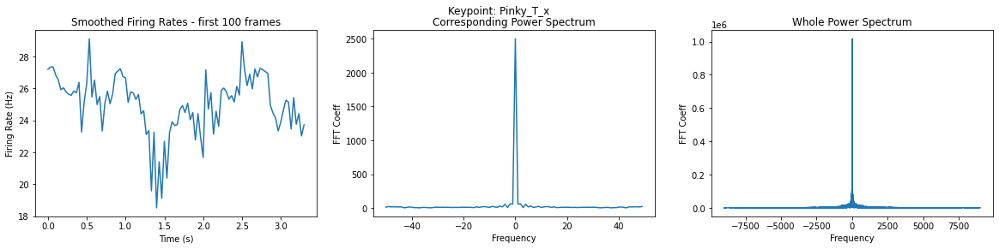

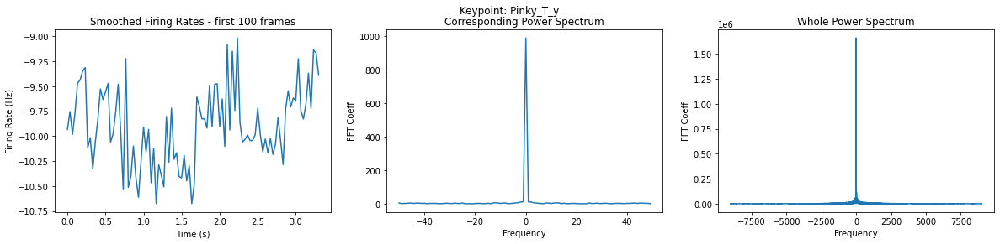

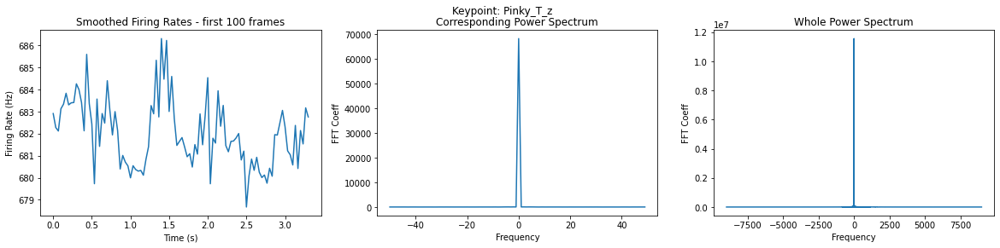

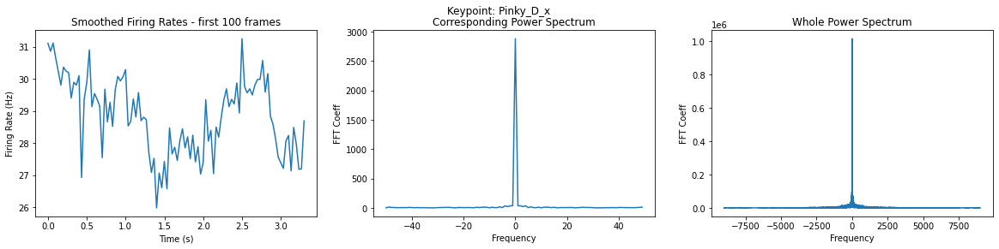

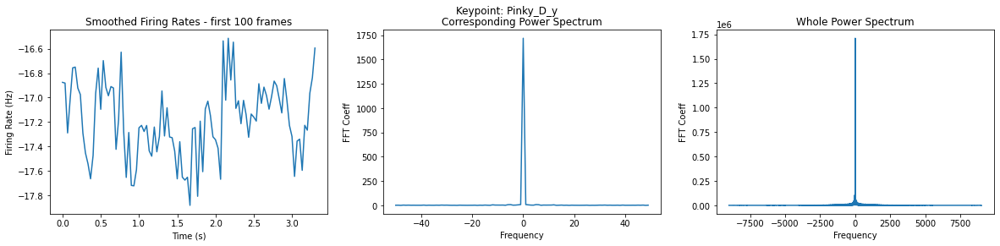

...

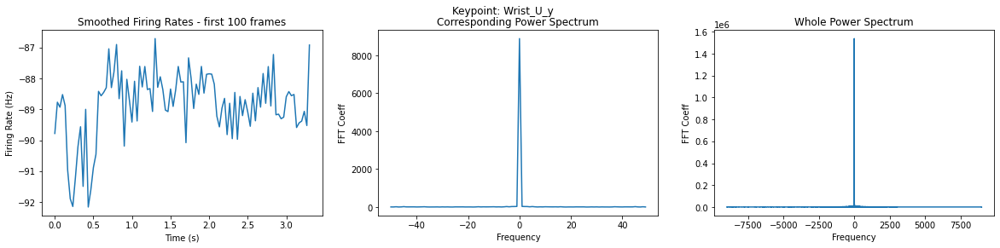

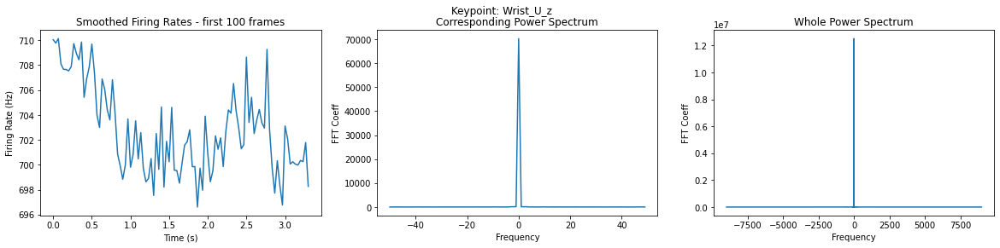

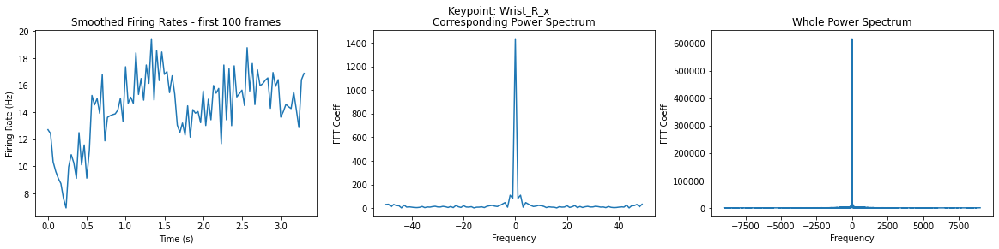

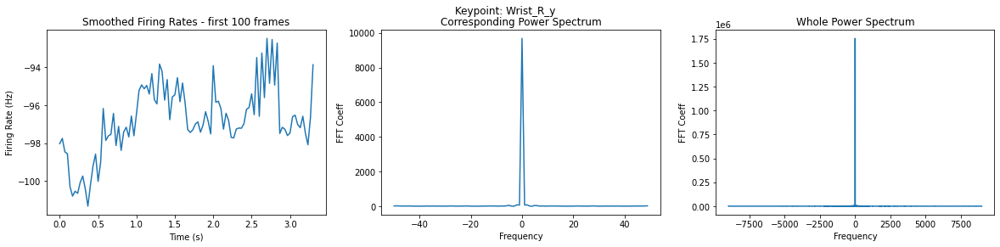

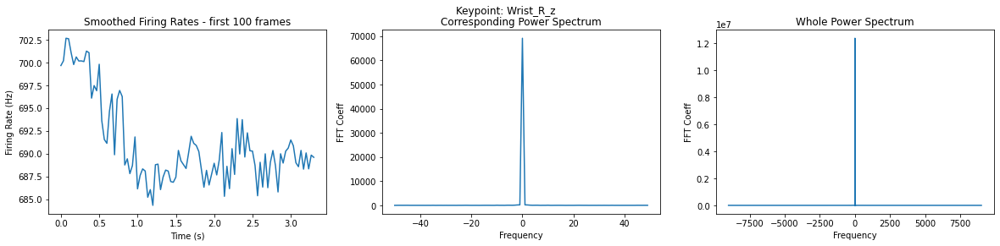

In [84]:
x = toy_dataset_list[0][0][0]
y = toy_dataset_list[0][0][1].t()
for i in range(x.shape[0]):
    dft, freq = get_fft(x[i,:])
    dft_whole, freq_whole = get_fft(jarvispreds_list_nonans[0][:,i])
    xaxis = np.arange(100)*0.033333
    fig, ax = plt.subplots(nrows = 1, ncols = 3)
    fig.suptitle('Keypoint: {}'.format(keypoint_list_names[i]))
    fig.set_size_inches(20, 4)
    ax[0].plot(xaxis, x[i,:])
    ax[0].set_xlabel('Time (s)')
    ax[0].set_ylabel('Firing Rate (Hz)')
    ax[0].set_title('Smoothed Firing Rates - first 100 frames')
    ax[1].plot(freq, abs(dft))
    ax[1].set_xlabel('Frequency')
    ax[1].set_ylabel('FFT Coeff')
    ax[1].set_title('Corresponding Power Spectrum')
    ax[2].plot(freq_whole, abs(dft_whole))
    ax[2].set_xlabel('Frequency')
    ax[2].set_ylabel('FFT Coeff')
    ax[2].set_title('Whole Power Spectrum')
    plt.show()

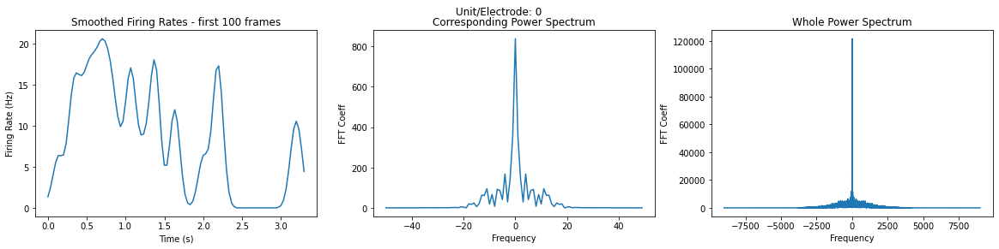

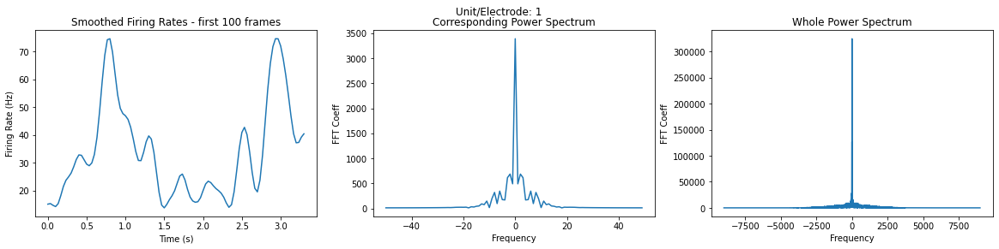

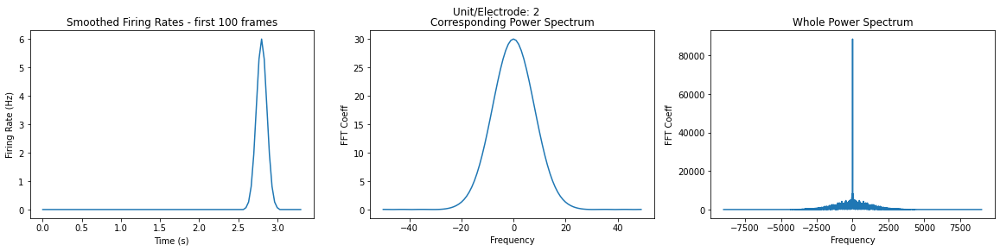

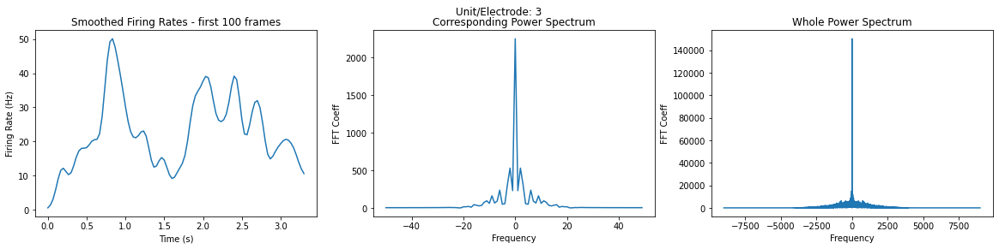

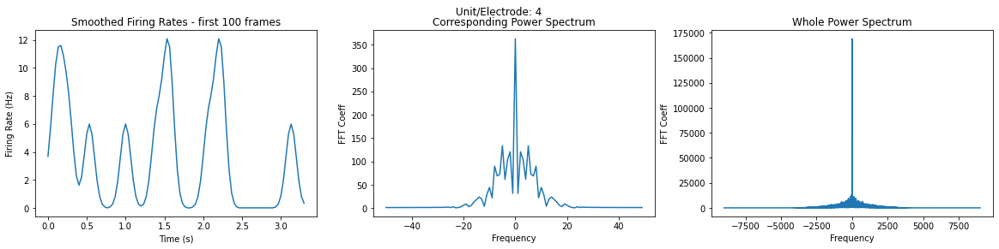

...

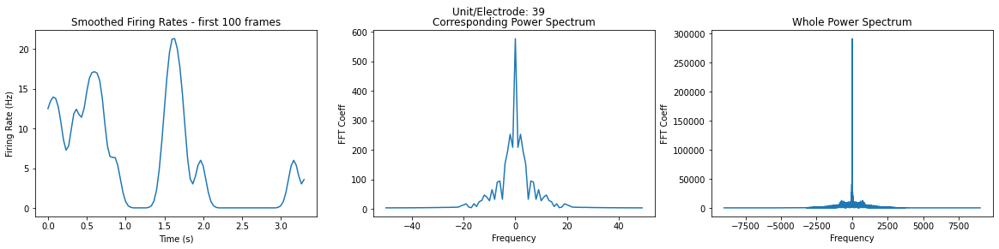

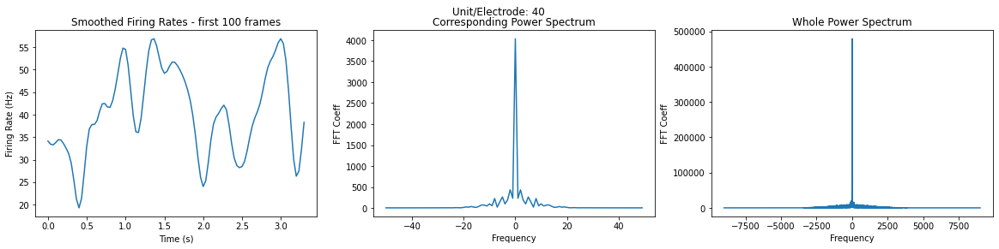

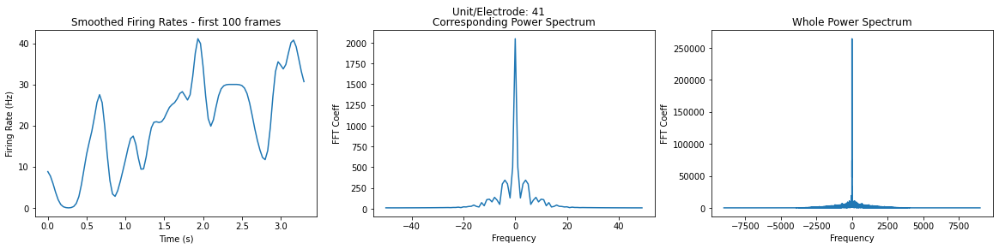

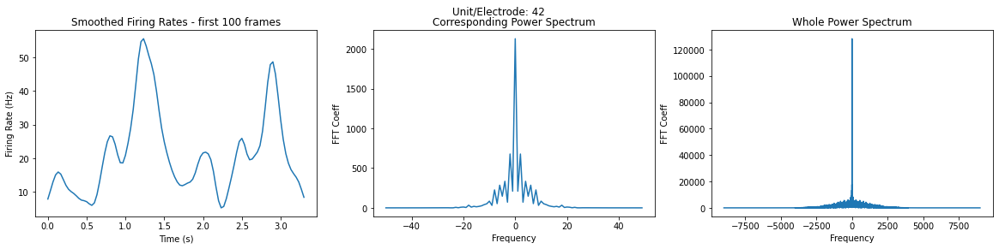

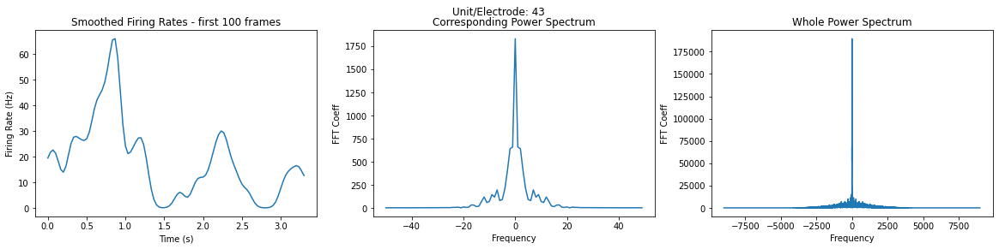

In [75]:
for i in range(y.shape[0]):
    dft, freq = get_fft(y[i,:])
    dft_whole, freq_whole = get_fft(neuraldata_list_nonans[0].spike_counts[:,i])
    xaxis = np.arange(100)*0.033333
    fig, ax = plt.subplots(nrows = 1, ncols = 3)
    fig.suptitle('Unit/Electrode: {}'.format(i))
    fig.set_size_inches(20, 4)
    ax[0].plot(xaxis, y[i,:])
    ax[0].set_xlabel('Time (s)')
    ax[0].set_ylabel('Firing Rate (Hz)')
    ax[0].set_title('Smoothed Firing Rates - first 100 frames')
    ax[1].plot(freq, abs(dft))
    ax[1].set_xlabel('Frequency')
    ax[1].set_ylabel('FFT Coeff')
    ax[1].set_title('Corresponding Power Spectrum')
    ax[2].plot(freq_whole, abs(dft_whole))
    ax[2].set_xlabel('Frequency')
    ax[2].set_ylabel('FFT Coeff')
    ax[2].set_title('Whole Power Spectrum')
    plt.show()

Epoch: 000, LR: 0.010000, Train Loss: 1116.3293457
Epoch: 050, LR: 0.010000, Train Loss: 104.1879654
Epoch: 100, LR: 0.010000, Train Loss: 96.7048950
Epoch: 150, LR: 0.010000, Train Loss: 96.3092575
Epoch: 200, LR: 0.010000, Train Loss: 96.0020142
Epoch: 250, LR: 0.010000, Train Loss: 95.7426682
Epoch: 300, LR: 0.010000, Train Loss: 95.5343781


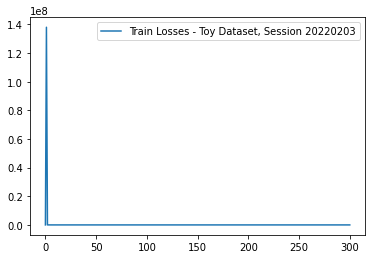

Epoch: 000, LR: 0.010000, Train Loss: 360.2713318
Epoch: 050, LR: 0.010000, Train Loss: 38.3008156
Epoch: 100, LR: 0.010000, Train Loss: 37.0083580
Epoch: 150, LR: 0.010000, Train Loss: 36.9123154
Epoch: 200, LR: 0.010000, Train Loss: 36.8472176
Epoch: 250, LR: 0.010000, Train Loss: 36.8054924
Epoch: 300, LR: 0.010000, Train Loss: 36.7787132


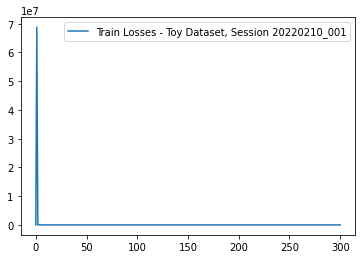

Epoch: 000, LR: 0.010000, Train Loss: 508.4165344
Epoch: 050, LR: 0.010000, Train Loss: 38.1958275
Epoch: 100, LR: 0.010000, Train Loss: 32.4525566


KeyboardInterrupt: ignored

In [ ]:
for i in range(len(toy_dataset_list)):
    model = TempConvNet(input_dim = 69, output_dim=dataset_list[i].num_neural_units, num_conv_layers = 3,\
                kernel_size = 5, padding = 2).to(device)
    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.7, patience=5, min_lr=0.00001)   

    train_losses = []

    for epoch in range(301):
        # torch.cuda.empty_cache()
        lr = scheduler.optimizer.param_groups[0]['lr']
        train_loss = train(toy_dataset_list[i], model, optimizer, criterion)
        if epoch % 50 ==0:
            print('Epoch: {:03d}, LR: {:7f}, Train Loss: {:.7f}'\
                  .format(epoch, lr, train_loss))

        train_losses.append(train_loss)

    plt.plot(train_losses)
    plt.legend(['Train Losses - Toy Dataset, Session {}'.format(dataset_list[i].date)])
    plt.show()

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1581.3707275
Epoch: 001, LR: 0.010000, Train Loss: 1850548.6250000
Epoch: 002, LR: 0.010000, Train Loss: 21458.7714844
Epoch: 003, LR: 0.010000, Train Loss: 468.6496277
Epoch: 004, LR: 0.010000, Train Loss: 1.1626465
Epoch: 005, LR: 0.010000, Train Loss: 0.4859207
Epoch: 006, LR: 0.010000, Train Loss: 0.4692158
Epoch: 007, LR: 0.010000, Train Loss: 0.4684090
Epoch: 008, LR: 0.010000, Train Loss: 0.4672423
Epoch: 009, LR: 0.010000, Train Loss: 0.4656255
Epoch: 010, LR: 0.010000, Train Loss: 0.4635217
Epoch: 011, LR: 0.010000, Train Loss: 0.4608909
Epoch: 012, LR: 0.010000, Train Loss: 0.4576959
Epoch: 013, LR: 0.010000, Train Loss: 0.4539008
Epoch: 014, LR: 0.010000, Train Loss: 0.4494703
Epoch: 015, LR: 0.010000, Train Loss: 0.4443884
Epoch: 016, LR: 0.010000, Train Loss: 0.4386425
Epoch: 017, LR: 0.010000, Train Loss: 0.4322307
Epoch: 018, LR: 0.010000, Train Loss: 0.4251584
Epoch: 019, 

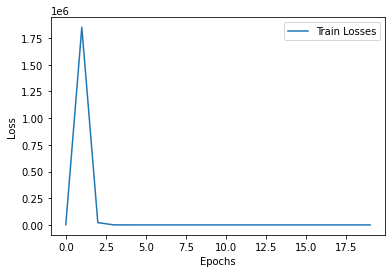

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2874.3479004
Epoch: 001, LR: 0.010000, Train Loss: 2733985.7500000
Epoch: 002, LR: 0.010000, Train Loss: 12358.3798828
Epoch: 003, LR: 0.010000, Train Loss: 15.9887819
Epoch: 004, LR: 0.010000, Train Loss: 0.5460644
Epoch: 005, LR: 0.010000, Train Loss: 0.5459009
Epoch: 006, LR: 0.010000, Train Loss: 0.5455884
Epoch: 007, LR: 0.010000, Train Loss: 0.5450331
Epoch: 008, LR: 0.010000, Train Loss: 0.5441598
Epoch: 009, LR: 0.010000, Train Loss: 0.5428830
Epoch: 010, LR: 0.010000, Train Loss: 0.5411527
Epoch: 011, LR: 0.010000, Train Loss: 0.5388849
Epoch: 012, LR: 0.010000, Train Loss: 0.5360026
Epoch: 013, LR: 0.010000, Train Loss: 0.5324162
Epoch: 014, LR: 0.010000, Train Loss: 0.5280722
Epoch: 015, LR: 0.010000, Train Loss: 0.5228943
Epoch: 016, LR: 0.010000, Train Loss: 0.5168161
Epoch: 017, LR: 0.010000, Train Loss: 0.5097803
Epoch: 018, LR: 0.010000, Train Loss: 0.5017525
Epoch: 019, L

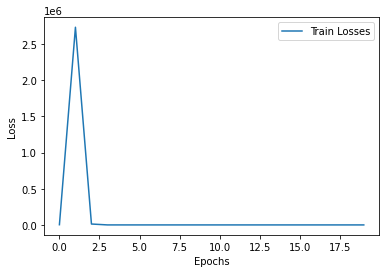

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: nan
Epoch: 001, LR: 0.010000, Train Loss: nan
Epoch: 002, LR: 0.010000, Train Loss: nan
Epoch: 003, LR: 0.010000, Train Loss: nan
Epoch: 004, LR: 0.010000, Train Loss: nan
Epoch: 005, LR: 0.010000, Train Loss: nan
Epoch: 006, LR: 0.007000, Train Loss: nan
Epoch: 007, LR: 0.007000, Train Loss: nan
Epoch: 008, LR: 0.007000, Train Loss: nan
Epoch: 009, LR: 0.007000, Train Loss: nan
Epoch: 010, LR: 0.007000, Train Loss: nan
Epoch: 011, LR: 0.007000, Train Loss: nan
Epoch: 012, LR: 0.004900, Train Loss: nan
Epoch: 013, LR: 0.004900, Train Loss: nan
Epoch: 014, LR: 0.004900, Train Loss: nan
Epoch: 015, LR: 0.004900, Train Loss: nan
Epoch: 016, LR: 0.004900, Train Loss: nan
Epoch: 017, LR: 0.004900, Train Loss: nan
Epoch: 018, LR: 0.003430, Train Loss: nan
Epoch: 019, LR: 0.003430, Train Loss: nan
Time to train model: 0.3380470275878906


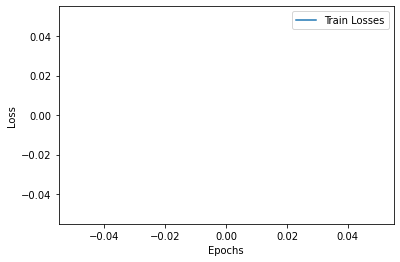

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1816.5754395
Epoch: 001, LR: 0.010000, Train Loss: 2483537.2500000
Epoch: 002, LR: 0.010000, Train Loss: 9512.7021484
Epoch: 003, LR: 0.010000, Train Loss: 0.8465841
Epoch: 004, LR: 0.010000, Train Loss: 0.6772747
Epoch: 005, LR: 0.010000, Train Loss: 0.6756833
Epoch: 006, LR: 0.010000, Train Loss: 0.6729250
Epoch: 007, LR: 0.010000, Train Loss: 0.6687580
Epoch: 008, LR: 0.010000, Train Loss: 0.6629195
Epoch: 009, LR: 0.010000, Train Loss: 0.6552539
Epoch: 010, LR: 0.010000, Train Loss: 0.6456079
Epoch: 011, LR: 0.010000, Train Loss: 0.6339384
Epoch: 012, LR: 0.010000, Train Loss: 0.6202345
Epoch: 013, LR: 0.010000, Train Loss: 0.6045250
Epoch: 014, LR: 0.010000, Train Loss: 0.5869228
Epoch: 015, LR: 0.010000, Train Loss: 0.5675831
Epoch: 016, LR: 0.010000, Train Loss: 0.5467573
Epoch: 017, LR: 0.010000, Train Loss: 0.5247689
Epoch: 018, LR: 0.010000, Train Loss: 0.5020189
Epoch: 019, LR:

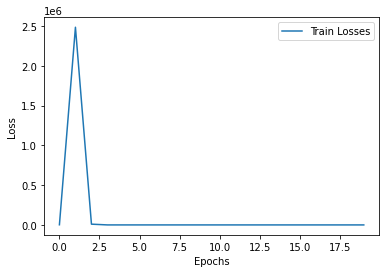

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2000.8034668
Epoch: 001, LR: 0.010000, Train Loss: 4436930.5000000
Epoch: 002, LR: 0.010000, Train Loss: 19294.2324219
Epoch: 003, LR: 0.010000, Train Loss: 2.1355500
Epoch: 004, LR: 0.010000, Train Loss: 0.6927436
Epoch: 005, LR: 0.010000, Train Loss: 0.6893672
Epoch: 006, LR: 0.010000, Train Loss: 0.6874563
Epoch: 007, LR: 0.010000, Train Loss: 0.6846868
Epoch: 008, LR: 0.010000, Train Loss: 0.6808062
Epoch: 009, LR: 0.010000, Train Loss: 0.6756771
Epoch: 010, LR: 0.010000, Train Loss: 0.6691589
Epoch: 011, LR: 0.010000, Train Loss: 0.6610947
Epoch: 012, LR: 0.010000, Train Loss: 0.6513226
Epoch: 013, LR: 0.010000, Train Loss: 0.6397891
Epoch: 014, LR: 0.010000, Train Loss: 0.6264270
Epoch: 015, LR: 0.010000, Train Loss: 0.6112399
Epoch: 016, LR: 0.010000, Train Loss: 0.5942621
Epoch: 017, LR: 0.010000, Train Loss: 0.5755482
Epoch: 018, LR: 0.010000, Train Loss: 0.5552562
Epoch: 019, LR

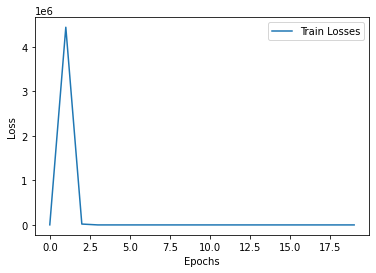

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2390.2675781
Epoch: 001, LR: 0.010000, Train Loss: 3874304.7500000
Epoch: 002, LR: 0.010000, Train Loss: 10119.9824219
Epoch: 003, LR: 0.010000, Train Loss: 2.5584249
Epoch: 004, LR: 0.010000, Train Loss: 1.4510752
Epoch: 005, LR: 0.010000, Train Loss: 1.4494369
Epoch: 006, LR: 0.010000, Train Loss: 1.4472269
Epoch: 007, LR: 0.010000, Train Loss: 1.4441688
Epoch: 008, LR: 0.010000, Train Loss: 1.4400192
Epoch: 009, LR: 0.010000, Train Loss: 1.4345247
Epoch: 010, LR: 0.010000, Train Loss: 1.4275289
Epoch: 011, LR: 0.010000, Train Loss: 1.4188652
Epoch: 012, LR: 0.010000, Train Loss: 1.4083776
Epoch: 013, LR: 0.010000, Train Loss: 1.3958809
Epoch: 014, LR: 0.010000, Train Loss: 1.3812530
Epoch: 015, LR: 0.010000, Train Loss: 1.3643693
Epoch: 016, LR: 0.010000, Train Loss: 1.3451213
Epoch: 017, LR: 0.010000, Train Loss: 1.3234364
Epoch: 018, LR: 0.010000, Train Loss: 1.2992797
Epoch: 019, LR

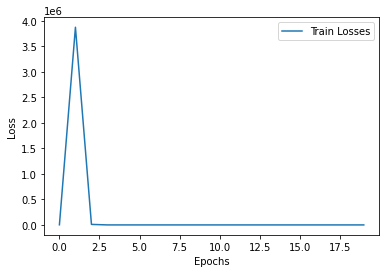

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1618.5808105
Epoch: 001, LR: 0.010000, Train Loss: 2745659.5000000
Epoch: 002, LR: 0.010000, Train Loss: 9351.3017578
Epoch: 003, LR: 0.010000, Train Loss: 1.4450616
Epoch: 004, LR: 0.010000, Train Loss: 1.4319545
Epoch: 005, LR: 0.010000, Train Loss: 1.4301667
Epoch: 006, LR: 0.010000, Train Loss: 1.4267044
Epoch: 007, LR: 0.010000, Train Loss: 1.4206904
Epoch: 008, LR: 0.010000, Train Loss: 1.4117090
Epoch: 009, LR: 0.010000, Train Loss: 1.3994353
Epoch: 010, LR: 0.010000, Train Loss: 1.3835145
Epoch: 011, LR: 0.010000, Train Loss: 1.3637184
Epoch: 012, LR: 0.010000, Train Loss: 1.3398455
Epoch: 013, LR: 0.010000, Train Loss: 1.3118858
Epoch: 014, LR: 0.010000, Train Loss: 1.2799021
Epoch: 015, LR: 0.010000, Train Loss: 1.2440783
Epoch: 016, LR: 0.010000, Train Loss: 1.2047731
Epoch: 017, LR: 0.010000, Train Loss: 1.1624564
Epoch: 018, LR: 0.010000, Train Loss: 1.1177409
Epoch: 019, LR:

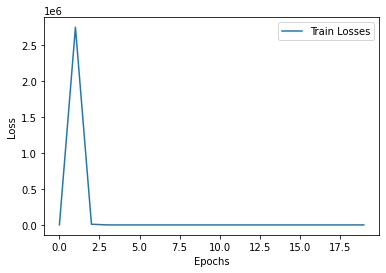

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2179.4499512
Epoch: 001, LR: 0.010000, Train Loss: 3035187.2500000
Epoch: 002, LR: 0.010000, Train Loss: 16976.3183594
Epoch: 003, LR: 0.010000, Train Loss: 1235.7443848
Epoch: 004, LR: 0.010000, Train Loss: 415.0446777
Epoch: 005, LR: 0.010000, Train Loss: 643.6781616
Epoch: 006, LR: 0.010000, Train Loss: 219.7993011
Epoch: 007, LR: 0.010000, Train Loss: 342.5820923
Epoch: 008, LR: 0.010000, Train Loss: 326.7543335
Epoch: 009, LR: 0.010000, Train Loss: 88.4940262
Epoch: 010, LR: 0.010000, Train Loss: 161.4363098
Epoch: 011, LR: 0.010000, Train Loss: 128.7430267
Epoch: 012, LR: 0.010000, Train Loss: 31.1120892
Epoch: 013, LR: 0.010000, Train Loss: 112.0425339
Epoch: 014, LR: 0.010000, Train Loss: 79.7238541
Epoch: 015, LR: 0.010000, Train Loss: 21.8056698
Epoch: 016, LR: 0.010000, Train Loss: 63.5459290
Epoch: 017, LR: 0.010000, Train Loss: 55.0034447
Epoch: 018, LR: 0.010000, Train Loss:

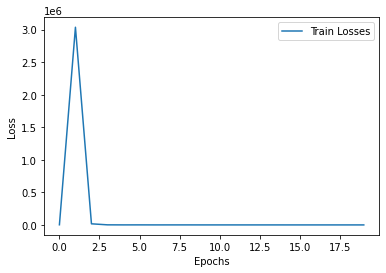

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1886.0458984
Epoch: 001, LR: 0.010000, Train Loss: 1072335.3750000
Epoch: 002, LR: 0.010000, Train Loss: 3940.0673828
Epoch: 003, LR: 0.010000, Train Loss: 1.3408475
Epoch: 004, LR: 0.010000, Train Loss: 1.2658930
Epoch: 005, LR: 0.010000, Train Loss: 1.2643384
Epoch: 006, LR: 0.010000, Train Loss: 1.2617769
Epoch: 007, LR: 0.010000, Train Loss: 1.2577761
Epoch: 008, LR: 0.010000, Train Loss: 1.2521359
Epoch: 009, LR: 0.010000, Train Loss: 1.2445985
Epoch: 010, LR: 0.010000, Train Loss: 1.2349840
Epoch: 011, LR: 0.010000, Train Loss: 1.2231401
Epoch: 012, LR: 0.010000, Train Loss: 1.2089279
Epoch: 013, LR: 0.010000, Train Loss: 1.1921564
Epoch: 014, LR: 0.010000, Train Loss: 1.1728756
Epoch: 015, LR: 0.010000, Train Loss: 1.1510992
Epoch: 016, LR: 0.010000, Train Loss: 1.1268898
Epoch: 017, LR: 0.010000, Train Loss: 1.1003511
Epoch: 018, LR: 0.010000, Train Loss: 1.0716548
Epoch: 019, LR:

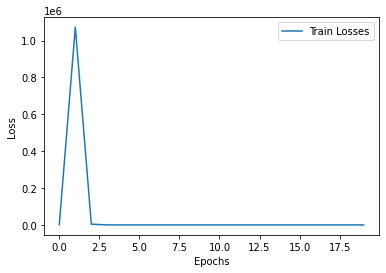

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2442.3002930
Epoch: 001, LR: 0.010000, Train Loss: 2622033.0000000
Epoch: 002, LR: 0.010000, Train Loss: 7376.8012695
Epoch: 003, LR: 0.010000, Train Loss: 1023.8334351
Epoch: 004, LR: 0.010000, Train Loss: 515.3309326
Epoch: 005, LR: 0.010000, Train Loss: 685.4573975
Epoch: 006, LR: 0.010000, Train Loss: 191.2976074
Epoch: 007, LR: 0.010000, Train Loss: 519.2846069
Epoch: 008, LR: 0.010000, Train Loss: 85.2250061
Epoch: 009, LR: 0.010000, Train Loss: 334.2993164
Epoch: 010, LR: 0.010000, Train Loss: 100.0747375
Epoch: 011, LR: 0.010000, Train Loss: 155.9264221
Epoch: 012, LR: 0.010000, Train Loss: 130.1151886
Epoch: 013, LR: 0.010000, Train Loss: 41.1923485
Epoch: 014, LR: 0.010000, Train Loss: 96.1134720
Epoch: 015, LR: 0.010000, Train Loss: 34.4165688
Epoch: 016, LR: 0.010000, Train Loss: 34.7071266
Epoch: 017, LR: 0.010000, Train Loss: 62.5850716
Epoch: 018, LR: 0.010000, Train Loss: 

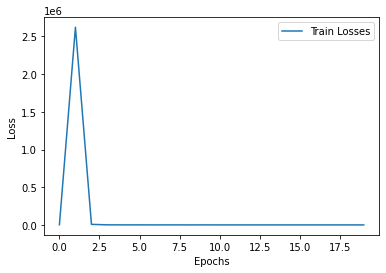

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 3589.8208008
Epoch: 001, LR: 0.010000, Train Loss: 1974981.0000000
Epoch: 002, LR: 0.010000, Train Loss: 11001.8408203
Epoch: 003, LR: 0.010000, Train Loss: 3.1242526
Epoch: 004, LR: 0.010000, Train Loss: 1.2033514
Epoch: 005, LR: 0.010000, Train Loss: 1.2022494
Epoch: 006, LR: 0.010000, Train Loss: 1.2003429
Epoch: 007, LR: 0.010000, Train Loss: 1.1973615
Epoch: 008, LR: 0.010000, Train Loss: 1.1932211
Epoch: 009, LR: 0.010000, Train Loss: 1.1877807
Epoch: 010, LR: 0.010000, Train Loss: 1.1808600
Epoch: 011, LR: 0.010000, Train Loss: 1.1722554
Epoch: 012, LR: 0.010000, Train Loss: 1.1618609
Epoch: 013, LR: 0.010000, Train Loss: 1.1495605
Epoch: 014, LR: 0.010000, Train Loss: 1.1352690
Epoch: 015, LR: 0.010000, Train Loss: 1.1188970
Epoch: 016, LR: 0.010000, Train Loss: 1.1004119
Epoch: 017, LR: 0.010000, Train Loss: 1.0797867
Epoch: 018, LR: 0.010000, Train Loss: 1.0570971
Epoch: 019, LR

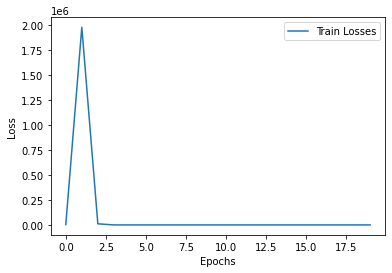

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2160.4172363
Epoch: 001, LR: 0.010000, Train Loss: 1706140.2500000
Epoch: 002, LR: 0.010000, Train Loss: 7386.5102539
Epoch: 003, LR: 0.010000, Train Loss: 1.4749467
Epoch: 004, LR: 0.010000, Train Loss: 1.3271490
Epoch: 005, LR: 0.010000, Train Loss: 1.3252069
Epoch: 006, LR: 0.010000, Train Loss: 1.3229253
Epoch: 007, LR: 0.010000, Train Loss: 1.3198831
Epoch: 008, LR: 0.010000, Train Loss: 1.3158606
Epoch: 009, LR: 0.010000, Train Loss: 1.3106474
Epoch: 010, LR: 0.010000, Train Loss: 1.3040234
Epoch: 011, LR: 0.010000, Train Loss: 1.2958289
Epoch: 012, LR: 0.010000, Train Loss: 1.2859471
Epoch: 013, LR: 0.010000, Train Loss: 1.2742382
Epoch: 014, LR: 0.010000, Train Loss: 1.2605598
Epoch: 015, LR: 0.010000, Train Loss: 1.2447915
Epoch: 016, LR: 0.010000, Train Loss: 1.2268816
Epoch: 017, LR: 0.010000, Train Loss: 1.2068058
Epoch: 018, LR: 0.010000, Train Loss: 1.1845750
Epoch: 019, LR:

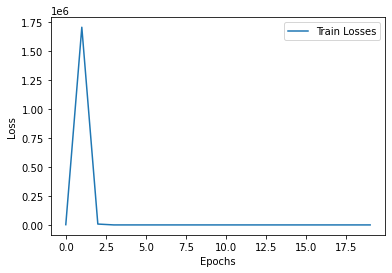

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1256.0227051
Epoch: 001, LR: 0.010000, Train Loss: 1844548.3750000
Epoch: 002, LR: 0.010000, Train Loss: 11484.2958984
Epoch: 003, LR: 0.010000, Train Loss: 1.1649040
Epoch: 004, LR: 0.010000, Train Loss: 1.1153228
Epoch: 005, LR: 0.010000, Train Loss: 1.1122231
Epoch: 006, LR: 0.010000, Train Loss: 1.1068543
Epoch: 007, LR: 0.010000, Train Loss: 1.0984975
Epoch: 008, LR: 0.010000, Train Loss: 1.0867411
Epoch: 009, LR: 0.010000, Train Loss: 1.0712124
Epoch: 010, LR: 0.010000, Train Loss: 1.0516722
Epoch: 011, LR: 0.010000, Train Loss: 1.0280581
Epoch: 012, LR: 0.010000, Train Loss: 1.0004293
Epoch: 013, LR: 0.010000, Train Loss: 0.9689829
Epoch: 014, LR: 0.010000, Train Loss: 0.9341789
Epoch: 015, LR: 0.010000, Train Loss: 0.8966666
Epoch: 016, LR: 0.010000, Train Loss: 0.8572952
Epoch: 017, LR: 0.010000, Train Loss: 0.8170944
Epoch: 018, LR: 0.010000, Train Loss: 0.7772284
Epoch: 019, LR

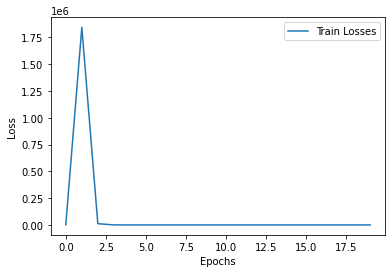

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2341.7844238
Epoch: 001, LR: 0.010000, Train Loss: 1502849.7500000
Epoch: 002, LR: 0.010000, Train Loss: 4083.7846680
Epoch: 003, LR: 0.010000, Train Loss: 0.9460677
Epoch: 004, LR: 0.010000, Train Loss: 0.8157689
Epoch: 005, LR: 0.010000, Train Loss: 0.8151029
Epoch: 006, LR: 0.010000, Train Loss: 0.8135228
Epoch: 007, LR: 0.010000, Train Loss: 0.8108654
Epoch: 008, LR: 0.010000, Train Loss: 0.8069687
Epoch: 009, LR: 0.010000, Train Loss: 0.8016603
Epoch: 010, LR: 0.010000, Train Loss: 0.7948048
Epoch: 011, LR: 0.010000, Train Loss: 0.7861093
Epoch: 012, LR: 0.010000, Train Loss: 0.7755318
Epoch: 013, LR: 0.010000, Train Loss: 0.7629945
Epoch: 014, LR: 0.010000, Train Loss: 0.7484648
Epoch: 015, LR: 0.010000, Train Loss: 0.7319371
Epoch: 016, LR: 0.010000, Train Loss: 0.7134877
Epoch: 017, LR: 0.010000, Train Loss: 0.6932536
Epoch: 018, LR: 0.010000, Train Loss: 0.6714454
Epoch: 019, LR:

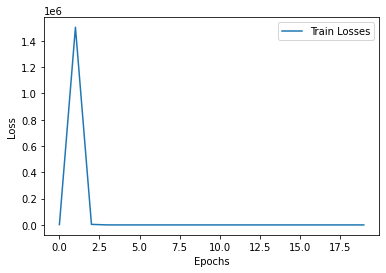

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2436.5903320
Epoch: 001, LR: 0.010000, Train Loss: 1343998.8750000
Epoch: 002, LR: 0.010000, Train Loss: 6219.3984375
Epoch: 003, LR: 0.010000, Train Loss: 1.3446797
Epoch: 004, LR: 0.010000, Train Loss: 1.1603761
Epoch: 005, LR: 0.010000, Train Loss: 1.1597756
Epoch: 006, LR: 0.010000, Train Loss: 1.1591133
Epoch: 007, LR: 0.010000, Train Loss: 1.1583383
Epoch: 008, LR: 0.010000, Train Loss: 1.1573256
Epoch: 009, LR: 0.010000, Train Loss: 1.1560645
Epoch: 010, LR: 0.010000, Train Loss: 1.1545086
Epoch: 011, LR: 0.010000, Train Loss: 1.1525853
Epoch: 012, LR: 0.010000, Train Loss: 1.1502163
Epoch: 013, LR: 0.010000, Train Loss: 1.1473477
Epoch: 014, LR: 0.010000, Train Loss: 1.1438947
Epoch: 015, LR: 0.010000, Train Loss: 1.1397634
Epoch: 016, LR: 0.010000, Train Loss: 1.1348777
Epoch: 017, LR: 0.010000, Train Loss: 1.1291608
Epoch: 018, LR: 0.010000, Train Loss: 1.1225491
Epoch: 019, LR:

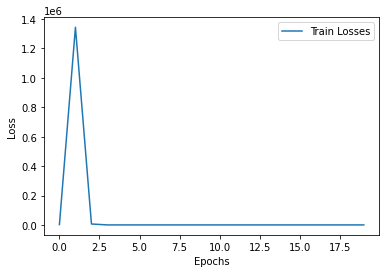

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1951.6051025
Epoch: 001, LR: 0.010000, Train Loss: 1325595.3750000
Epoch: 002, LR: 0.010000, Train Loss: 11259.7226562
Epoch: 003, LR: 0.010000, Train Loss: 1.6401455
Epoch: 004, LR: 0.010000, Train Loss: 1.2173474
Epoch: 005, LR: 0.010000, Train Loss: 1.2154083
Epoch: 006, LR: 0.010000, Train Loss: 1.2119416
Epoch: 007, LR: 0.010000, Train Loss: 1.2068398
Epoch: 008, LR: 0.010000, Train Loss: 1.1999120
Epoch: 009, LR: 0.010000, Train Loss: 1.1910338
Epoch: 010, LR: 0.010000, Train Loss: 1.1799592
Epoch: 011, LR: 0.010000, Train Loss: 1.1664599
Epoch: 012, LR: 0.010000, Train Loss: 1.1504413
Epoch: 013, LR: 0.010000, Train Loss: 1.1317526
Epoch: 014, LR: 0.010000, Train Loss: 1.1103227
Epoch: 015, LR: 0.010000, Train Loss: 1.0861337
Epoch: 016, LR: 0.010000, Train Loss: 1.0592225
Epoch: 017, LR: 0.010000, Train Loss: 1.0297318
Epoch: 018, LR: 0.010000, Train Loss: 0.9978930
Epoch: 019, LR

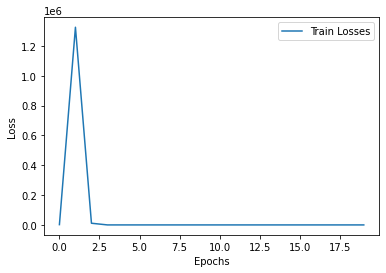

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1978.7105713
Epoch: 001, LR: 0.010000, Train Loss: 1338433.3750000
Epoch: 002, LR: 0.010000, Train Loss: 3612.6164551
Epoch: 003, LR: 0.010000, Train Loss: 1.1168997
Epoch: 004, LR: 0.010000, Train Loss: 1.1083039
Epoch: 005, LR: 0.010000, Train Loss: 1.1057856
Epoch: 006, LR: 0.010000, Train Loss: 1.1016978
Epoch: 007, LR: 0.010000, Train Loss: 1.0958327
Epoch: 008, LR: 0.010000, Train Loss: 1.0879153
Epoch: 009, LR: 0.010000, Train Loss: 1.0777301
Epoch: 010, LR: 0.010000, Train Loss: 1.0651577
Epoch: 011, LR: 0.010000, Train Loss: 1.0501280
Epoch: 012, LR: 0.010000, Train Loss: 1.0326099
Epoch: 013, LR: 0.010000, Train Loss: 1.0126419
Epoch: 014, LR: 0.010000, Train Loss: 0.9903070
Epoch: 015, LR: 0.010000, Train Loss: 0.9657449
Epoch: 016, LR: 0.010000, Train Loss: 0.9391536
Epoch: 017, LR: 0.010000, Train Loss: 0.9107813
Epoch: 018, LR: 0.010000, Train Loss: 0.8809234
Epoch: 019, LR:

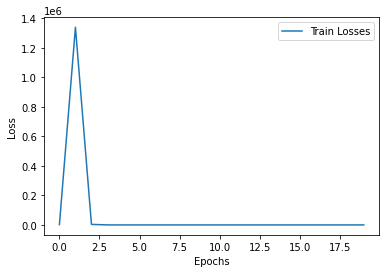

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2737.6174316
Epoch: 001, LR: 0.010000, Train Loss: 4537878.5000000
Epoch: 002, LR: 0.010000, Train Loss: 17634.9042969
Epoch: 003, LR: 0.010000, Train Loss: 249.0838928
Epoch: 004, LR: 0.010000, Train Loss: 2.7036352
Epoch: 005, LR: 0.010000, Train Loss: 1.1890709
Epoch: 006, LR: 0.010000, Train Loss: 1.0902106
Epoch: 007, LR: 0.010000, Train Loss: 1.0886880
Epoch: 008, LR: 0.010000, Train Loss: 1.0875980
Epoch: 009, LR: 0.010000, Train Loss: 1.0860119
Epoch: 010, LR: 0.010000, Train Loss: 1.0837967
Epoch: 011, LR: 0.010000, Train Loss: 1.0809039
Epoch: 012, LR: 0.010000, Train Loss: 1.0772357
Epoch: 013, LR: 0.010000, Train Loss: 1.0727093
Epoch: 014, LR: 0.010000, Train Loss: 1.0672351
Epoch: 015, LR: 0.010000, Train Loss: 1.0607518
Epoch: 016, LR: 0.010000, Train Loss: 1.0531614
Epoch: 017, LR: 0.010000, Train Loss: 1.0443950
Epoch: 018, LR: 0.010000, Train Loss: 1.0343874
Epoch: 019, 

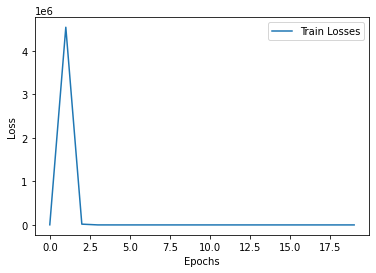

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2658.9836426
Epoch: 001, LR: 0.010000, Train Loss: 2318996.0000000
Epoch: 002, LR: 0.010000, Train Loss: 7578.3823242
Epoch: 003, LR: 0.010000, Train Loss: 1.2618812
Epoch: 004, LR: 0.010000, Train Loss: 0.9652830
Epoch: 005, LR: 0.010000, Train Loss: 0.9646610
Epoch: 006, LR: 0.010000, Train Loss: 0.9635293
Epoch: 007, LR: 0.010000, Train Loss: 0.9615417
Epoch: 008, LR: 0.010000, Train Loss: 0.9586335
Epoch: 009, LR: 0.010000, Train Loss: 0.9545420
Epoch: 010, LR: 0.010000, Train Loss: 0.9492013
Epoch: 011, LR: 0.010000, Train Loss: 0.9424427
Epoch: 012, LR: 0.010000, Train Loss: 0.9340723
Epoch: 013, LR: 0.010000, Train Loss: 0.9239575
Epoch: 014, LR: 0.010000, Train Loss: 0.9119629
Epoch: 015, LR: 0.010000, Train Loss: 0.8979938
Epoch: 016, LR: 0.010000, Train Loss: 0.8819679
Epoch: 017, LR: 0.010000, Train Loss: 0.8638491
Epoch: 018, LR: 0.010000, Train Loss: 0.8436450
Epoch: 019, LR:

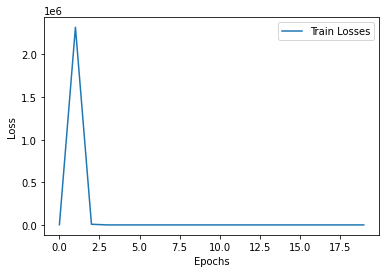

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1994.8489990
Epoch: 001, LR: 0.010000, Train Loss: 2727787.7500000
Epoch: 002, LR: 0.010000, Train Loss: 5643.9628906
Epoch: 003, LR: 0.010000, Train Loss: 1.1710140
Epoch: 004, LR: 0.010000, Train Loss: 1.1528051
Epoch: 005, LR: 0.010000, Train Loss: 1.1503000
Epoch: 006, LR: 0.010000, Train Loss: 1.1467266
Epoch: 007, LR: 0.010000, Train Loss: 1.1415834
Epoch: 008, LR: 0.010000, Train Loss: 1.1344877
Epoch: 009, LR: 0.010000, Train Loss: 1.1251894
Epoch: 010, LR: 0.010000, Train Loss: 1.1135104
Epoch: 011, LR: 0.010000, Train Loss: 1.0992846
Epoch: 012, LR: 0.010000, Train Loss: 1.0823561
Epoch: 013, LR: 0.010000, Train Loss: 1.0625867
Epoch: 014, LR: 0.010000, Train Loss: 1.0400645
Epoch: 015, LR: 0.010000, Train Loss: 1.0148773
Epoch: 016, LR: 0.010000, Train Loss: 0.9871700
Epoch: 017, LR: 0.010000, Train Loss: 0.9571642
Epoch: 018, LR: 0.010000, Train Loss: 0.9251681
Epoch: 019, LR:

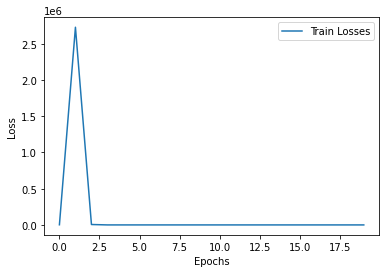

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2528.4589844
Epoch: 001, LR: 0.010000, Train Loss: 3647720.7500000
Epoch: 002, LR: 0.010000, Train Loss: 8477.7675781
Epoch: 003, LR: 0.010000, Train Loss: 1.6559908
Epoch: 004, LR: 0.010000, Train Loss: 0.8567829
Epoch: 005, LR: 0.010000, Train Loss: 0.8554838
Epoch: 006, LR: 0.010000, Train Loss: 0.8535531
Epoch: 007, LR: 0.010000, Train Loss: 0.8505815
Epoch: 008, LR: 0.010000, Train Loss: 0.8464205
Epoch: 009, LR: 0.010000, Train Loss: 0.8408591
Epoch: 010, LR: 0.010000, Train Loss: 0.8338110
Epoch: 011, LR: 0.010000, Train Loss: 0.8251845
Epoch: 012, LR: 0.010000, Train Loss: 0.8148963
Epoch: 013, LR: 0.010000, Train Loss: 0.8028797
Epoch: 014, LR: 0.010000, Train Loss: 0.7890996
Epoch: 015, LR: 0.010000, Train Loss: 0.7735577
Epoch: 016, LR: 0.010000, Train Loss: 0.7562921
Epoch: 017, LR: 0.010000, Train Loss: 0.7373886
Epoch: 018, LR: 0.010000, Train Loss: 0.7169825
Epoch: 019, LR:

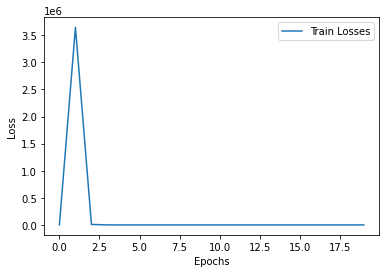

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2260.6894531
Epoch: 001, LR: 0.010000, Train Loss: 3635964.0000000
Epoch: 002, LR: 0.010000, Train Loss: 4521.9624023
Epoch: 003, LR: 0.010000, Train Loss: 2.0316153
Epoch: 004, LR: 0.010000, Train Loss: 0.9445301
Epoch: 005, LR: 0.010000, Train Loss: 0.9434902
Epoch: 006, LR: 0.010000, Train Loss: 0.9410727
Epoch: 007, LR: 0.010000, Train Loss: 0.9371830
Epoch: 008, LR: 0.010000, Train Loss: 0.9317324
Epoch: 009, LR: 0.010000, Train Loss: 0.9246604
Epoch: 010, LR: 0.010000, Train Loss: 0.9158303
Epoch: 011, LR: 0.010000, Train Loss: 0.9051151
Epoch: 012, LR: 0.010000, Train Loss: 0.8924676
Epoch: 013, LR: 0.010000, Train Loss: 0.8778520
Epoch: 014, LR: 0.010000, Train Loss: 0.8612272
Epoch: 015, LR: 0.010000, Train Loss: 0.8426340
Epoch: 016, LR: 0.010000, Train Loss: 0.8221424
Epoch: 017, LR: 0.010000, Train Loss: 0.7998919
Epoch: 018, LR: 0.010000, Train Loss: 0.7760851
Epoch: 019, LR:

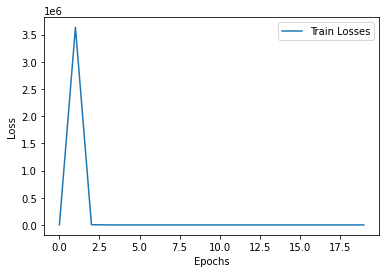

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2482.1740723
Epoch: 001, LR: 0.010000, Train Loss: 3279142.5000000
Epoch: 002, LR: 0.010000, Train Loss: 16917.8378906
Epoch: 003, LR: 0.010000, Train Loss: 554.9254150
Epoch: 004, LR: 0.010000, Train Loss: 263.1742249
Epoch: 005, LR: 0.010000, Train Loss: 161.9127045
Epoch: 006, LR: 0.010000, Train Loss: 137.0599060
Epoch: 007, LR: 0.010000, Train Loss: 88.6547394
Epoch: 008, LR: 0.010000, Train Loss: 72.1286850
Epoch: 009, LR: 0.010000, Train Loss: 58.4601936
Epoch: 010, LR: 0.010000, Train Loss: 40.5716095
Epoch: 011, LR: 0.010000, Train Loss: 40.2456398
Epoch: 012, LR: 0.010000, Train Loss: 23.5905762
Epoch: 013, LR: 0.010000, Train Loss: 29.7530899
Epoch: 014, LR: 0.010000, Train Loss: 17.1886063
Epoch: 015, LR: 0.010000, Train Loss: 23.2094460
Epoch: 016, LR: 0.010000, Train Loss: 14.6927490
Epoch: 017, LR: 0.010000, Train Loss: 19.0422802
Epoch: 018, LR: 0.010000, Train Loss: 14.84

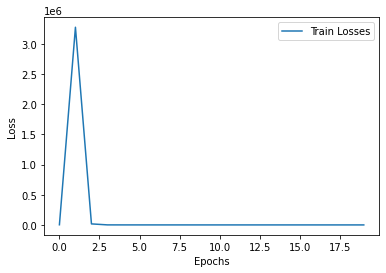

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2203.3364258
Epoch: 001, LR: 0.010000, Train Loss: 3927012.2500000
Epoch: 002, LR: 0.010000, Train Loss: 19799.7421875
Epoch: 003, LR: 0.010000, Train Loss: 7.0846672
Epoch: 004, LR: 0.010000, Train Loss: 1.0901594
Epoch: 005, LR: 0.010000, Train Loss: 1.0896486
Epoch: 006, LR: 0.010000, Train Loss: 1.0887244
Epoch: 007, LR: 0.010000, Train Loss: 1.0871257
Epoch: 008, LR: 0.010000, Train Loss: 1.0847459
Epoch: 009, LR: 0.010000, Train Loss: 1.0814109
Epoch: 010, LR: 0.010000, Train Loss: 1.0769482
Epoch: 011, LR: 0.010000, Train Loss: 1.0712136
Epoch: 012, LR: 0.010000, Train Loss: 1.0640314
Epoch: 013, LR: 0.010000, Train Loss: 1.0552616
Epoch: 014, LR: 0.010000, Train Loss: 1.0447941
Epoch: 015, LR: 0.010000, Train Loss: 1.0325238
Epoch: 016, LR: 0.010000, Train Loss: 1.0183699
Epoch: 017, LR: 0.010000, Train Loss: 1.0022753
Epoch: 018, LR: 0.010000, Train Loss: 0.9842161
Epoch: 019, LR

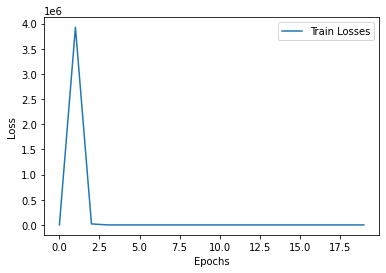

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1806.6181641
Epoch: 001, LR: 0.010000, Train Loss: 4203382.0000000
Epoch: 002, LR: 0.010000, Train Loss: 11158.9863281
Epoch: 003, LR: 0.010000, Train Loss: 1.0860099
Epoch: 004, LR: 0.010000, Train Loss: 0.9670891
Epoch: 005, LR: 0.010000, Train Loss: 0.9660680
Epoch: 006, LR: 0.010000, Train Loss: 0.9641128
Epoch: 007, LR: 0.010000, Train Loss: 0.9610467
Epoch: 008, LR: 0.010000, Train Loss: 0.9566664
Epoch: 009, LR: 0.010000, Train Loss: 0.9508944
Epoch: 010, LR: 0.010000, Train Loss: 0.9435822
Epoch: 011, LR: 0.010000, Train Loss: 0.9345695
Epoch: 012, LR: 0.010000, Train Loss: 0.9236704
Epoch: 013, LR: 0.010000, Train Loss: 0.9108045
Epoch: 014, LR: 0.010000, Train Loss: 0.8959226
Epoch: 015, LR: 0.010000, Train Loss: 0.8789794
Epoch: 016, LR: 0.010000, Train Loss: 0.8599871
Epoch: 017, LR: 0.010000, Train Loss: 0.8390052
Epoch: 018, LR: 0.010000, Train Loss: 0.8161708
Epoch: 019, LR

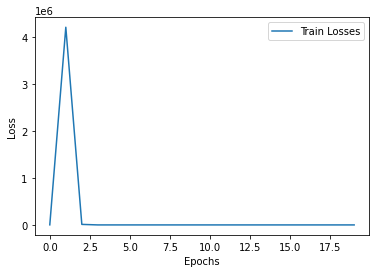

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2449.7312012
Epoch: 001, LR: 0.010000, Train Loss: 1918535.2500000
Epoch: 002, LR: 0.010000, Train Loss: 4739.7954102
Epoch: 003, LR: 0.010000, Train Loss: 6.1346612
Epoch: 004, LR: 0.010000, Train Loss: 1.1466827
Epoch: 005, LR: 0.010000, Train Loss: 1.1461332
Epoch: 006, LR: 0.010000, Train Loss: 1.1443374
Epoch: 007, LR: 0.010000, Train Loss: 1.1407465
Epoch: 008, LR: 0.010000, Train Loss: 1.1351539
Epoch: 009, LR: 0.010000, Train Loss: 1.1272964
Epoch: 010, LR: 0.010000, Train Loss: 1.1169381
Epoch: 011, LR: 0.010000, Train Loss: 1.1039674
Epoch: 012, LR: 0.010000, Train Loss: 1.0882906
Epoch: 013, LR: 0.010000, Train Loss: 1.0698725
Epoch: 014, LR: 0.010000, Train Loss: 1.0487725
Epoch: 015, LR: 0.010000, Train Loss: 1.0250856
Epoch: 016, LR: 0.010000, Train Loss: 0.9989596
Epoch: 017, LR: 0.010000, Train Loss: 0.9706423
Epoch: 018, LR: 0.010000, Train Loss: 0.9404608
Epoch: 019, LR:

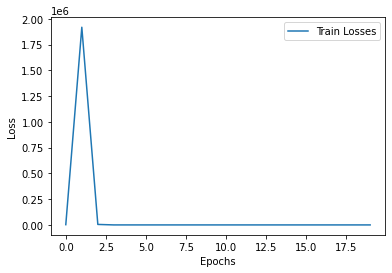

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2718.1520996
Epoch: 001, LR: 0.010000, Train Loss: 3193173.5000000
Epoch: 002, LR: 0.010000, Train Loss: 7473.3232422
Epoch: 003, LR: 0.010000, Train Loss: 1.0646640
Epoch: 004, LR: 0.010000, Train Loss: 0.9323522
Epoch: 005, LR: 0.010000, Train Loss: 0.9309088
Epoch: 006, LR: 0.010000, Train Loss: 0.9286695
Epoch: 007, LR: 0.010000, Train Loss: 0.9252663
Epoch: 008, LR: 0.010000, Train Loss: 0.9205469
Epoch: 009, LR: 0.010000, Train Loss: 0.9142821
Epoch: 010, LR: 0.010000, Train Loss: 0.9062896
Epoch: 011, LR: 0.010000, Train Loss: 0.8964204
Epoch: 012, LR: 0.010000, Train Loss: 0.8845342
Epoch: 013, LR: 0.010000, Train Loss: 0.8704498
Epoch: 014, LR: 0.010000, Train Loss: 0.8542247
Epoch: 015, LR: 0.010000, Train Loss: 0.8358424
Epoch: 016, LR: 0.010000, Train Loss: 0.8153580
Epoch: 017, LR: 0.010000, Train Loss: 0.7928972
Epoch: 018, LR: 0.010000, Train Loss: 0.7686613
Epoch: 019, LR:

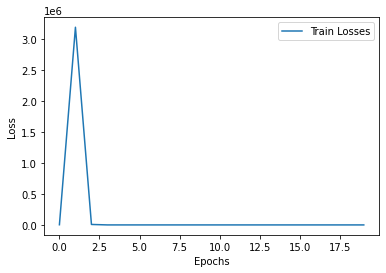

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1334.8826904
Epoch: 001, LR: 0.010000, Train Loss: 3525780.5000000
Epoch: 002, LR: 0.010000, Train Loss: 11315.7490234
Epoch: 003, LR: 0.010000, Train Loss: 1.8780966
Epoch: 004, LR: 0.010000, Train Loss: 1.0115210
Epoch: 005, LR: 0.010000, Train Loss: 1.0103514
Epoch: 006, LR: 0.010000, Train Loss: 1.0086117
Epoch: 007, LR: 0.010000, Train Loss: 1.0058028
Epoch: 008, LR: 0.010000, Train Loss: 1.0016391
Epoch: 009, LR: 0.010000, Train Loss: 0.9958665
Epoch: 010, LR: 0.010000, Train Loss: 0.9882405
Epoch: 011, LR: 0.010000, Train Loss: 0.9785527
Epoch: 012, LR: 0.010000, Train Loss: 0.9665881
Epoch: 013, LR: 0.010000, Train Loss: 0.9522731
Epoch: 014, LR: 0.010000, Train Loss: 0.9355243
Epoch: 015, LR: 0.010000, Train Loss: 0.9163142
Epoch: 016, LR: 0.010000, Train Loss: 0.8947039
Epoch: 017, LR: 0.010000, Train Loss: 0.8708146
Epoch: 018, LR: 0.010000, Train Loss: 0.8448531
Epoch: 019, LR

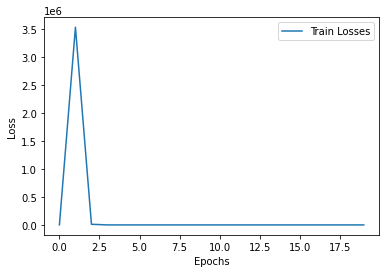

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2118.8579102
Epoch: 001, LR: 0.010000, Train Loss: 4532486.5000000
Epoch: 002, LR: 0.010000, Train Loss: 25666.3339844
Epoch: 003, LR: 0.010000, Train Loss: 0.9747867
Epoch: 004, LR: 0.010000, Train Loss: 0.7990892
Epoch: 005, LR: 0.010000, Train Loss: 0.7969932
Epoch: 006, LR: 0.010000, Train Loss: 0.7944180
Epoch: 007, LR: 0.010000, Train Loss: 0.7909401
Epoch: 008, LR: 0.010000, Train Loss: 0.7864864
Epoch: 009, LR: 0.010000, Train Loss: 0.7809252
Epoch: 010, LR: 0.010000, Train Loss: 0.7741417
Epoch: 011, LR: 0.010000, Train Loss: 0.7660447
Epoch: 012, LR: 0.010000, Train Loss: 0.7565720
Epoch: 013, LR: 0.010000, Train Loss: 0.7456573
Epoch: 014, LR: 0.010000, Train Loss: 0.7332669
Epoch: 015, LR: 0.010000, Train Loss: 0.7194120
Epoch: 016, LR: 0.010000, Train Loss: 0.7041371
Epoch: 017, LR: 0.010000, Train Loss: 0.6875206
Epoch: 018, LR: 0.010000, Train Loss: 0.6696683
Epoch: 019, LR

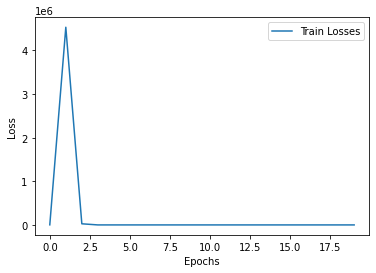

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1766.5753174
Epoch: 001, LR: 0.010000, Train Loss: 2279773.0000000
Epoch: 002, LR: 0.010000, Train Loss: 7343.7412109
Epoch: 003, LR: 0.010000, Train Loss: 4.6043701
Epoch: 004, LR: 0.010000, Train Loss: 1.1902795
Epoch: 005, LR: 0.010000, Train Loss: 1.1899599
Epoch: 006, LR: 0.010000, Train Loss: 1.1891671
Epoch: 007, LR: 0.010000, Train Loss: 1.1877325
Epoch: 008, LR: 0.010000, Train Loss: 1.1856257
Epoch: 009, LR: 0.010000, Train Loss: 1.1827941
Epoch: 010, LR: 0.010000, Train Loss: 1.1790447
Epoch: 011, LR: 0.010000, Train Loss: 1.1742027
Epoch: 012, LR: 0.010000, Train Loss: 1.1681219
Epoch: 013, LR: 0.010000, Train Loss: 1.1606507
Epoch: 014, LR: 0.010000, Train Loss: 1.1516510
Epoch: 015, LR: 0.010000, Train Loss: 1.1410168
Epoch: 016, LR: 0.010000, Train Loss: 1.1286635
Epoch: 017, LR: 0.010000, Train Loss: 1.1145322
Epoch: 018, LR: 0.010000, Train Loss: 1.0985887
Epoch: 019, LR:

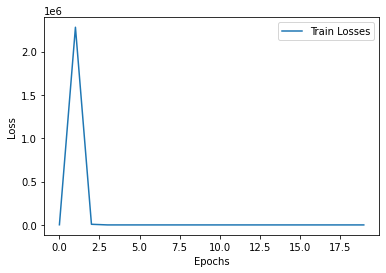

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2644.2485352
Epoch: 001, LR: 0.010000, Train Loss: 2321499.0000000
Epoch: 002, LR: 0.010000, Train Loss: 10573.0498047
Epoch: 003, LR: 0.010000, Train Loss: 1616.4742432
Epoch: 004, LR: 0.010000, Train Loss: 187.9519958
Epoch: 005, LR: 0.010000, Train Loss: 237.5519714
Epoch: 006, LR: 0.010000, Train Loss: 220.6994019
Epoch: 007, LR: 0.010000, Train Loss: 129.3127747
Epoch: 008, LR: 0.010000, Train Loss: 81.4455338
Epoch: 009, LR: 0.010000, Train Loss: 47.6081810
Epoch: 010, LR: 0.010000, Train Loss: 58.8151932
Epoch: 011, LR: 0.010000, Train Loss: 41.7571564
Epoch: 012, LR: 0.010000, Train Loss: 12.3135452
Epoch: 013, LR: 0.010000, Train Loss: 5.1308560
Epoch: 014, LR: 0.010000, Train Loss: 1.8592985
Epoch: 015, LR: 0.010000, Train Loss: 1.4952284
Epoch: 016, LR: 0.010000, Train Loss: 1.3704097
Epoch: 017, LR: 0.010000, Train Loss: 1.3303045
Epoch: 018, LR: 0.010000, Train Loss: 1.328088

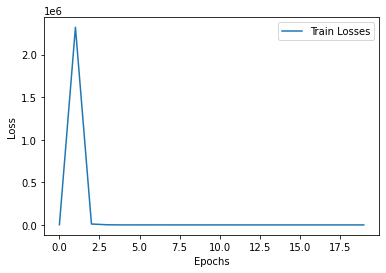

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2160.0351562
Epoch: 001, LR: 0.010000, Train Loss: 2998642.0000000
Epoch: 002, LR: 0.010000, Train Loss: 15406.0947266
Epoch: 003, LR: 0.010000, Train Loss: 3.5335426
Epoch: 004, LR: 0.010000, Train Loss: 0.7655994
Epoch: 005, LR: 0.010000, Train Loss: 0.7647784
Epoch: 006, LR: 0.010000, Train Loss: 0.7635190
Epoch: 007, LR: 0.010000, Train Loss: 0.7615263
Epoch: 008, LR: 0.010000, Train Loss: 0.7587148
Epoch: 009, LR: 0.010000, Train Loss: 0.7550052
Epoch: 010, LR: 0.010000, Train Loss: 0.7502946
Epoch: 011, LR: 0.010000, Train Loss: 0.7445287
Epoch: 012, LR: 0.010000, Train Loss: 0.7376360
Epoch: 013, LR: 0.010000, Train Loss: 0.7295610
Epoch: 014, LR: 0.010000, Train Loss: 0.7202648
Epoch: 015, LR: 0.010000, Train Loss: 0.7097127
Epoch: 016, LR: 0.010000, Train Loss: 0.6978844
Epoch: 017, LR: 0.010000, Train Loss: 0.6847988
Epoch: 018, LR: 0.010000, Train Loss: 0.6704829
Epoch: 019, LR

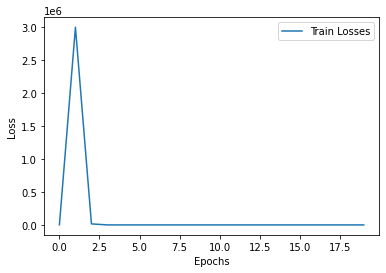

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1851.4700928
Epoch: 001, LR: 0.010000, Train Loss: 1907446.8750000
Epoch: 002, LR: 0.010000, Train Loss: 3544.6608887
Epoch: 003, LR: 0.010000, Train Loss: 1.1028473
Epoch: 004, LR: 0.010000, Train Loss: 1.1012262
Epoch: 005, LR: 0.010000, Train Loss: 1.1002133
Epoch: 006, LR: 0.010000, Train Loss: 1.0982039
Epoch: 007, LR: 0.010000, Train Loss: 1.0947813
Epoch: 008, LR: 0.010000, Train Loss: 1.0897206
Epoch: 009, LR: 0.010000, Train Loss: 1.0828434
Epoch: 010, LR: 0.010000, Train Loss: 1.0739688
Epoch: 011, LR: 0.010000, Train Loss: 1.0629588
Epoch: 012, LR: 0.010000, Train Loss: 1.0497519
Epoch: 013, LR: 0.010000, Train Loss: 1.0342474
Epoch: 014, LR: 0.010000, Train Loss: 1.0163474
Epoch: 015, LR: 0.010000, Train Loss: 0.9961201
Epoch: 016, LR: 0.010000, Train Loss: 0.9736271
Epoch: 017, LR: 0.010000, Train Loss: 0.9489968
Epoch: 018, LR: 0.010000, Train Loss: 0.9224308
Epoch: 019, LR:

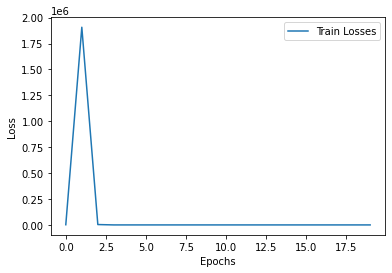

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2080.5583496
Epoch: 001, LR: 0.010000, Train Loss: 2598732.5000000
Epoch: 002, LR: 0.010000, Train Loss: 4840.3554688
Epoch: 003, LR: 0.010000, Train Loss: 1.1796919
Epoch: 004, LR: 0.010000, Train Loss: 1.0555323
Epoch: 005, LR: 0.010000, Train Loss: 1.0546864
Epoch: 006, LR: 0.010000, Train Loss: 1.0522035
Epoch: 007, LR: 0.010000, Train Loss: 1.0478755
Epoch: 008, LR: 0.010000, Train Loss: 1.0415763
Epoch: 009, LR: 0.010000, Train Loss: 1.0331067
Epoch: 010, LR: 0.010000, Train Loss: 1.0222342
Epoch: 011, LR: 0.010000, Train Loss: 1.0086740
Epoch: 012, LR: 0.010000, Train Loss: 0.9922626
Epoch: 013, LR: 0.010000, Train Loss: 0.9729679
Epoch: 014, LR: 0.010000, Train Loss: 0.9507762
Epoch: 015, LR: 0.010000, Train Loss: 0.9257753
Epoch: 016, LR: 0.010000, Train Loss: 0.8981329
Epoch: 017, LR: 0.010000, Train Loss: 0.8681300
Epoch: 018, LR: 0.010000, Train Loss: 0.8361785
Epoch: 019, LR:

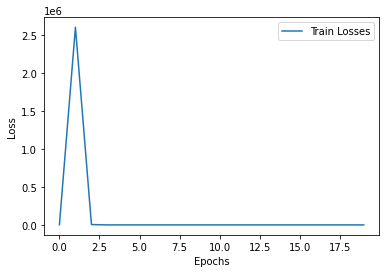

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1714.5595703
Epoch: 001, LR: 0.010000, Train Loss: 2122901.0000000
Epoch: 002, LR: 0.010000, Train Loss: 7449.7358398
Epoch: 003, LR: 0.010000, Train Loss: 2.4215631
Epoch: 004, LR: 0.010000, Train Loss: 1.4334593
Epoch: 005, LR: 0.010000, Train Loss: 1.2470927
Epoch: 006, LR: 0.010000, Train Loss: 1.2432622
Epoch: 007, LR: 0.010000, Train Loss: 1.2413487
Epoch: 008, LR: 0.010000, Train Loss: 1.2385526
Epoch: 009, LR: 0.010000, Train Loss: 1.2347908
Epoch: 010, LR: 0.010000, Train Loss: 1.2299913
Epoch: 011, LR: 0.010000, Train Loss: 1.2240980
Epoch: 012, LR: 0.010000, Train Loss: 1.2169545
Epoch: 013, LR: 0.010000, Train Loss: 1.2084421
Epoch: 014, LR: 0.010000, Train Loss: 1.1984413
Epoch: 015, LR: 0.010000, Train Loss: 1.1868455
Epoch: 016, LR: 0.010000, Train Loss: 1.1735278
Epoch: 017, LR: 0.010000, Train Loss: 1.1583723
Epoch: 018, LR: 0.010000, Train Loss: 1.1412742
Epoch: 019, LR:

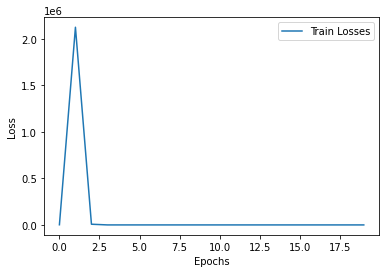

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1533.4248047
Epoch: 001, LR: 0.010000, Train Loss: 3337911.5000000
Epoch: 002, LR: 0.010000, Train Loss: 8690.4052734
Epoch: 003, LR: 0.010000, Train Loss: 1.4794936
Epoch: 004, LR: 0.010000, Train Loss: 0.9134844
Epoch: 005, LR: 0.010000, Train Loss: 0.9131962
Epoch: 006, LR: 0.010000, Train Loss: 0.9123607
Epoch: 007, LR: 0.010000, Train Loss: 0.9107823
Epoch: 008, LR: 0.010000, Train Loss: 0.9084674
Epoch: 009, LR: 0.010000, Train Loss: 0.9053104
Epoch: 010, LR: 0.010000, Train Loss: 0.9012316
Epoch: 011, LR: 0.010000, Train Loss: 0.8960901
Epoch: 012, LR: 0.010000, Train Loss: 0.8897427
Epoch: 013, LR: 0.010000, Train Loss: 0.8820434
Epoch: 014, LR: 0.010000, Train Loss: 0.8728410
Epoch: 015, LR: 0.010000, Train Loss: 0.8620359
Epoch: 016, LR: 0.010000, Train Loss: 0.8495148
Epoch: 017, LR: 0.010000, Train Loss: 0.8351895
Epoch: 018, LR: 0.010000, Train Loss: 0.8190013
Epoch: 019, LR:

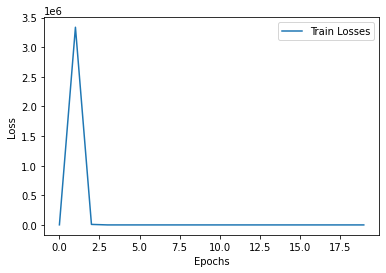

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2044.0177002
Epoch: 001, LR: 0.010000, Train Loss: 2033388.2500000
Epoch: 002, LR: 0.010000, Train Loss: 6588.0581055
Epoch: 003, LR: 0.010000, Train Loss: 1.0576037
Epoch: 004, LR: 0.010000, Train Loss: 0.8422690
Epoch: 005, LR: 0.010000, Train Loss: 0.8410373
Epoch: 006, LR: 0.010000, Train Loss: 0.8392708
Epoch: 007, LR: 0.010000, Train Loss: 0.8365281
Epoch: 008, LR: 0.010000, Train Loss: 0.8326677
Epoch: 009, LR: 0.010000, Train Loss: 0.8275208
Epoch: 010, LR: 0.010000, Train Loss: 0.8209823
Epoch: 011, LR: 0.010000, Train Loss: 0.8129243
Epoch: 012, LR: 0.010000, Train Loss: 0.8032208
Epoch: 013, LR: 0.010000, Train Loss: 0.7917892
Epoch: 014, LR: 0.010000, Train Loss: 0.7785783
Epoch: 015, LR: 0.010000, Train Loss: 0.7635630
Epoch: 016, LR: 0.010000, Train Loss: 0.7467531
Epoch: 017, LR: 0.010000, Train Loss: 0.7282155
Epoch: 018, LR: 0.010000, Train Loss: 0.7080613
Epoch: 019, LR:

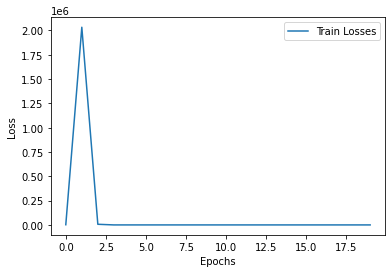

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2503.9033203
Epoch: 001, LR: 0.010000, Train Loss: 3704592.0000000
Epoch: 002, LR: 0.010000, Train Loss: 11137.5527344
Epoch: 003, LR: 0.010000, Train Loss: 3.7172768
Epoch: 004, LR: 0.010000, Train Loss: 1.1546301
Epoch: 005, LR: 0.010000, Train Loss: 1.1545360
Epoch: 006, LR: 0.010000, Train Loss: 1.1538587
Epoch: 007, LR: 0.010000, Train Loss: 1.1524875
Epoch: 008, LR: 0.010000, Train Loss: 1.1503762
Epoch: 009, LR: 0.010000, Train Loss: 1.1473508
Epoch: 010, LR: 0.010000, Train Loss: 1.1433228
Epoch: 011, LR: 0.010000, Train Loss: 1.1382229
Epoch: 012, LR: 0.010000, Train Loss: 1.1319503
Epoch: 013, LR: 0.010000, Train Loss: 1.1243922
Epoch: 014, LR: 0.010000, Train Loss: 1.1154171
Epoch: 015, LR: 0.010000, Train Loss: 1.1048858
Epoch: 016, LR: 0.010000, Train Loss: 1.0927342
Epoch: 017, LR: 0.010000, Train Loss: 1.0788935
Epoch: 018, LR: 0.010000, Train Loss: 1.0633199
Epoch: 019, LR

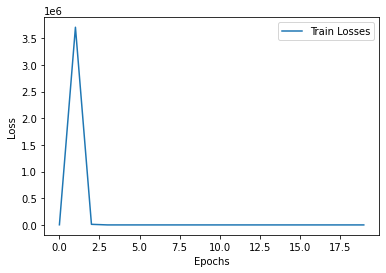

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2334.5625000
Epoch: 001, LR: 0.010000, Train Loss: 2177512.0000000
Epoch: 002, LR: 0.010000, Train Loss: 6139.4531250
Epoch: 003, LR: 0.010000, Train Loss: 8.1756296
Epoch: 004, LR: 0.010000, Train Loss: 0.9796089
Epoch: 005, LR: 0.010000, Train Loss: 0.9785030
Epoch: 006, LR: 0.010000, Train Loss: 0.9765866
Epoch: 007, LR: 0.010000, Train Loss: 0.9734507
Epoch: 008, LR: 0.010000, Train Loss: 0.9689436
Epoch: 009, LR: 0.010000, Train Loss: 0.9629301
Epoch: 010, LR: 0.010000, Train Loss: 0.9552681
Epoch: 011, LR: 0.010000, Train Loss: 0.9457618
Epoch: 012, LR: 0.010000, Train Loss: 0.9343007
Epoch: 013, LR: 0.010000, Train Loss: 0.9207496
Epoch: 014, LR: 0.010000, Train Loss: 0.9049488
Epoch: 015, LR: 0.010000, Train Loss: 0.8868327
Epoch: 016, LR: 0.010000, Train Loss: 0.8663599
Epoch: 017, LR: 0.010000, Train Loss: 0.8435672
Epoch: 018, LR: 0.010000, Train Loss: 0.8185651
Epoch: 019, LR:

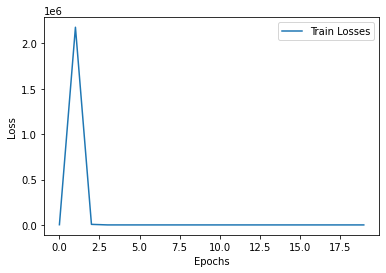

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2314.6823730
Epoch: 001, LR: 0.010000, Train Loss: 1937851.0000000
Epoch: 002, LR: 0.010000, Train Loss: 10410.1416016
Epoch: 003, LR: 0.010000, Train Loss: 108.6016006
Epoch: 004, LR: 0.010000, Train Loss: 178.1344757
Epoch: 005, LR: 0.010000, Train Loss: 1.2664295
Epoch: 006, LR: 0.010000, Train Loss: 1.0143121
Epoch: 007, LR: 0.010000, Train Loss: 1.0137964
Epoch: 008, LR: 0.010000, Train Loss: 1.0127982
Epoch: 009, LR: 0.010000, Train Loss: 1.0113100
Epoch: 010, LR: 0.010000, Train Loss: 1.0092634
Epoch: 011, LR: 0.010000, Train Loss: 1.0065705
Epoch: 012, LR: 0.010000, Train Loss: 1.0031725
Epoch: 013, LR: 0.010000, Train Loss: 0.9989820
Epoch: 014, LR: 0.010000, Train Loss: 0.9939411
Epoch: 015, LR: 0.010000, Train Loss: 0.9879863
Epoch: 016, LR: 0.010000, Train Loss: 0.9810388
Epoch: 017, LR: 0.010000, Train Loss: 0.9730506
Epoch: 018, LR: 0.010000, Train Loss: 0.9639934
Epoch: 019

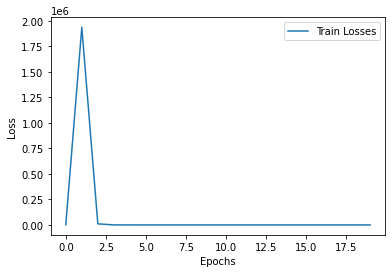

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1201.1778564
Epoch: 001, LR: 0.010000, Train Loss: 2005316.6250000
Epoch: 002, LR: 0.010000, Train Loss: 6042.3598633
Epoch: 003, LR: 0.010000, Train Loss: 1.1003667
Epoch: 004, LR: 0.010000, Train Loss: 1.0097274
Epoch: 005, LR: 0.010000, Train Loss: 1.0081257
Epoch: 006, LR: 0.010000, Train Loss: 1.0052673
Epoch: 007, LR: 0.010000, Train Loss: 1.0007838
Epoch: 008, LR: 0.010000, Train Loss: 0.9944104
Epoch: 009, LR: 0.010000, Train Loss: 0.9859272
Epoch: 010, LR: 0.010000, Train Loss: 0.9750918
Epoch: 011, LR: 0.010000, Train Loss: 0.9617084
Epoch: 012, LR: 0.010000, Train Loss: 0.9456966
Epoch: 013, LR: 0.010000, Train Loss: 0.9269572
Epoch: 014, LR: 0.010000, Train Loss: 0.9054116
Epoch: 015, LR: 0.010000, Train Loss: 0.8811132
Epoch: 016, LR: 0.010000, Train Loss: 0.8541919
Epoch: 017, LR: 0.010000, Train Loss: 0.8248807
Epoch: 018, LR: 0.010000, Train Loss: 0.7935237
Epoch: 019, LR:

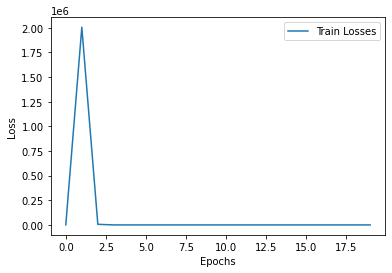

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1911.8532715
Epoch: 001, LR: 0.010000, Train Loss: 1708588.3750000
Epoch: 002, LR: 0.010000, Train Loss: 4470.8740234
Epoch: 003, LR: 0.010000, Train Loss: 1.4696423
Epoch: 004, LR: 0.010000, Train Loss: 0.9274314
Epoch: 005, LR: 0.010000, Train Loss: 0.9262872
Epoch: 006, LR: 0.010000, Train Loss: 0.9246497
Epoch: 007, LR: 0.010000, Train Loss: 0.9221829
Epoch: 008, LR: 0.010000, Train Loss: 0.9185584
Epoch: 009, LR: 0.010000, Train Loss: 0.9136473
Epoch: 010, LR: 0.010000, Train Loss: 0.9073241
Epoch: 011, LR: 0.010000, Train Loss: 0.8994610
Epoch: 012, LR: 0.010000, Train Loss: 0.8899237
Epoch: 013, LR: 0.010000, Train Loss: 0.8785713
Epoch: 014, LR: 0.010000, Train Loss: 0.8652279
Epoch: 015, LR: 0.010000, Train Loss: 0.8498923
Epoch: 016, LR: 0.010000, Train Loss: 0.8325553
Epoch: 017, LR: 0.010000, Train Loss: 0.8132381
Epoch: 018, LR: 0.010000, Train Loss: 0.7920073
Epoch: 019, LR:

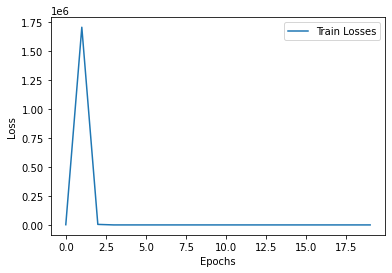

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 3265.6376953
Epoch: 001, LR: 0.010000, Train Loss: 3815693.7500000
Epoch: 002, LR: 0.010000, Train Loss: 13476.6171875
Epoch: 003, LR: 0.010000, Train Loss: 12.6315041
Epoch: 004, LR: 0.010000, Train Loss: 0.9632930
Epoch: 005, LR: 0.010000, Train Loss: 0.9628531
Epoch: 006, LR: 0.010000, Train Loss: 0.9616767
Epoch: 007, LR: 0.010000, Train Loss: 0.9595600
Epoch: 008, LR: 0.010000, Train Loss: 0.9562616
Epoch: 009, LR: 0.010000, Train Loss: 0.9516339
Epoch: 010, LR: 0.010000, Train Loss: 0.9455360
Epoch: 011, LR: 0.010000, Train Loss: 0.9378639
Epoch: 012, LR: 0.010000, Train Loss: 0.9284886
Epoch: 013, LR: 0.010000, Train Loss: 0.9172994
Epoch: 014, LR: 0.010000, Train Loss: 0.9042022
Epoch: 015, LR: 0.010000, Train Loss: 0.8891401
Epoch: 016, LR: 0.010000, Train Loss: 0.8720914
Epoch: 017, LR: 0.010000, Train Loss: 0.8530561
Epoch: 018, LR: 0.010000, Train Loss: 0.8321167
Epoch: 019, L

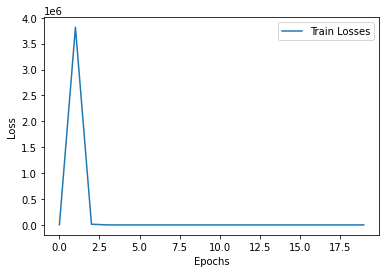

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2882.4182129
Epoch: 001, LR: 0.010000, Train Loss: 1423838.5000000
Epoch: 002, LR: 0.010000, Train Loss: 10642.1787109
Epoch: 003, LR: 0.010000, Train Loss: 9.8589697
Epoch: 004, LR: 0.010000, Train Loss: 0.8812575
Epoch: 005, LR: 0.010000, Train Loss: 0.8660840
Epoch: 006, LR: 0.010000, Train Loss: 0.8646305
Epoch: 007, LR: 0.010000, Train Loss: 0.8626211
Epoch: 008, LR: 0.010000, Train Loss: 0.8596530
Epoch: 009, LR: 0.010000, Train Loss: 0.8554987
Epoch: 010, LR: 0.010000, Train Loss: 0.8500465
Epoch: 011, LR: 0.010000, Train Loss: 0.8431537
Epoch: 012, LR: 0.010000, Train Loss: 0.8347350
Epoch: 013, LR: 0.010000, Train Loss: 0.8247043
Epoch: 014, LR: 0.010000, Train Loss: 0.8129887
Epoch: 015, LR: 0.010000, Train Loss: 0.7996074
Epoch: 016, LR: 0.010000, Train Loss: 0.7845769
Epoch: 017, LR: 0.010000, Train Loss: 0.7679474
Epoch: 018, LR: 0.010000, Train Loss: 0.7497945
Epoch: 019, LR

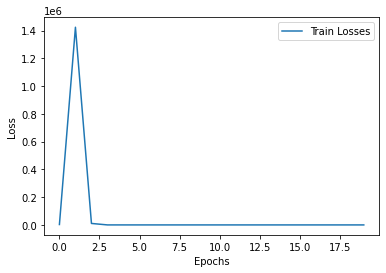

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1256.3686523
Epoch: 001, LR: 0.010000, Train Loss: 1992975.7500000
Epoch: 002, LR: 0.010000, Train Loss: 3429.9956055
Epoch: 003, LR: 0.010000, Train Loss: 1.0408782
Epoch: 004, LR: 0.010000, Train Loss: 0.8839523
Epoch: 005, LR: 0.010000, Train Loss: 0.8822572
Epoch: 006, LR: 0.010000, Train Loss: 0.8799257
Epoch: 007, LR: 0.010000, Train Loss: 0.8765838
Epoch: 008, LR: 0.010000, Train Loss: 0.8720800
Epoch: 009, LR: 0.010000, Train Loss: 0.8662299
Epoch: 010, LR: 0.010000, Train Loss: 0.8588946
Epoch: 011, LR: 0.010000, Train Loss: 0.8499707
Epoch: 012, LR: 0.010000, Train Loss: 0.8393625
Epoch: 013, LR: 0.010000, Train Loss: 0.8270124
Epoch: 014, LR: 0.010000, Train Loss: 0.8128764
Epoch: 015, LR: 0.010000, Train Loss: 0.7969443
Epoch: 016, LR: 0.010000, Train Loss: 0.7792459
Epoch: 017, LR: 0.010000, Train Loss: 0.7598590
Epoch: 018, LR: 0.010000, Train Loss: 0.7389045
Epoch: 019, LR:

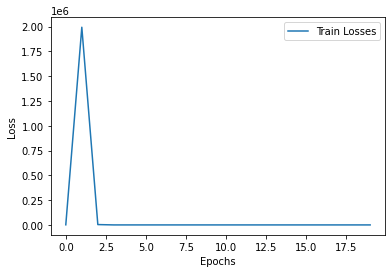

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2495.2204590
Epoch: 001, LR: 0.010000, Train Loss: 2200754.0000000
Epoch: 002, LR: 0.010000, Train Loss: 9211.5244141
Epoch: 003, LR: 0.010000, Train Loss: 1.1933738
Epoch: 004, LR: 0.010000, Train Loss: 1.1588136
Epoch: 005, LR: 0.010000, Train Loss: 1.1548886
Epoch: 006, LR: 0.010000, Train Loss: 1.1493815
Epoch: 007, LR: 0.010000, Train Loss: 1.1416566
Epoch: 008, LR: 0.010000, Train Loss: 1.1312839
Epoch: 009, LR: 0.010000, Train Loss: 1.1179744
Epoch: 010, LR: 0.010000, Train Loss: 1.1015663
Epoch: 011, LR: 0.010000, Train Loss: 1.0819483
Epoch: 012, LR: 0.010000, Train Loss: 1.0590808
Epoch: 013, LR: 0.010000, Train Loss: 1.0330276
Epoch: 014, LR: 0.010000, Train Loss: 1.0039417
Epoch: 015, LR: 0.010000, Train Loss: 0.9720654
Epoch: 016, LR: 0.010000, Train Loss: 0.9377428
Epoch: 017, LR: 0.010000, Train Loss: 0.9014302
Epoch: 018, LR: 0.010000, Train Loss: 0.8637025
Epoch: 019, LR:

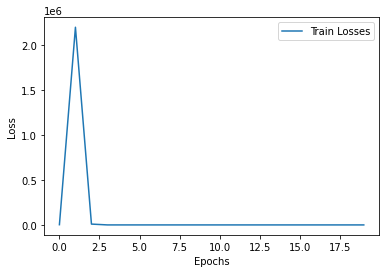

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1753.3222656
Epoch: 001, LR: 0.010000, Train Loss: 1924844.1250000
Epoch: 002, LR: 0.010000, Train Loss: 4790.8300781
Epoch: 003, LR: 0.010000, Train Loss: 25.9897499
Epoch: 004, LR: 0.010000, Train Loss: 1.0320281
Epoch: 005, LR: 0.010000, Train Loss: 1.0309342
Epoch: 006, LR: 0.010000, Train Loss: 1.0289278
Epoch: 007, LR: 0.010000, Train Loss: 1.0257494
Epoch: 008, LR: 0.010000, Train Loss: 1.0211383
Epoch: 009, LR: 0.010000, Train Loss: 1.0149035
Epoch: 010, LR: 0.010000, Train Loss: 1.0068977
Epoch: 011, LR: 0.010000, Train Loss: 0.9970035
Epoch: 012, LR: 0.010000, Train Loss: 0.9850222
Epoch: 013, LR: 0.010000, Train Loss: 0.9709134
Epoch: 014, LR: 0.010000, Train Loss: 0.9546620
Epoch: 015, LR: 0.010000, Train Loss: 0.9362687
Epoch: 016, LR: 0.010000, Train Loss: 0.9157834
Epoch: 017, LR: 0.010000, Train Loss: 0.8933184
Epoch: 018, LR: 0.010000, Train Loss: 0.8690255
Epoch: 019, LR

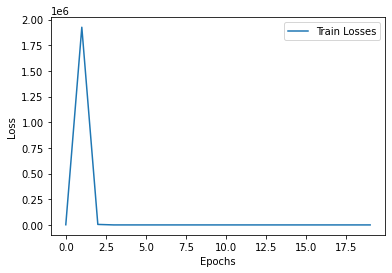

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2061.3703613
Epoch: 001, LR: 0.010000, Train Loss: 2080242.5000000
Epoch: 002, LR: 0.010000, Train Loss: 9893.7587891
Epoch: 003, LR: 0.010000, Train Loss: 1.1059896
Epoch: 004, LR: 0.010000, Train Loss: 1.0752430
Epoch: 005, LR: 0.010000, Train Loss: 1.0732652
Epoch: 006, LR: 0.010000, Train Loss: 1.0697309
Epoch: 007, LR: 0.010000, Train Loss: 1.0643631
Epoch: 008, LR: 0.010000, Train Loss: 1.0569985
Epoch: 009, LR: 0.010000, Train Loss: 1.0474283
Epoch: 010, LR: 0.010000, Train Loss: 1.0355490
Epoch: 011, LR: 0.010000, Train Loss: 1.0212713
Epoch: 012, LR: 0.010000, Train Loss: 1.0045466
Epoch: 013, LR: 0.010000, Train Loss: 0.9853770
Epoch: 014, LR: 0.010000, Train Loss: 0.9638193
Epoch: 015, LR: 0.010000, Train Loss: 0.9399923
Epoch: 016, LR: 0.010000, Train Loss: 0.9140917
Epoch: 017, LR: 0.010000, Train Loss: 0.8863710
Epoch: 018, LR: 0.010000, Train Loss: 0.8571645
Epoch: 019, LR:

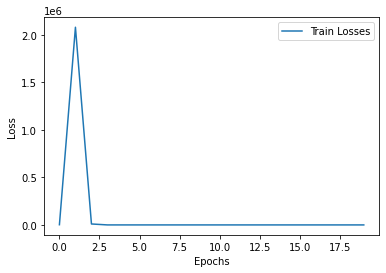

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1683.1311035
Epoch: 001, LR: 0.010000, Train Loss: 2035574.7500000
Epoch: 002, LR: 0.010000, Train Loss: 6354.3208008
Epoch: 003, LR: 0.010000, Train Loss: 1.0006517
Epoch: 004, LR: 0.010000, Train Loss: 0.9451855
Epoch: 005, LR: 0.010000, Train Loss: 0.9437145
Epoch: 006, LR: 0.010000, Train Loss: 0.9410898
Epoch: 007, LR: 0.010000, Train Loss: 0.9368289
Epoch: 008, LR: 0.010000, Train Loss: 0.9306532
Epoch: 009, LR: 0.010000, Train Loss: 0.9223666
Epoch: 010, LR: 0.010000, Train Loss: 0.9117754
Epoch: 011, LR: 0.010000, Train Loss: 0.8987156
Epoch: 012, LR: 0.010000, Train Loss: 0.8830987
Epoch: 013, LR: 0.010000, Train Loss: 0.8649291
Epoch: 014, LR: 0.010000, Train Loss: 0.8442791
Epoch: 015, LR: 0.010000, Train Loss: 0.8213178
Epoch: 016, LR: 0.010000, Train Loss: 0.7963106
Epoch: 017, LR: 0.010000, Train Loss: 0.7696056
Epoch: 018, LR: 0.010000, Train Loss: 0.7416571
Epoch: 019, LR:

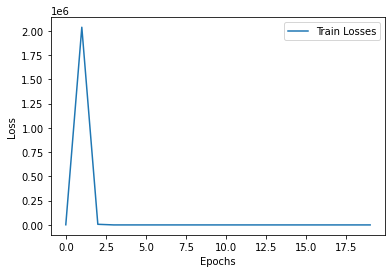

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2662.5195312
Epoch: 001, LR: 0.010000, Train Loss: 2229698.2500000
Epoch: 002, LR: 0.010000, Train Loss: 6878.6220703
Epoch: 003, LR: 0.010000, Train Loss: 1.6360686
Epoch: 004, LR: 0.010000, Train Loss: 0.9172373
Epoch: 005, LR: 0.010000, Train Loss: 0.9159120
Epoch: 006, LR: 0.010000, Train Loss: 0.9139369
Epoch: 007, LR: 0.010000, Train Loss: 0.9109719
Epoch: 008, LR: 0.010000, Train Loss: 0.9067851
Epoch: 009, LR: 0.010000, Train Loss: 0.9012231
Epoch: 010, LR: 0.010000, Train Loss: 0.8940219
Epoch: 011, LR: 0.010000, Train Loss: 0.8850755
Epoch: 012, LR: 0.010000, Train Loss: 0.8742194
Epoch: 013, LR: 0.010000, Train Loss: 0.8613339
Epoch: 014, LR: 0.010000, Train Loss: 0.8463098
Epoch: 015, LR: 0.010000, Train Loss: 0.8290968
Epoch: 016, LR: 0.010000, Train Loss: 0.8096792
Epoch: 017, LR: 0.010000, Train Loss: 0.7880928
Epoch: 018, LR: 0.010000, Train Loss: 0.7644343
Epoch: 019, LR:

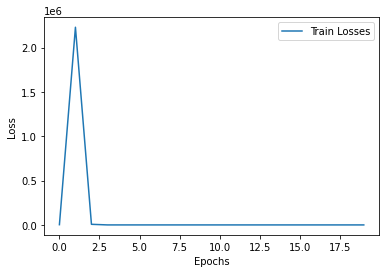

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2020.6352539
Epoch: 001, LR: 0.010000, Train Loss: 1560613.2500000
Epoch: 002, LR: 0.010000, Train Loss: 5263.9648438
Epoch: 003, LR: 0.010000, Train Loss: 9.2775421
Epoch: 004, LR: 0.010000, Train Loss: 0.8400491
Epoch: 005, LR: 0.010000, Train Loss: 0.8393103
Epoch: 006, LR: 0.010000, Train Loss: 0.8378814
Epoch: 007, LR: 0.010000, Train Loss: 0.8355339
Epoch: 008, LR: 0.010000, Train Loss: 0.8321545
Epoch: 009, LR: 0.010000, Train Loss: 0.8276321
Epoch: 010, LR: 0.010000, Train Loss: 0.8218721
Epoch: 011, LR: 0.010000, Train Loss: 0.8148229
Epoch: 012, LR: 0.010000, Train Loss: 0.8064106
Epoch: 013, LR: 0.010000, Train Loss: 0.7966098
Epoch: 014, LR: 0.010000, Train Loss: 0.7854075
Epoch: 015, LR: 0.010000, Train Loss: 0.7728270
Epoch: 016, LR: 0.010000, Train Loss: 0.7588991
Epoch: 017, LR: 0.010000, Train Loss: 0.7436925
Epoch: 018, LR: 0.010000, Train Loss: 0.7273071
Epoch: 019, LR:

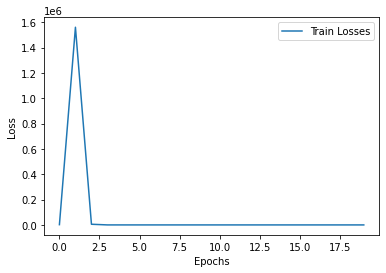

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2005.0939941
Epoch: 001, LR: 0.010000, Train Loss: 2608217.2500000
Epoch: 002, LR: 0.010000, Train Loss: 5946.2456055
Epoch: 003, LR: 0.010000, Train Loss: 4.5796452
Epoch: 004, LR: 0.010000, Train Loss: 0.8396085
Epoch: 005, LR: 0.010000, Train Loss: 0.8386129
Epoch: 006, LR: 0.010000, Train Loss: 0.8367333
Epoch: 007, LR: 0.010000, Train Loss: 0.8337984
Epoch: 008, LR: 0.010000, Train Loss: 0.8295677
Epoch: 009, LR: 0.010000, Train Loss: 0.8238428
Epoch: 010, LR: 0.010000, Train Loss: 0.8164886
Epoch: 011, LR: 0.010000, Train Loss: 0.8073722
Epoch: 012, LR: 0.010000, Train Loss: 0.7963939
Epoch: 013, LR: 0.010000, Train Loss: 0.7834927
Epoch: 014, LR: 0.010000, Train Loss: 0.7686468
Epoch: 015, LR: 0.010000, Train Loss: 0.7518890
Epoch: 016, LR: 0.010000, Train Loss: 0.7332795
Epoch: 017, LR: 0.010000, Train Loss: 0.7129390
Epoch: 018, LR: 0.010000, Train Loss: 0.6910471
Epoch: 019, LR:

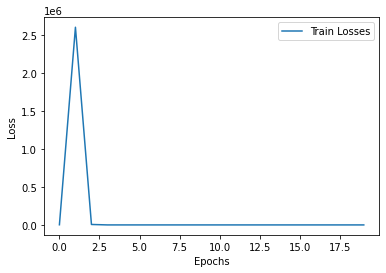

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1466.2546387
Epoch: 001, LR: 0.010000, Train Loss: 1577378.0000000
Epoch: 002, LR: 0.010000, Train Loss: 2145.6552734
Epoch: 003, LR: 0.010000, Train Loss: 0.9856756
Epoch: 004, LR: 0.010000, Train Loss: 0.9362355
Epoch: 005, LR: 0.010000, Train Loss: 0.9331903
Epoch: 006, LR: 0.010000, Train Loss: 0.9288914
Epoch: 007, LR: 0.010000, Train Loss: 0.9227731
Epoch: 008, LR: 0.010000, Train Loss: 0.9145072
Epoch: 009, LR: 0.010000, Train Loss: 0.9038649
Epoch: 010, LR: 0.010000, Train Loss: 0.8906527
Epoch: 011, LR: 0.010000, Train Loss: 0.8747947
Epoch: 012, LR: 0.010000, Train Loss: 0.8561941
Epoch: 013, LR: 0.010000, Train Loss: 0.8349757
Epoch: 014, LR: 0.010000, Train Loss: 0.8112772
Epoch: 015, LR: 0.010000, Train Loss: 0.7853415
Epoch: 016, LR: 0.010000, Train Loss: 0.7575004
Epoch: 017, LR: 0.010000, Train Loss: 0.7281873
Epoch: 018, LR: 0.010000, Train Loss: 0.6979366
Epoch: 019, LR:

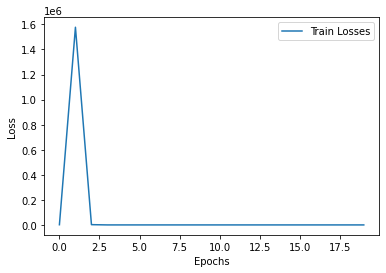

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1639.5642090
Epoch: 001, LR: 0.010000, Train Loss: 3696616.2500000
Epoch: 002, LR: 0.010000, Train Loss: 7737.3769531
Epoch: 003, LR: 0.010000, Train Loss: 0.7304718
Epoch: 004, LR: 0.010000, Train Loss: 0.6666343
Epoch: 005, LR: 0.010000, Train Loss: 0.6659927
Epoch: 006, LR: 0.010000, Train Loss: 0.6639687
Epoch: 007, LR: 0.010000, Train Loss: 0.6603320
Epoch: 008, LR: 0.010000, Train Loss: 0.6550259
Epoch: 009, LR: 0.010000, Train Loss: 0.6479260
Epoch: 010, LR: 0.010000, Train Loss: 0.6389182
Epoch: 011, LR: 0.010000, Train Loss: 0.6278616
Epoch: 012, LR: 0.010000, Train Loss: 0.6146371
Epoch: 013, LR: 0.010000, Train Loss: 0.5992994
Epoch: 014, LR: 0.010000, Train Loss: 0.5819587
Epoch: 015, LR: 0.010000, Train Loss: 0.5627514
Epoch: 016, LR: 0.010000, Train Loss: 0.5419123
Epoch: 017, LR: 0.010000, Train Loss: 0.5197990
Epoch: 018, LR: 0.010000, Train Loss: 0.4968825
Epoch: 019, LR:

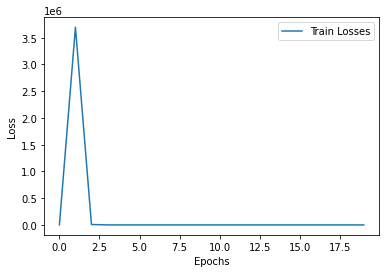

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2249.2817383
Epoch: 001, LR: 0.010000, Train Loss: 5383104.5000000
Epoch: 002, LR: 0.010000, Train Loss: 7615.1713867
Epoch: 003, LR: 0.010000, Train Loss: 11.3668098
Epoch: 004, LR: 0.010000, Train Loss: 1.0141309
Epoch: 005, LR: 0.010000, Train Loss: 1.0139266
Epoch: 006, LR: 0.010000, Train Loss: 1.0125744
Epoch: 007, LR: 0.010000, Train Loss: 1.0099512
Epoch: 008, LR: 0.010000, Train Loss: 1.0060689
Epoch: 009, LR: 0.010000, Train Loss: 1.0008653
Epoch: 010, LR: 0.010000, Train Loss: 0.9942158
Epoch: 011, LR: 0.010000, Train Loss: 0.9859745
Epoch: 012, LR: 0.010000, Train Loss: 0.9760904
Epoch: 013, LR: 0.010000, Train Loss: 0.9645410
Epoch: 014, LR: 0.010000, Train Loss: 0.9513066
Epoch: 015, LR: 0.010000, Train Loss: 0.9363970
Epoch: 016, LR: 0.010000, Train Loss: 0.9198339
Epoch: 017, LR: 0.010000, Train Loss: 0.9016687
Epoch: 018, LR: 0.010000, Train Loss: 0.8819845
Epoch: 019, LR

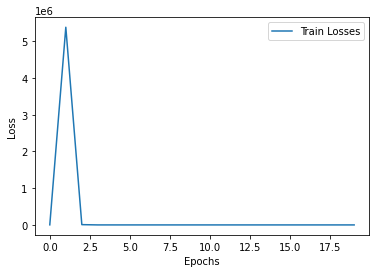

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1542.9204102
Epoch: 001, LR: 0.010000, Train Loss: 1996497.3750000
Epoch: 002, LR: 0.010000, Train Loss: 6500.2153320
Epoch: 003, LR: 0.010000, Train Loss: 851.8952637
Epoch: 004, LR: 0.010000, Train Loss: 55.2246246
Epoch: 005, LR: 0.010000, Train Loss: 70.1326065
Epoch: 006, LR: 0.010000, Train Loss: 10.4232264
Epoch: 007, LR: 0.010000, Train Loss: 0.8282171
Epoch: 008, LR: 0.010000, Train Loss: 0.7797247
Epoch: 009, LR: 0.010000, Train Loss: 0.7696404
Epoch: 010, LR: 0.010000, Train Loss: 0.7685949
Epoch: 011, LR: 0.010000, Train Loss: 0.7669167
Epoch: 012, LR: 0.010000, Train Loss: 0.7646756
Epoch: 013, LR: 0.010000, Train Loss: 0.7617803
Epoch: 014, LR: 0.010000, Train Loss: 0.7581410
Epoch: 015, LR: 0.010000, Train Loss: 0.7536981
Epoch: 016, LR: 0.010000, Train Loss: 0.7483963
Epoch: 017, LR: 0.010000, Train Loss: 0.7421947
Epoch: 018, LR: 0.010000, Train Loss: 0.7350593
Epoch: 019

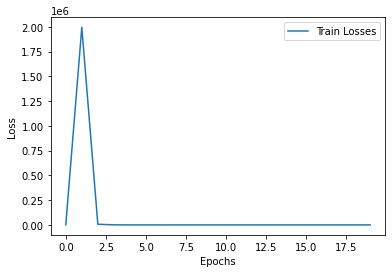

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2019.2812500
Epoch: 001, LR: 0.010000, Train Loss: 2943903.0000000
Epoch: 002, LR: 0.010000, Train Loss: 9369.1992188
Epoch: 003, LR: 0.010000, Train Loss: 2.6252060
Epoch: 004, LR: 0.010000, Train Loss: 0.9220216
Epoch: 005, LR: 0.010000, Train Loss: 0.9215030
Epoch: 006, LR: 0.010000, Train Loss: 0.9201176
Epoch: 007, LR: 0.010000, Train Loss: 0.9176400
Epoch: 008, LR: 0.010000, Train Loss: 0.9139079
Epoch: 009, LR: 0.010000, Train Loss: 0.9087535
Epoch: 010, LR: 0.010000, Train Loss: 0.9020399
Epoch: 011, LR: 0.010000, Train Loss: 0.8936413
Epoch: 012, LR: 0.010000, Train Loss: 0.8834498
Epoch: 013, LR: 0.010000, Train Loss: 0.8713759
Epoch: 014, LR: 0.010000, Train Loss: 0.8573620
Epoch: 015, LR: 0.010000, Train Loss: 0.8413815
Epoch: 016, LR: 0.010000, Train Loss: 0.8234529
Epoch: 017, LR: 0.010000, Train Loss: 0.8036404
Epoch: 018, LR: 0.010000, Train Loss: 0.7820597
Epoch: 019, LR:

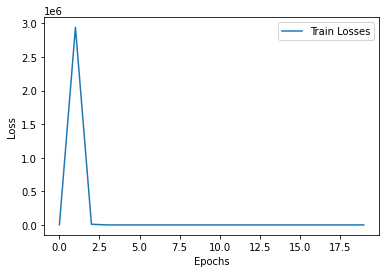

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2159.8845215
Epoch: 001, LR: 0.010000, Train Loss: 3633919.5000000
Epoch: 002, LR: 0.010000, Train Loss: 11870.1484375
Epoch: 003, LR: 0.010000, Train Loss: 114.8544083
Epoch: 004, LR: 0.010000, Train Loss: 8.4508839
Epoch: 005, LR: 0.010000, Train Loss: 1.1795633
Epoch: 006, LR: 0.010000, Train Loss: 1.0806855
Epoch: 007, LR: 0.010000, Train Loss: 1.0806311
Epoch: 008, LR: 0.010000, Train Loss: 1.0790484
Epoch: 009, LR: 0.010000, Train Loss: 1.0764712
Epoch: 010, LR: 0.010000, Train Loss: 1.0727326
Epoch: 011, LR: 0.010000, Train Loss: 1.0677083
Epoch: 012, LR: 0.010000, Train Loss: 1.0612683
Epoch: 013, LR: 0.010000, Train Loss: 1.0532752
Epoch: 014, LR: 0.010000, Train Loss: 1.0436218
Epoch: 015, LR: 0.010000, Train Loss: 1.0322013
Epoch: 016, LR: 0.010000, Train Loss: 1.0189180
Epoch: 017, LR: 0.010000, Train Loss: 1.0036799
Epoch: 018, LR: 0.010000, Train Loss: 0.9864402
Epoch: 019, 

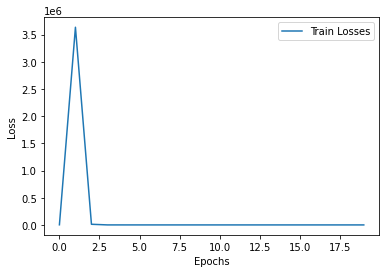

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2681.7380371
Epoch: 001, LR: 0.010000, Train Loss: 1749680.1250000
Epoch: 002, LR: 0.010000, Train Loss: 5425.8320312
Epoch: 003, LR: 0.010000, Train Loss: 1.4000564
Epoch: 004, LR: 0.010000, Train Loss: 0.8185436
Epoch: 005, LR: 0.010000, Train Loss: 0.8172532
Epoch: 006, LR: 0.010000, Train Loss: 0.8157478
Epoch: 007, LR: 0.010000, Train Loss: 0.8135384
Epoch: 008, LR: 0.010000, Train Loss: 0.8103810
Epoch: 009, LR: 0.010000, Train Loss: 0.8060669
Epoch: 010, LR: 0.010000, Train Loss: 0.8004344
Epoch: 011, LR: 0.010000, Train Loss: 0.7933327
Epoch: 012, LR: 0.010000, Train Loss: 0.7846497
Epoch: 013, LR: 0.010000, Train Loss: 0.7742620
Epoch: 014, LR: 0.010000, Train Loss: 0.7620929
Epoch: 015, LR: 0.010000, Train Loss: 0.7480968
Epoch: 016, LR: 0.010000, Train Loss: 0.7322964
Epoch: 017, LR: 0.010000, Train Loss: 0.7147697
Epoch: 018, LR: 0.010000, Train Loss: 0.6956496
Epoch: 019, LR:

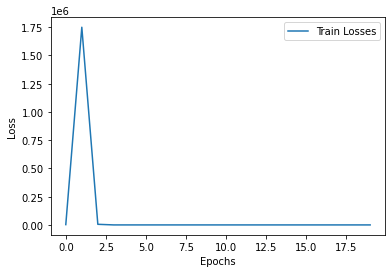

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1662.7087402
Epoch: 001, LR: 0.010000, Train Loss: 3441765.2500000
Epoch: 002, LR: 0.010000, Train Loss: 11060.7597656
Epoch: 003, LR: 0.010000, Train Loss: 1.6647282
Epoch: 004, LR: 0.010000, Train Loss: 0.9373765
Epoch: 005, LR: 0.010000, Train Loss: 0.7520475
Epoch: 006, LR: 0.010000, Train Loss: 0.7511232
Epoch: 007, LR: 0.010000, Train Loss: 0.7495409
Epoch: 008, LR: 0.010000, Train Loss: 0.7472091
Epoch: 009, LR: 0.010000, Train Loss: 0.7440675
Epoch: 010, LR: 0.010000, Train Loss: 0.7400520
Epoch: 011, LR: 0.010000, Train Loss: 0.7350510
Epoch: 012, LR: 0.010000, Train Loss: 0.7289285
Epoch: 013, LR: 0.010000, Train Loss: 0.7214350
Epoch: 014, LR: 0.010000, Train Loss: 0.7125422
Epoch: 015, LR: 0.010000, Train Loss: 0.7021805
Epoch: 016, LR: 0.010000, Train Loss: 0.6902816
Epoch: 017, LR: 0.010000, Train Loss: 0.6767920
Epoch: 018, LR: 0.010000, Train Loss: 0.6616904
Epoch: 019, LR

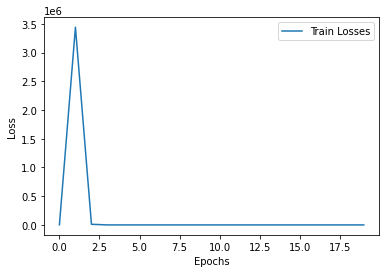

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2246.6687012
Epoch: 001, LR: 0.010000, Train Loss: 2788562.2500000
Epoch: 002, LR: 0.010000, Train Loss: 8938.4609375
Epoch: 003, LR: 0.010000, Train Loss: 6.8009777
Epoch: 004, LR: 0.010000, Train Loss: 0.8438728
Epoch: 005, LR: 0.010000, Train Loss: 0.8426845
Epoch: 006, LR: 0.010000, Train Loss: 0.8408738
Epoch: 007, LR: 0.010000, Train Loss: 0.8382793
Epoch: 008, LR: 0.010000, Train Loss: 0.8347574
Epoch: 009, LR: 0.010000, Train Loss: 0.8301289
Epoch: 010, LR: 0.010000, Train Loss: 0.8242593
Epoch: 011, LR: 0.010000, Train Loss: 0.8170039
Epoch: 012, LR: 0.010000, Train Loss: 0.8082651
Epoch: 013, LR: 0.010000, Train Loss: 0.7979048
Epoch: 014, LR: 0.010000, Train Loss: 0.7858632
Epoch: 015, LR: 0.010000, Train Loss: 0.7720882
Epoch: 016, LR: 0.010000, Train Loss: 0.7565283
Epoch: 017, LR: 0.010000, Train Loss: 0.7391813
Epoch: 018, LR: 0.010000, Train Loss: 0.7200958
Epoch: 019, LR:

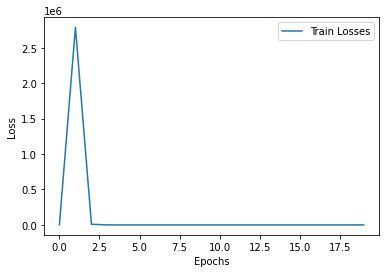

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2442.6921387
Epoch: 001, LR: 0.010000, Train Loss: 1555402.0000000
Epoch: 002, LR: 0.010000, Train Loss: 10817.3847656
Epoch: 003, LR: 0.010000, Train Loss: 1.4095186
Epoch: 004, LR: 0.010000, Train Loss: 0.8509008
Epoch: 005, LR: 0.010000, Train Loss: 0.8501299
Epoch: 006, LR: 0.010000, Train Loss: 0.8485828
Epoch: 007, LR: 0.010000, Train Loss: 0.8460312
Epoch: 008, LR: 0.010000, Train Loss: 0.8423290
Epoch: 009, LR: 0.010000, Train Loss: 0.8372387
Epoch: 010, LR: 0.010000, Train Loss: 0.8306676
Epoch: 011, LR: 0.010000, Train Loss: 0.8225045
Epoch: 012, LR: 0.010000, Train Loss: 0.8125222
Epoch: 013, LR: 0.010000, Train Loss: 0.8006280
Epoch: 014, LR: 0.010000, Train Loss: 0.7867066
Epoch: 015, LR: 0.010000, Train Loss: 0.7706714
Epoch: 016, LR: 0.010000, Train Loss: 0.7525077
Epoch: 017, LR: 0.010000, Train Loss: 0.7322560
Epoch: 018, LR: 0.010000, Train Loss: 0.7100301
Epoch: 019, LR

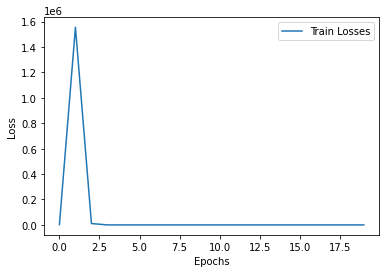

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1936.5825195
Epoch: 001, LR: 0.010000, Train Loss: 2286776.0000000
Epoch: 002, LR: 0.010000, Train Loss: 25383.6464844
Epoch: 003, LR: 0.010000, Train Loss: 145.8528290
Epoch: 004, LR: 0.010000, Train Loss: 87.7865677
Epoch: 005, LR: 0.010000, Train Loss: 5.1806412
Epoch: 006, LR: 0.010000, Train Loss: 1.0875654
Epoch: 007, LR: 0.010000, Train Loss: 0.9611397
Epoch: 008, LR: 0.010000, Train Loss: 0.9355468
Epoch: 009, LR: 0.010000, Train Loss: 0.9341968
Epoch: 010, LR: 0.010000, Train Loss: 0.9323573
Epoch: 011, LR: 0.010000, Train Loss: 0.9297953
Epoch: 012, LR: 0.010000, Train Loss: 0.9264088
Epoch: 013, LR: 0.010000, Train Loss: 0.9220936
Epoch: 014, LR: 0.010000, Train Loss: 0.9167616
Epoch: 015, LR: 0.010000, Train Loss: 0.9103332
Epoch: 016, LR: 0.010000, Train Loss: 0.9027474
Epoch: 017, LR: 0.010000, Train Loss: 0.8939365
Epoch: 018, LR: 0.010000, Train Loss: 0.8837653
Epoch: 019,

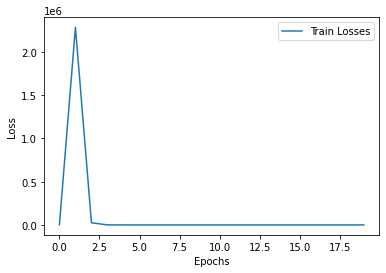

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1776.3601074
Epoch: 001, LR: 0.010000, Train Loss: 1546203.6250000
Epoch: 002, LR: 0.010000, Train Loss: 8357.8837891
Epoch: 003, LR: 0.010000, Train Loss: 823.2622681
Epoch: 004, LR: 0.010000, Train Loss: 96.0764160
Epoch: 005, LR: 0.010000, Train Loss: 146.5675049
Epoch: 006, LR: 0.010000, Train Loss: 95.4850845
Epoch: 007, LR: 0.010000, Train Loss: 37.3442192
Epoch: 008, LR: 0.010000, Train Loss: 22.8100681
Epoch: 009, LR: 0.010000, Train Loss: 24.1624508
Epoch: 010, LR: 0.010000, Train Loss: 18.6572552
Epoch: 011, LR: 0.010000, Train Loss: 10.2444668
Epoch: 012, LR: 0.010000, Train Loss: 4.5820198
Epoch: 013, LR: 0.010000, Train Loss: 1.9279900
Epoch: 014, LR: 0.010000, Train Loss: 1.1223087
Epoch: 015, LR: 0.010000, Train Loss: 1.1194224
Epoch: 016, LR: 0.010000, Train Loss: 1.0983255
Epoch: 017, LR: 0.010000, Train Loss: 1.0905746
Epoch: 018, LR: 0.010000, Train Loss: 1.0876191
Epoc

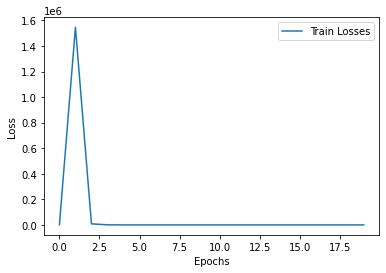

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1804.2335205
Epoch: 001, LR: 0.010000, Train Loss: 2575248.0000000
Epoch: 002, LR: 0.010000, Train Loss: 5790.7666016
Epoch: 003, LR: 0.010000, Train Loss: 1.1488296
Epoch: 004, LR: 0.010000, Train Loss: 0.9639599
Epoch: 005, LR: 0.010000, Train Loss: 0.9629754
Epoch: 006, LR: 0.010000, Train Loss: 0.9609327
Epoch: 007, LR: 0.010000, Train Loss: 0.9577034
Epoch: 008, LR: 0.010000, Train Loss: 0.9530414
Epoch: 009, LR: 0.010000, Train Loss: 0.9467256
Epoch: 010, LR: 0.010000, Train Loss: 0.9385793
Epoch: 011, LR: 0.010000, Train Loss: 0.9284528
Epoch: 012, LR: 0.010000, Train Loss: 0.9162248
Epoch: 013, LR: 0.010000, Train Loss: 0.9018094
Epoch: 014, LR: 0.010000, Train Loss: 0.8851681
Epoch: 015, LR: 0.010000, Train Loss: 0.8662974
Epoch: 016, LR: 0.010000, Train Loss: 0.8452496
Epoch: 017, LR: 0.010000, Train Loss: 0.8221484
Epoch: 018, LR: 0.010000, Train Loss: 0.7971843
Epoch: 019, LR:

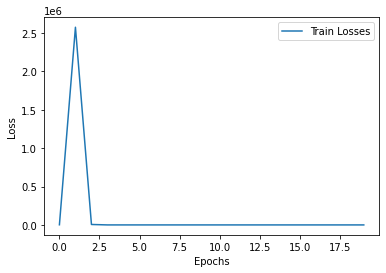

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1743.4055176
Epoch: 001, LR: 0.010000, Train Loss: 1958235.7500000
Epoch: 002, LR: 0.010000, Train Loss: 9969.8476562
Epoch: 003, LR: 0.010000, Train Loss: 1.0433308
Epoch: 004, LR: 0.010000, Train Loss: 0.8420007
Epoch: 005, LR: 0.010000, Train Loss: 0.8412542
Epoch: 006, LR: 0.010000, Train Loss: 0.8393775
Epoch: 007, LR: 0.010000, Train Loss: 0.8362108
Epoch: 008, LR: 0.010000, Train Loss: 0.8316604
Epoch: 009, LR: 0.010000, Train Loss: 0.8255977
Epoch: 010, LR: 0.010000, Train Loss: 0.8178902
Epoch: 011, LR: 0.010000, Train Loss: 0.8084239
Epoch: 012, LR: 0.010000, Train Loss: 0.7970920
Epoch: 013, LR: 0.010000, Train Loss: 0.7838081
Epoch: 014, LR: 0.010000, Train Loss: 0.7684958
Epoch: 015, LR: 0.010000, Train Loss: 0.7511773
Epoch: 016, LR: 0.010000, Train Loss: 0.7318876
Epoch: 017, LR: 0.010000, Train Loss: 0.7107125
Epoch: 018, LR: 0.010000, Train Loss: 0.6878054
Epoch: 019, LR:

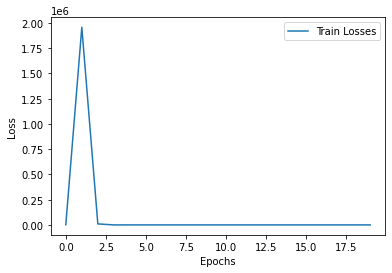

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1998.6783447
Epoch: 001, LR: 0.010000, Train Loss: 3447564.0000000
Epoch: 002, LR: 0.010000, Train Loss: 17918.9062500
Epoch: 003, LR: 0.010000, Train Loss: 6.6016769
Epoch: 004, LR: 0.010000, Train Loss: 0.8778927
Epoch: 005, LR: 0.010000, Train Loss: 0.8762690
Epoch: 006, LR: 0.010000, Train Loss: 0.8744969
Epoch: 007, LR: 0.010000, Train Loss: 0.8720293
Epoch: 008, LR: 0.010000, Train Loss: 0.8685507
Epoch: 009, LR: 0.010000, Train Loss: 0.8638420
Epoch: 010, LR: 0.010000, Train Loss: 0.8577743
Epoch: 011, LR: 0.010000, Train Loss: 0.8502173
Epoch: 012, LR: 0.010000, Train Loss: 0.8410650
Epoch: 013, LR: 0.010000, Train Loss: 0.8302234
Epoch: 014, LR: 0.010000, Train Loss: 0.8176321
Epoch: 015, LR: 0.010000, Train Loss: 0.8032759
Epoch: 016, LR: 0.010000, Train Loss: 0.7871643
Epoch: 017, LR: 0.010000, Train Loss: 0.7693425
Epoch: 018, LR: 0.010000, Train Loss: 0.7498970
Epoch: 019, LR

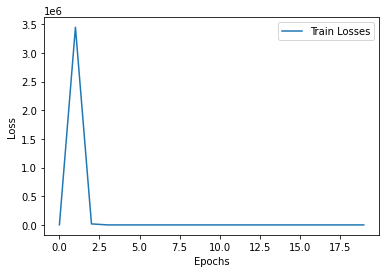

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1729.6303711
Epoch: 001, LR: 0.010000, Train Loss: 2291324.5000000
Epoch: 002, LR: 0.010000, Train Loss: 6421.6655273
Epoch: 003, LR: 0.010000, Train Loss: 1.3758310
Epoch: 004, LR: 0.010000, Train Loss: 0.8727517
Epoch: 005, LR: 0.010000, Train Loss: 0.8709439
Epoch: 006, LR: 0.010000, Train Loss: 0.8689203
Epoch: 007, LR: 0.010000, Train Loss: 0.8663971
Epoch: 008, LR: 0.010000, Train Loss: 0.8629486
Epoch: 009, LR: 0.010000, Train Loss: 0.8583962
Epoch: 010, LR: 0.010000, Train Loss: 0.8525216
Epoch: 011, LR: 0.010000, Train Loss: 0.8451830
Epoch: 012, LR: 0.010000, Train Loss: 0.8362237
Epoch: 013, LR: 0.010000, Train Loss: 0.8255147
Epoch: 014, LR: 0.010000, Train Loss: 0.8129130
Epoch: 015, LR: 0.010000, Train Loss: 0.7983539
Epoch: 016, LR: 0.010000, Train Loss: 0.7818022
Epoch: 017, LR: 0.010000, Train Loss: 0.7632665
Epoch: 018, LR: 0.010000, Train Loss: 0.7428242
Epoch: 019, LR:

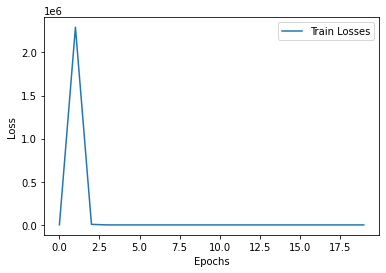

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2495.3125000
Epoch: 001, LR: 0.010000, Train Loss: 1339589.6250000
Epoch: 002, LR: 0.010000, Train Loss: 3026.7890625
Epoch: 003, LR: 0.010000, Train Loss: 1.2756135
Epoch: 004, LR: 0.010000, Train Loss: 1.1982050
Epoch: 005, LR: 0.010000, Train Loss: 1.1961100
Epoch: 006, LR: 0.010000, Train Loss: 1.1927608
Epoch: 007, LR: 0.010000, Train Loss: 1.1878928
Epoch: 008, LR: 0.010000, Train Loss: 1.1813143
Epoch: 009, LR: 0.010000, Train Loss: 1.1727495
Epoch: 010, LR: 0.010000, Train Loss: 1.1621019
Epoch: 011, LR: 0.010000, Train Loss: 1.1492188
Epoch: 012, LR: 0.010000, Train Loss: 1.1339737
Epoch: 013, LR: 0.010000, Train Loss: 1.1163056
Epoch: 014, LR: 0.010000, Train Loss: 1.0961773
Epoch: 015, LR: 0.010000, Train Loss: 1.0736080
Epoch: 016, LR: 0.010000, Train Loss: 1.0486790
Epoch: 017, LR: 0.010000, Train Loss: 1.0215389
Epoch: 018, LR: 0.010000, Train Loss: 0.9924002
Epoch: 019, LR:

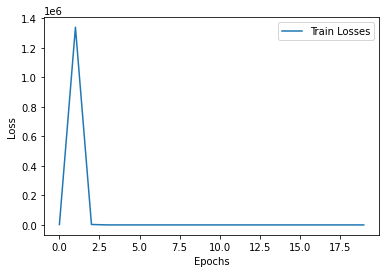

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2023.5075684
Epoch: 001, LR: 0.010000, Train Loss: 4363188.5000000
Epoch: 002, LR: 0.010000, Train Loss: 8990.5458984
Epoch: 003, LR: 0.010000, Train Loss: 3.1296599
Epoch: 004, LR: 0.010000, Train Loss: 1.0753528
Epoch: 005, LR: 0.010000, Train Loss: 1.0737423
Epoch: 006, LR: 0.010000, Train Loss: 1.0709057
Epoch: 007, LR: 0.010000, Train Loss: 1.0666085
Epoch: 008, LR: 0.010000, Train Loss: 1.0605655
Epoch: 009, LR: 0.010000, Train Loss: 1.0526707
Epoch: 010, LR: 0.010000, Train Loss: 1.0427532
Epoch: 011, LR: 0.010000, Train Loss: 1.0307037
Epoch: 012, LR: 0.010000, Train Loss: 1.0164305
Epoch: 013, LR: 0.010000, Train Loss: 0.9998896
Epoch: 014, LR: 0.010000, Train Loss: 0.9810450
Epoch: 015, LR: 0.010000, Train Loss: 0.9598739
Epoch: 016, LR: 0.010000, Train Loss: 0.9364375
Epoch: 017, LR: 0.010000, Train Loss: 0.9108531
Epoch: 018, LR: 0.010000, Train Loss: 0.8832952
Epoch: 019, LR:

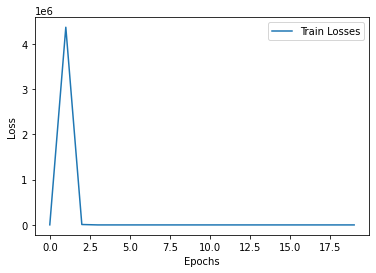

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1874.4018555
Epoch: 001, LR: 0.010000, Train Loss: 1641457.0000000
Epoch: 002, LR: 0.010000, Train Loss: 9330.8476562
Epoch: 003, LR: 0.010000, Train Loss: 1.2682891
Epoch: 004, LR: 0.010000, Train Loss: 1.0318003
Epoch: 005, LR: 0.010000, Train Loss: 1.0289842
Epoch: 006, LR: 0.010000, Train Loss: 1.0249078
Epoch: 007, LR: 0.010000, Train Loss: 1.0190694
Epoch: 008, LR: 0.010000, Train Loss: 1.0112007
Epoch: 009, LR: 0.010000, Train Loss: 1.0009501
Epoch: 010, LR: 0.010000, Train Loss: 0.9881775
Epoch: 011, LR: 0.010000, Train Loss: 0.9726981
Epoch: 012, LR: 0.010000, Train Loss: 0.9543790
Epoch: 013, LR: 0.010000, Train Loss: 0.9331582
Epoch: 014, LR: 0.010000, Train Loss: 0.9090598
Epoch: 015, LR: 0.010000, Train Loss: 0.8821971
Epoch: 016, LR: 0.010000, Train Loss: 0.8528114
Epoch: 017, LR: 0.010000, Train Loss: 0.8212530
Epoch: 018, LR: 0.010000, Train Loss: 0.7879961
Epoch: 019, LR:

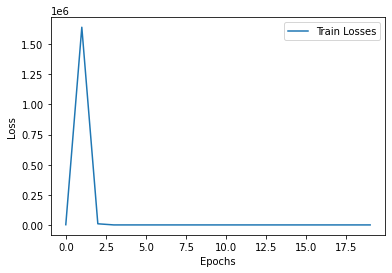

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1826.4643555
Epoch: 001, LR: 0.010000, Train Loss: 3851651.0000000
Epoch: 002, LR: 0.010000, Train Loss: 9621.0615234
Epoch: 003, LR: 0.010000, Train Loss: 7.7654200
Epoch: 004, LR: 0.010000, Train Loss: 0.9995465
Epoch: 005, LR: 0.010000, Train Loss: 0.9989187
Epoch: 006, LR: 0.010000, Train Loss: 0.9983647
Epoch: 007, LR: 0.010000, Train Loss: 0.9976601
Epoch: 008, LR: 0.010000, Train Loss: 0.9967090
Epoch: 009, LR: 0.010000, Train Loss: 0.9953556
Epoch: 010, LR: 0.010000, Train Loss: 0.9934993
Epoch: 011, LR: 0.010000, Train Loss: 0.9910412
Epoch: 012, LR: 0.010000, Train Loss: 0.9878954
Epoch: 013, LR: 0.010000, Train Loss: 0.9839844
Epoch: 014, LR: 0.010000, Train Loss: 0.9792314
Epoch: 015, LR: 0.010000, Train Loss: 0.9735689
Epoch: 016, LR: 0.010000, Train Loss: 0.9669377
Epoch: 017, LR: 0.010000, Train Loss: 0.9592907
Epoch: 018, LR: 0.010000, Train Loss: 0.9505873
Epoch: 019, LR:

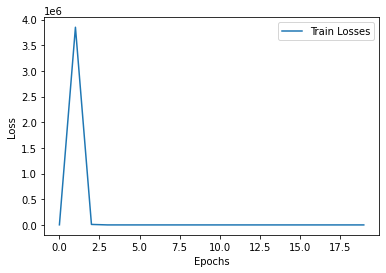

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2058.3903809
Epoch: 001, LR: 0.010000, Train Loss: 4411651.5000000
Epoch: 002, LR: 0.010000, Train Loss: 13634.5712891
Epoch: 003, LR: 0.010000, Train Loss: 3.1126602
Epoch: 004, LR: 0.010000, Train Loss: 1.0964133
Epoch: 005, LR: 0.010000, Train Loss: 1.0948229
Epoch: 006, LR: 0.010000, Train Loss: 1.0929818
Epoch: 007, LR: 0.010000, Train Loss: 1.0905002
Epoch: 008, LR: 0.010000, Train Loss: 1.0870869
Epoch: 009, LR: 0.010000, Train Loss: 1.0826160
Epoch: 010, LR: 0.010000, Train Loss: 1.0769420
Epoch: 011, LR: 0.010000, Train Loss: 1.0699521
Epoch: 012, LR: 0.010000, Train Loss: 1.0615170
Epoch: 013, LR: 0.010000, Train Loss: 1.0515376
Epoch: 014, LR: 0.010000, Train Loss: 1.0399305
Epoch: 015, LR: 0.010000, Train Loss: 1.0266253
Epoch: 016, LR: 0.010000, Train Loss: 1.0115763
Epoch: 017, LR: 0.010000, Train Loss: 0.9947741
Epoch: 018, LR: 0.010000, Train Loss: 0.9762228
Epoch: 019, LR

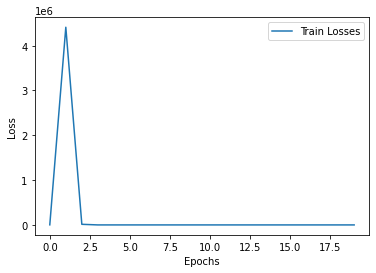

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2388.4775391
Epoch: 001, LR: 0.010000, Train Loss: 3851242.0000000
Epoch: 002, LR: 0.010000, Train Loss: 13477.0380859
Epoch: 003, LR: 0.010000, Train Loss: 8.1079645
Epoch: 004, LR: 0.010000, Train Loss: 1.0255357
Epoch: 005, LR: 0.010000, Train Loss: 1.0249746
Epoch: 006, LR: 0.010000, Train Loss: 1.0235227
Epoch: 007, LR: 0.010000, Train Loss: 1.0209516
Epoch: 008, LR: 0.010000, Train Loss: 1.0170729
Epoch: 009, LR: 0.010000, Train Loss: 1.0117273
Epoch: 010, LR: 0.010000, Train Loss: 1.0047153
Epoch: 011, LR: 0.010000, Train Loss: 0.9958962
Epoch: 012, LR: 0.010000, Train Loss: 0.9851217
Epoch: 013, LR: 0.010000, Train Loss: 0.9722886
Epoch: 014, LR: 0.010000, Train Loss: 0.9573228
Epoch: 015, LR: 0.010000, Train Loss: 0.9402009
Epoch: 016, LR: 0.010000, Train Loss: 0.9209276
Epoch: 017, LR: 0.010000, Train Loss: 0.8995618
Epoch: 018, LR: 0.010000, Train Loss: 0.8762190
Epoch: 019, LR

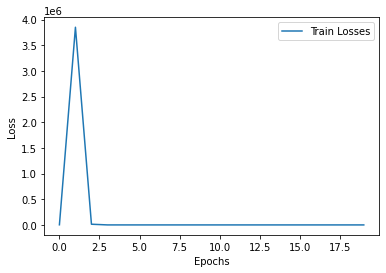

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2064.2219238
Epoch: 001, LR: 0.010000, Train Loss: 1842316.5000000
Epoch: 002, LR: 0.010000, Train Loss: 5460.9150391
Epoch: 003, LR: 0.010000, Train Loss: 16.1424122
Epoch: 004, LR: 0.010000, Train Loss: 0.9314565
Epoch: 005, LR: 0.010000, Train Loss: 0.9293951
Epoch: 006, LR: 0.010000, Train Loss: 0.9284645
Epoch: 007, LR: 0.010000, Train Loss: 0.9270849
Epoch: 008, LR: 0.010000, Train Loss: 0.9250427
Epoch: 009, LR: 0.010000, Train Loss: 0.9222377
Epoch: 010, LR: 0.010000, Train Loss: 0.9185072
Epoch: 011, LR: 0.010000, Train Loss: 0.9137710
Epoch: 012, LR: 0.010000, Train Loss: 0.9079471
Epoch: 013, LR: 0.010000, Train Loss: 0.9009621
Epoch: 014, LR: 0.010000, Train Loss: 0.8927488
Epoch: 015, LR: 0.010000, Train Loss: 0.8832533
Epoch: 016, LR: 0.010000, Train Loss: 0.8724369
Epoch: 017, LR: 0.010000, Train Loss: 0.8602968
Epoch: 018, LR: 0.010000, Train Loss: 0.8468103
Epoch: 019, LR

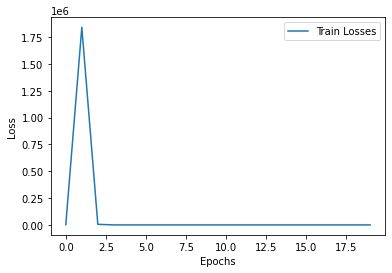

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1729.4476318
Epoch: 001, LR: 0.010000, Train Loss: 1600742.5000000
Epoch: 002, LR: 0.010000, Train Loss: 6230.7836914
Epoch: 003, LR: 0.010000, Train Loss: 1.5481611
Epoch: 004, LR: 0.010000, Train Loss: 1.0521685
Epoch: 005, LR: 0.010000, Train Loss: 1.0513482
Epoch: 006, LR: 0.010000, Train Loss: 1.0488435
Epoch: 007, LR: 0.010000, Train Loss: 1.0446038
Epoch: 008, LR: 0.010000, Train Loss: 1.0385516
Epoch: 009, LR: 0.010000, Train Loss: 1.0304916
Epoch: 010, LR: 0.010000, Train Loss: 1.0201843
Epoch: 011, LR: 0.010000, Train Loss: 1.0074688
Epoch: 012, LR: 0.010000, Train Loss: 0.9920838
Epoch: 013, LR: 0.010000, Train Loss: 0.9738762
Epoch: 014, LR: 0.010000, Train Loss: 0.9528295
Epoch: 015, LR: 0.010000, Train Loss: 0.9289395
Epoch: 016, LR: 0.010000, Train Loss: 0.9022737
Epoch: 017, LR: 0.010000, Train Loss: 0.8729951
Epoch: 018, LR: 0.010000, Train Loss: 0.8413762
Epoch: 019, LR:

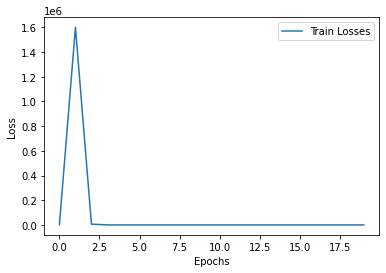

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2083.1281738
Epoch: 001, LR: 0.010000, Train Loss: 1891438.3750000
Epoch: 002, LR: 0.010000, Train Loss: 4692.2070312
Epoch: 003, LR: 0.010000, Train Loss: 1.1601422
Epoch: 004, LR: 0.010000, Train Loss: 0.9411142
Epoch: 005, LR: 0.010000, Train Loss: 0.9408598
Epoch: 006, LR: 0.010000, Train Loss: 0.9395192
Epoch: 007, LR: 0.010000, Train Loss: 0.9369862
Epoch: 008, LR: 0.010000, Train Loss: 0.9332513
Epoch: 009, LR: 0.010000, Train Loss: 0.9281384
Epoch: 010, LR: 0.010000, Train Loss: 0.9214922
Epoch: 011, LR: 0.010000, Train Loss: 0.9132141
Epoch: 012, LR: 0.010000, Train Loss: 0.9031857
Epoch: 013, LR: 0.010000, Train Loss: 0.8913081
Epoch: 014, LR: 0.010000, Train Loss: 0.8775144
Epoch: 015, LR: 0.010000, Train Loss: 0.8617614
Epoch: 016, LR: 0.010000, Train Loss: 0.8440336
Epoch: 017, LR: 0.010000, Train Loss: 0.8243777
Epoch: 018, LR: 0.010000, Train Loss: 0.8028917
Epoch: 019, LR:

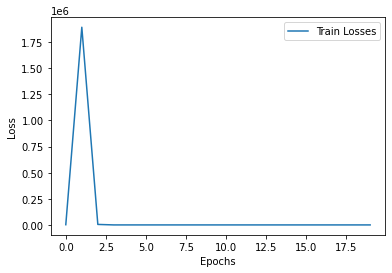

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1701.8970947
Epoch: 001, LR: 0.010000, Train Loss: 1856891.1250000
Epoch: 002, LR: 0.010000, Train Loss: 11933.4228516
Epoch: 003, LR: 0.010000, Train Loss: 3946.0898438
Epoch: 004, LR: 0.010000, Train Loss: 197.7748108
Epoch: 005, LR: 0.010000, Train Loss: 518.0779419
Epoch: 006, LR: 0.010000, Train Loss: 518.3317871
Epoch: 007, LR: 0.010000, Train Loss: 277.8473511
Epoch: 008, LR: 0.010000, Train Loss: 78.3861542
Epoch: 009, LR: 0.010000, Train Loss: 5.6233878
Epoch: 010, LR: 0.010000, Train Loss: 1.2408694
Epoch: 011, LR: 0.010000, Train Loss: 1.1302434
Epoch: 012, LR: 0.010000, Train Loss: 1.0955257
Epoch: 013, LR: 0.010000, Train Loss: 1.0942137
Epoch: 014, LR: 0.010000, Train Loss: 1.0922776
Epoch: 015, LR: 0.010000, Train Loss: 1.0895768
Epoch: 016, LR: 0.010000, Train Loss: 1.0859793
Epoch: 017, LR: 0.010000, Train Loss: 1.0813687
Epoch: 018, LR: 0.010000, Train Loss: 1.0756365
Ep

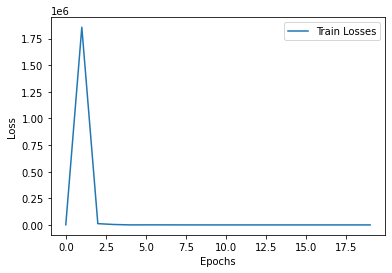

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 3209.4545898
Epoch: 001, LR: 0.010000, Train Loss: 2155654.7500000
Epoch: 002, LR: 0.010000, Train Loss: 7019.0781250
Epoch: 003, LR: 0.010000, Train Loss: 1.1659507
Epoch: 004, LR: 0.010000, Train Loss: 0.9563309
Epoch: 005, LR: 0.010000, Train Loss: 0.9552372
Epoch: 006, LR: 0.010000, Train Loss: 0.9529138
Epoch: 007, LR: 0.010000, Train Loss: 0.9491659
Epoch: 008, LR: 0.010000, Train Loss: 0.9437683
Epoch: 009, LR: 0.010000, Train Loss: 0.9364718
Epoch: 010, LR: 0.010000, Train Loss: 0.9270522
Epoch: 011, LR: 0.010000, Train Loss: 0.9153484
Epoch: 012, LR: 0.010000, Train Loss: 0.9012063
Epoch: 013, LR: 0.010000, Train Loss: 0.8845094
Epoch: 014, LR: 0.010000, Train Loss: 0.8652171
Epoch: 015, LR: 0.010000, Train Loss: 0.8433690
Epoch: 016, LR: 0.010000, Train Loss: 0.8190671
Epoch: 017, LR: 0.010000, Train Loss: 0.7925889
Epoch: 018, LR: 0.010000, Train Loss: 0.7643105
Epoch: 019, LR:

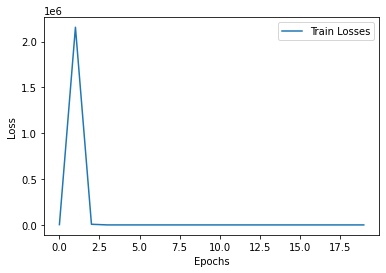

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2020.1041260
Epoch: 001, LR: 0.010000, Train Loss: 3659727.5000000
Epoch: 002, LR: 0.010000, Train Loss: 6734.5556641
Epoch: 003, LR: 0.010000, Train Loss: 1.4442900
Epoch: 004, LR: 0.010000, Train Loss: 1.0489240
Epoch: 005, LR: 0.010000, Train Loss: 1.0470568
Epoch: 006, LR: 0.010000, Train Loss: 1.0447249
Epoch: 007, LR: 0.010000, Train Loss: 1.0414780
Epoch: 008, LR: 0.010000, Train Loss: 1.0369803
Epoch: 009, LR: 0.010000, Train Loss: 1.0311497
Epoch: 010, LR: 0.010000, Train Loss: 1.0238682
Epoch: 011, LR: 0.010000, Train Loss: 1.0149962
Epoch: 012, LR: 0.010000, Train Loss: 1.0044094
Epoch: 013, LR: 0.010000, Train Loss: 0.9920608
Epoch: 014, LR: 0.010000, Train Loss: 0.9778726
Epoch: 015, LR: 0.010000, Train Loss: 0.9618002
Epoch: 016, LR: 0.010000, Train Loss: 0.9438350
Epoch: 017, LR: 0.010000, Train Loss: 0.9240058
Epoch: 018, LR: 0.010000, Train Loss: 0.9023790
Epoch: 019, LR:

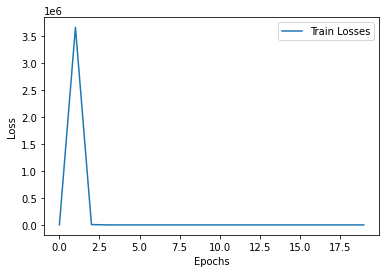

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1861.2637939
Epoch: 001, LR: 0.010000, Train Loss: 3617766.5000000
Epoch: 002, LR: 0.010000, Train Loss: 13160.4414062
Epoch: 003, LR: 0.010000, Train Loss: 1.1823540
Epoch: 004, LR: 0.010000, Train Loss: 1.0889331
Epoch: 005, LR: 0.010000, Train Loss: 1.0877661
Epoch: 006, LR: 0.010000, Train Loss: 1.0852970
Epoch: 007, LR: 0.010000, Train Loss: 1.0811284
Epoch: 008, LR: 0.010000, Train Loss: 1.0749922
Epoch: 009, LR: 0.010000, Train Loss: 1.0666637
Epoch: 010, LR: 0.010000, Train Loss: 1.0557699
Epoch: 011, LR: 0.010000, Train Loss: 1.0421824
Epoch: 012, LR: 0.010000, Train Loss: 1.0256814
Epoch: 013, LR: 0.010000, Train Loss: 1.0062145
Epoch: 014, LR: 0.010000, Train Loss: 0.9836931
Epoch: 015, LR: 0.010000, Train Loss: 0.9581223
Epoch: 016, LR: 0.010000, Train Loss: 0.9295770
Epoch: 017, LR: 0.010000, Train Loss: 0.8982294
Epoch: 018, LR: 0.010000, Train Loss: 0.8643730
Epoch: 019, LR

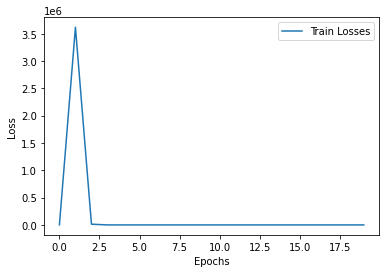

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1623.3540039
Epoch: 001, LR: 0.010000, Train Loss: 4999704.0000000
Epoch: 002, LR: 0.010000, Train Loss: 18329.5898438
Epoch: 003, LR: 0.010000, Train Loss: 1.2638943
Epoch: 004, LR: 0.010000, Train Loss: 1.1551340
Epoch: 005, LR: 0.010000, Train Loss: 1.1530925
Epoch: 006, LR: 0.010000, Train Loss: 1.1492001
Epoch: 007, LR: 0.010000, Train Loss: 1.1430941
Epoch: 008, LR: 0.010000, Train Loss: 1.1345637
Epoch: 009, LR: 0.010000, Train Loss: 1.1233435
Epoch: 010, LR: 0.010000, Train Loss: 1.1091460
Epoch: 011, LR: 0.010000, Train Loss: 1.0917456
Epoch: 012, LR: 0.010000, Train Loss: 1.0710855
Epoch: 013, LR: 0.010000, Train Loss: 1.0471191
Epoch: 014, LR: 0.010000, Train Loss: 1.0198990
Epoch: 015, LR: 0.010000, Train Loss: 0.9896163
Epoch: 016, LR: 0.010000, Train Loss: 0.9565539
Epoch: 017, LR: 0.010000, Train Loss: 0.9211380
Epoch: 018, LR: 0.010000, Train Loss: 0.8839467
Epoch: 019, LR

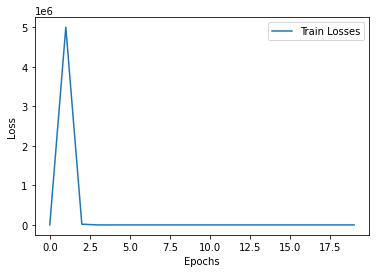

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2109.5097656
Epoch: 001, LR: 0.010000, Train Loss: 1926297.0000000
Epoch: 002, LR: 0.010000, Train Loss: 12236.2226562
Epoch: 003, LR: 0.010000, Train Loss: 6.0159116
Epoch: 004, LR: 0.010000, Train Loss: 0.9490505
Epoch: 005, LR: 0.010000, Train Loss: 0.9498493
Epoch: 006, LR: 0.010000, Train Loss: 0.9494131
Epoch: 007, LR: 0.010000, Train Loss: 0.9477775
Epoch: 008, LR: 0.010000, Train Loss: 0.9448529
Epoch: 009, LR: 0.010000, Train Loss: 0.9405213
Epoch: 010, LR: 0.010000, Train Loss: 0.9347101
Epoch: 011, LR: 0.010000, Train Loss: 0.9273546
Epoch: 012, LR: 0.010000, Train Loss: 0.9183791
Epoch: 013, LR: 0.010000, Train Loss: 0.9077296
Epoch: 014, LR: 0.010000, Train Loss: 0.8952975
Epoch: 015, LR: 0.010000, Train Loss: 0.8810159
Epoch: 016, LR: 0.010000, Train Loss: 0.8648387
Epoch: 017, LR: 0.010000, Train Loss: 0.8467641
Epoch: 018, LR: 0.010000, Train Loss: 0.8268179
Epoch: 019, LR

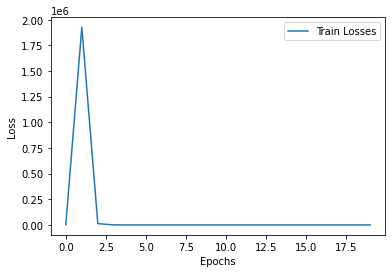

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 3240.0859375
Epoch: 001, LR: 0.010000, Train Loss: 2135768.7500000
Epoch: 002, LR: 0.010000, Train Loss: 3526.1972656
Epoch: 003, LR: 0.010000, Train Loss: 7.4514022
Epoch: 004, LR: 0.010000, Train Loss: 1.0259427
Epoch: 005, LR: 0.010000, Train Loss: 1.0125046
Epoch: 006, LR: 0.010000, Train Loss: 1.0108578
Epoch: 007, LR: 0.010000, Train Loss: 1.0077270
Epoch: 008, LR: 0.010000, Train Loss: 1.0029067
Epoch: 009, LR: 0.010000, Train Loss: 0.9961591
Epoch: 010, LR: 0.010000, Train Loss: 0.9872903
Epoch: 011, LR: 0.010000, Train Loss: 0.9761640
Epoch: 012, LR: 0.010000, Train Loss: 0.9626913
Epoch: 013, LR: 0.010000, Train Loss: 0.9468052
Epoch: 014, LR: 0.010000, Train Loss: 0.9284737
Epoch: 015, LR: 0.010000, Train Loss: 0.9077262
Epoch: 016, LR: 0.010000, Train Loss: 0.8846368
Epoch: 017, LR: 0.010000, Train Loss: 0.8593481
Epoch: 018, LR: 0.010000, Train Loss: 0.8320681
Epoch: 019, LR:

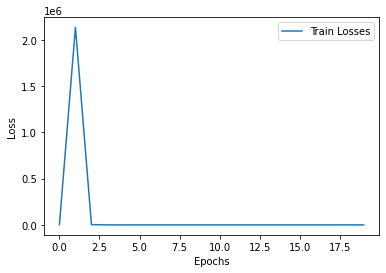

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1091.1208496
Epoch: 001, LR: 0.010000, Train Loss: 1446089.0000000
Epoch: 002, LR: 0.010000, Train Loss: 6070.9414062
Epoch: 003, LR: 0.010000, Train Loss: 1562.2111816
Epoch: 004, LR: 0.010000, Train Loss: 128.4384003
Epoch: 005, LR: 0.010000, Train Loss: 182.2969666
Epoch: 006, LR: 0.010000, Train Loss: 78.7737885
Epoch: 007, LR: 0.010000, Train Loss: 5.1745982
Epoch: 008, LR: 0.010000, Train Loss: 1.0509911
Epoch: 009, LR: 0.010000, Train Loss: 1.0190263
Epoch: 010, LR: 0.010000, Train Loss: 1.0153804
Epoch: 011, LR: 0.010000, Train Loss: 1.0141866
Epoch: 012, LR: 0.010000, Train Loss: 1.0123825
Epoch: 013, LR: 0.010000, Train Loss: 1.0098165
Epoch: 014, LR: 0.010000, Train Loss: 1.0063850
Epoch: 015, LR: 0.010000, Train Loss: 1.0020078
Epoch: 016, LR: 0.010000, Train Loss: 0.9966160
Epoch: 017, LR: 0.010000, Train Loss: 0.9901502
Epoch: 018, LR: 0.010000, Train Loss: 0.9825578
Epoch: 

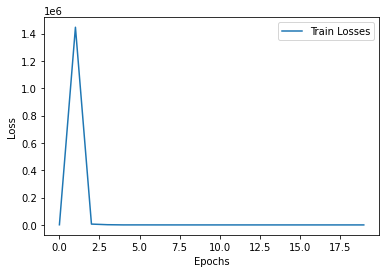

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2040.9288330
Epoch: 001, LR: 0.010000, Train Loss: 2124029.5000000
Epoch: 002, LR: 0.010000, Train Loss: 7005.7626953
Epoch: 003, LR: 0.010000, Train Loss: 1.6290948
Epoch: 004, LR: 0.010000, Train Loss: 1.2895354
Epoch: 005, LR: 0.010000, Train Loss: 1.2875282
Epoch: 006, LR: 0.010000, Train Loss: 1.2840828
Epoch: 007, LR: 0.010000, Train Loss: 1.2788705
Epoch: 008, LR: 0.010000, Train Loss: 1.2715540
Epoch: 009, LR: 0.010000, Train Loss: 1.2617984
Epoch: 010, LR: 0.010000, Train Loss: 1.2492926
Epoch: 011, LR: 0.010000, Train Loss: 1.2338122
Epoch: 012, LR: 0.010000, Train Loss: 1.2151242
Epoch: 013, LR: 0.010000, Train Loss: 1.1930646
Epoch: 014, LR: 0.010000, Train Loss: 1.1675134
Epoch: 015, LR: 0.010000, Train Loss: 1.1384703
Epoch: 016, LR: 0.010000, Train Loss: 1.1060196
Epoch: 017, LR: 0.010000, Train Loss: 1.0703512
Epoch: 018, LR: 0.010000, Train Loss: 1.0317761
Epoch: 019, LR:

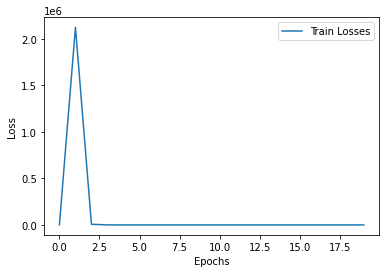

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1734.1173096
Epoch: 001, LR: 0.010000, Train Loss: 1719689.5000000
Epoch: 002, LR: 0.010000, Train Loss: 6503.4868164
Epoch: 003, LR: 0.010000, Train Loss: 695.8572998
Epoch: 004, LR: 0.010000, Train Loss: 133.7838135
Epoch: 005, LR: 0.010000, Train Loss: 79.4410706
Epoch: 006, LR: 0.010000, Train Loss: 29.6906281
Epoch: 007, LR: 0.010000, Train Loss: 30.3966980
Epoch: 008, LR: 0.010000, Train Loss: 10.6037512
Epoch: 009, LR: 0.010000, Train Loss: 5.6851735
Epoch: 010, LR: 0.010000, Train Loss: 3.9257717
Epoch: 011, LR: 0.010000, Train Loss: 2.6351964
Epoch: 012, LR: 0.010000, Train Loss: 1.8015808
Epoch: 013, LR: 0.010000, Train Loss: 1.3464311
Epoch: 014, LR: 0.010000, Train Loss: 1.1612462
Epoch: 015, LR: 0.010000, Train Loss: 1.1188376
Epoch: 016, LR: 0.010000, Train Loss: 1.1110376
Epoch: 017, LR: 0.010000, Train Loss: 1.0999047
Epoch: 018, LR: 0.010000, Train Loss: 1.0943105
Epoch: 

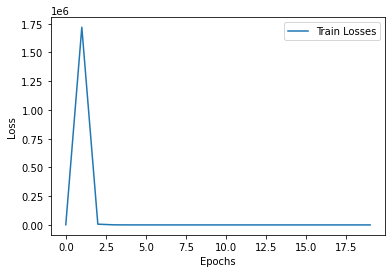

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2677.2663574
Epoch: 001, LR: 0.010000, Train Loss: 3666378.7500000
Epoch: 002, LR: 0.010000, Train Loss: 14678.0673828
Epoch: 003, LR: 0.010000, Train Loss: 6.0487242
Epoch: 004, LR: 0.010000, Train Loss: 0.8960793
Epoch: 005, LR: 0.010000, Train Loss: 0.8959671
Epoch: 006, LR: 0.010000, Train Loss: 0.8947866
Epoch: 007, LR: 0.010000, Train Loss: 0.8924690
Epoch: 008, LR: 0.010000, Train Loss: 0.8889396
Epoch: 009, LR: 0.010000, Train Loss: 0.8840986
Epoch: 010, LR: 0.010000, Train Loss: 0.8778174
Epoch: 011, LR: 0.010000, Train Loss: 0.8699796
Epoch: 012, LR: 0.010000, Train Loss: 0.8603989
Epoch: 013, LR: 0.010000, Train Loss: 0.8489938
Epoch: 014, LR: 0.010000, Train Loss: 0.8357055
Epoch: 015, LR: 0.010000, Train Loss: 0.8204343
Epoch: 016, LR: 0.010000, Train Loss: 0.8030982
Epoch: 017, LR: 0.010000, Train Loss: 0.7836903
Epoch: 018, LR: 0.010000, Train Loss: 0.7622668
Epoch: 019, LR

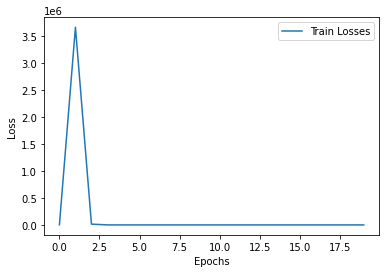

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1763.8795166
Epoch: 001, LR: 0.010000, Train Loss: 2145224.2500000
Epoch: 002, LR: 0.010000, Train Loss: 10713.2412109
Epoch: 003, LR: 0.010000, Train Loss: 4.2974486
Epoch: 004, LR: 0.010000, Train Loss: 1.0434430
Epoch: 005, LR: 0.010000, Train Loss: 1.0426161
Epoch: 006, LR: 0.010000, Train Loss: 1.0410066
Epoch: 007, LR: 0.010000, Train Loss: 1.0381162
Epoch: 008, LR: 0.010000, Train Loss: 1.0335848
Epoch: 009, LR: 0.010000, Train Loss: 1.0272059
Epoch: 010, LR: 0.010000, Train Loss: 1.0188043
Epoch: 011, LR: 0.010000, Train Loss: 1.0081930
Epoch: 012, LR: 0.010000, Train Loss: 0.9952525
Epoch: 013, LR: 0.010000, Train Loss: 0.9798876
Epoch: 014, LR: 0.010000, Train Loss: 0.9620454
Epoch: 015, LR: 0.010000, Train Loss: 0.9417248
Epoch: 016, LR: 0.010000, Train Loss: 0.9189827
Epoch: 017, LR: 0.010000, Train Loss: 0.8939606
Epoch: 018, LR: 0.010000, Train Loss: 0.8668618
Epoch: 019, LR

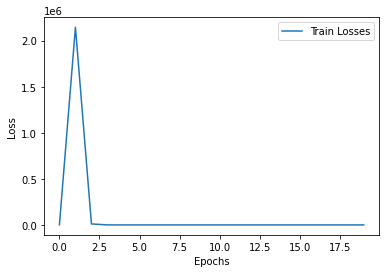

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1811.0144043
Epoch: 001, LR: 0.010000, Train Loss: 2353691.5000000
Epoch: 002, LR: 0.010000, Train Loss: 4279.4790039
Epoch: 003, LR: 0.010000, Train Loss: 2.8894191
Epoch: 004, LR: 0.010000, Train Loss: 0.8752929
Epoch: 005, LR: 0.010000, Train Loss: 0.8746116
Epoch: 006, LR: 0.010000, Train Loss: 0.8734563
Epoch: 007, LR: 0.010000, Train Loss: 0.8716525
Epoch: 008, LR: 0.010000, Train Loss: 0.8690984
Epoch: 009, LR: 0.010000, Train Loss: 0.8656430
Epoch: 010, LR: 0.010000, Train Loss: 0.8611150
Epoch: 011, LR: 0.010000, Train Loss: 0.8553420
Epoch: 012, LR: 0.010000, Train Loss: 0.8481517
Epoch: 013, LR: 0.010000, Train Loss: 0.8394440
Epoch: 014, LR: 0.010000, Train Loss: 0.8291275
Epoch: 015, LR: 0.010000, Train Loss: 0.8171256
Epoch: 016, LR: 0.010000, Train Loss: 0.8033721
Epoch: 017, LR: 0.010000, Train Loss: 0.7878738
Epoch: 018, LR: 0.010000, Train Loss: 0.7706614
Epoch: 019, LR:

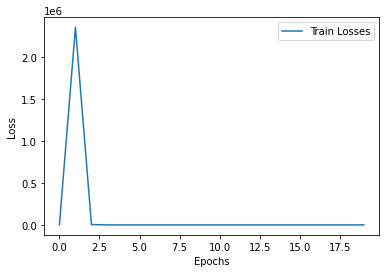

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2528.6154785
Epoch: 001, LR: 0.010000, Train Loss: 3470419.2500000
Epoch: 002, LR: 0.010000, Train Loss: 9855.5039062
Epoch: 003, LR: 0.010000, Train Loss: 1.1556858
Epoch: 004, LR: 0.010000, Train Loss: 1.0417970
Epoch: 005, LR: 0.010000, Train Loss: 1.0398545
Epoch: 006, LR: 0.010000, Train Loss: 1.0364434
Epoch: 007, LR: 0.010000, Train Loss: 1.0314112
Epoch: 008, LR: 0.010000, Train Loss: 1.0247178
Epoch: 009, LR: 0.010000, Train Loss: 1.0162092
Epoch: 010, LR: 0.010000, Train Loss: 1.0057318
Epoch: 011, LR: 0.010000, Train Loss: 0.9932162
Epoch: 012, LR: 0.010000, Train Loss: 0.9786068
Epoch: 013, LR: 0.010000, Train Loss: 0.9618962
Epoch: 014, LR: 0.010000, Train Loss: 0.9430965
Epoch: 015, LR: 0.010000, Train Loss: 0.9222336
Epoch: 016, LR: 0.010000, Train Loss: 0.8994343
Epoch: 017, LR: 0.010000, Train Loss: 0.8748685
Epoch: 018, LR: 0.010000, Train Loss: 0.8487613
Epoch: 019, LR:

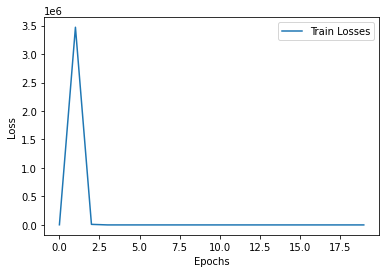

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1812.5815430
Epoch: 001, LR: 0.010000, Train Loss: 5486202.0000000
Epoch: 002, LR: 0.010000, Train Loss: 6663.5834961
Epoch: 003, LR: 0.010000, Train Loss: 1.6966386
Epoch: 004, LR: 0.010000, Train Loss: 1.2881026
Epoch: 005, LR: 0.010000, Train Loss: 1.2874187
Epoch: 006, LR: 0.010000, Train Loss: 1.2852046
Epoch: 007, LR: 0.010000, Train Loss: 1.2812413
Epoch: 008, LR: 0.010000, Train Loss: 1.2754498
Epoch: 009, LR: 0.010000, Train Loss: 1.2675275
Epoch: 010, LR: 0.010000, Train Loss: 1.2573543
Epoch: 011, LR: 0.010000, Train Loss: 1.2446564
Epoch: 012, LR: 0.010000, Train Loss: 1.2291876
Epoch: 013, LR: 0.010000, Train Loss: 1.2108891
Epoch: 014, LR: 0.010000, Train Loss: 1.1896573
Epoch: 015, LR: 0.010000, Train Loss: 1.1654615
Epoch: 016, LR: 0.010000, Train Loss: 1.1382927
Epoch: 017, LR: 0.010000, Train Loss: 1.1082067
Epoch: 018, LR: 0.010000, Train Loss: 1.0754144
Epoch: 019, LR:

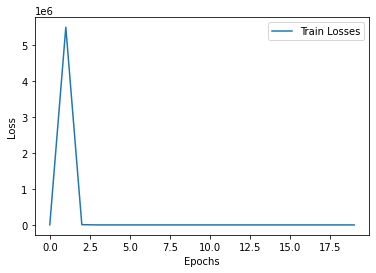

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2601.3149414
Epoch: 001, LR: 0.010000, Train Loss: 1584103.7500000
Epoch: 002, LR: 0.010000, Train Loss: 4987.4482422
Epoch: 003, LR: 0.010000, Train Loss: 1.2384914
Epoch: 004, LR: 0.010000, Train Loss: 1.1645868
Epoch: 005, LR: 0.010000, Train Loss: 1.1641241
Epoch: 006, LR: 0.010000, Train Loss: 1.1625904
Epoch: 007, LR: 0.010000, Train Loss: 1.1598426
Epoch: 008, LR: 0.010000, Train Loss: 1.1557466
Epoch: 009, LR: 0.010000, Train Loss: 1.1501476
Epoch: 010, LR: 0.010000, Train Loss: 1.1429738
Epoch: 011, LR: 0.010000, Train Loss: 1.1340818
Epoch: 012, LR: 0.010000, Train Loss: 1.1233565
Epoch: 013, LR: 0.010000, Train Loss: 1.1107258
Epoch: 014, LR: 0.010000, Train Loss: 1.0961257
Epoch: 015, LR: 0.010000, Train Loss: 1.0795373
Epoch: 016, LR: 0.010000, Train Loss: 1.0609643
Epoch: 017, LR: 0.010000, Train Loss: 1.0404561
Epoch: 018, LR: 0.010000, Train Loss: 1.0181088
Epoch: 019, LR:

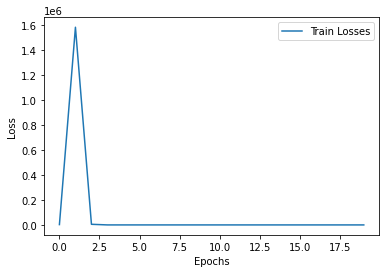

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2355.9509277
Epoch: 001, LR: 0.010000, Train Loss: 2240198.5000000
Epoch: 002, LR: 0.010000, Train Loss: 18724.2773438
Epoch: 003, LR: 0.010000, Train Loss: 198.0629883
Epoch: 004, LR: 0.010000, Train Loss: 39.1863556
Epoch: 005, LR: 0.010000, Train Loss: 16.9748211
Epoch: 006, LR: 0.010000, Train Loss: 2.7232292
Epoch: 007, LR: 0.010000, Train Loss: 1.3056339
Epoch: 008, LR: 0.010000, Train Loss: 1.1536053
Epoch: 009, LR: 0.010000, Train Loss: 1.1257097
Epoch: 010, LR: 0.010000, Train Loss: 1.1240891
Epoch: 011, LR: 0.010000, Train Loss: 1.1218054
Epoch: 012, LR: 0.010000, Train Loss: 1.1186899
Epoch: 013, LR: 0.010000, Train Loss: 1.1146424
Epoch: 014, LR: 0.010000, Train Loss: 1.1095729
Epoch: 015, LR: 0.010000, Train Loss: 1.1033728
Epoch: 016, LR: 0.010000, Train Loss: 1.0959965
Epoch: 017, LR: 0.010000, Train Loss: 1.0873842
Epoch: 018, LR: 0.010000, Train Loss: 1.0774870
Epoch: 019

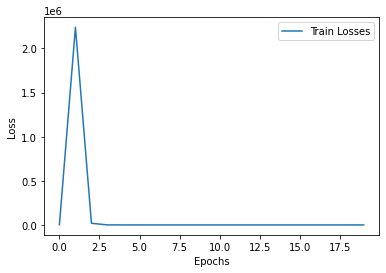

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1909.1983643
Epoch: 001, LR: 0.010000, Train Loss: 1547332.6250000
Epoch: 002, LR: 0.010000, Train Loss: 3289.6398926
Epoch: 003, LR: 0.010000, Train Loss: 0.9228800
Epoch: 004, LR: 0.010000, Train Loss: 0.8003436
Epoch: 005, LR: 0.010000, Train Loss: 0.7992743
Epoch: 006, LR: 0.010000, Train Loss: 0.7971849
Epoch: 007, LR: 0.010000, Train Loss: 0.7938076
Epoch: 008, LR: 0.010000, Train Loss: 0.7889707
Epoch: 009, LR: 0.010000, Train Loss: 0.7825078
Epoch: 010, LR: 0.010000, Train Loss: 0.7742409
Epoch: 011, LR: 0.010000, Train Loss: 0.7640734
Epoch: 012, LR: 0.010000, Train Loss: 0.7519218
Epoch: 013, LR: 0.010000, Train Loss: 0.7377005
Epoch: 014, LR: 0.010000, Train Loss: 0.7213986
Epoch: 015, LR: 0.010000, Train Loss: 0.7030842
Epoch: 016, LR: 0.010000, Train Loss: 0.6828623
Epoch: 017, LR: 0.010000, Train Loss: 0.6609109
Epoch: 018, LR: 0.010000, Train Loss: 0.6374793
Epoch: 019, LR:

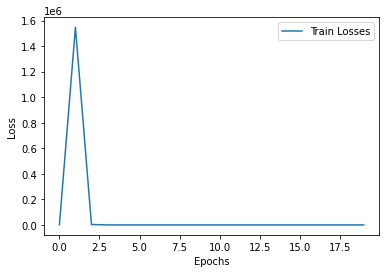

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2448.0773926
Epoch: 001, LR: 0.010000, Train Loss: 2101681.0000000
Epoch: 002, LR: 0.010000, Train Loss: 8718.8417969
Epoch: 003, LR: 0.010000, Train Loss: 1.3644643
Epoch: 004, LR: 0.010000, Train Loss: 0.9663550
Epoch: 005, LR: 0.010000, Train Loss: 0.9651349
Epoch: 006, LR: 0.010000, Train Loss: 0.9632819
Epoch: 007, LR: 0.010000, Train Loss: 0.9605590
Epoch: 008, LR: 0.010000, Train Loss: 0.9567698
Epoch: 009, LR: 0.010000, Train Loss: 0.9517419
Epoch: 010, LR: 0.010000, Train Loss: 0.9453309
Epoch: 011, LR: 0.010000, Train Loss: 0.9373989
Epoch: 012, LR: 0.010000, Train Loss: 0.9278180
Epoch: 013, LR: 0.010000, Train Loss: 0.9164555
Epoch: 014, LR: 0.010000, Train Loss: 0.9032117
Epoch: 015, LR: 0.010000, Train Loss: 0.8880164
Epoch: 016, LR: 0.010000, Train Loss: 0.8708333
Epoch: 017, LR: 0.010000, Train Loss: 0.8516665
Epoch: 018, LR: 0.010000, Train Loss: 0.8305673
Epoch: 019, LR:

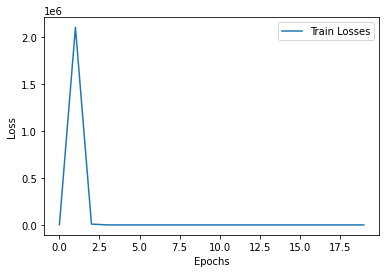

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1687.2581787
Epoch: 001, LR: 0.010000, Train Loss: 2490073.7500000
Epoch: 002, LR: 0.010000, Train Loss: 9517.2597656
Epoch: 003, LR: 0.010000, Train Loss: 1.0341729
Epoch: 004, LR: 0.010000, Train Loss: 0.8190472
Epoch: 005, LR: 0.010000, Train Loss: 0.8188024
Epoch: 006, LR: 0.010000, Train Loss: 0.8175284
Epoch: 007, LR: 0.010000, Train Loss: 0.8152492
Epoch: 008, LR: 0.010000, Train Loss: 0.8118297
Epoch: 009, LR: 0.010000, Train Loss: 0.8072347
Epoch: 010, LR: 0.010000, Train Loss: 0.8013200
Epoch: 011, LR: 0.010000, Train Loss: 0.7939302
Epoch: 012, LR: 0.010000, Train Loss: 0.7849658
Epoch: 013, LR: 0.010000, Train Loss: 0.7743386
Epoch: 014, LR: 0.010000, Train Loss: 0.7619447
Epoch: 015, LR: 0.010000, Train Loss: 0.7477428
Epoch: 016, LR: 0.010000, Train Loss: 0.7317237
Epoch: 017, LR: 0.010000, Train Loss: 0.7139186
Epoch: 018, LR: 0.010000, Train Loss: 0.6944332
Epoch: 019, LR:

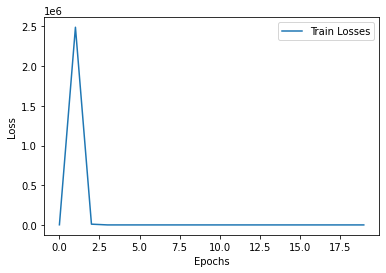

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1452.0258789
Epoch: 001, LR: 0.010000, Train Loss: 1507826.6250000
Epoch: 002, LR: 0.010000, Train Loss: 8051.4897461
Epoch: 003, LR: 0.010000, Train Loss: 2.0507269
Epoch: 004, LR: 0.010000, Train Loss: 0.8611318
Epoch: 005, LR: 0.010000, Train Loss: 0.8610119
Epoch: 006, LR: 0.010000, Train Loss: 0.8601168
Epoch: 007, LR: 0.010000, Train Loss: 0.8584214
Epoch: 008, LR: 0.010000, Train Loss: 0.8556262
Epoch: 009, LR: 0.010000, Train Loss: 0.8516364
Epoch: 010, LR: 0.010000, Train Loss: 0.8463744
Epoch: 011, LR: 0.010000, Train Loss: 0.8397422
Epoch: 012, LR: 0.010000, Train Loss: 0.8316328
Epoch: 013, LR: 0.010000, Train Loss: 0.8219446
Epoch: 014, LR: 0.010000, Train Loss: 0.8105647
Epoch: 015, LR: 0.010000, Train Loss: 0.7974367
Epoch: 016, LR: 0.010000, Train Loss: 0.7824945
Epoch: 017, LR: 0.010000, Train Loss: 0.7657498
Epoch: 018, LR: 0.010000, Train Loss: 0.7472292
Epoch: 019, LR:

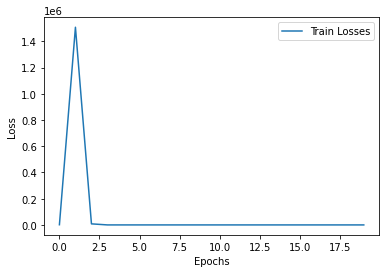

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2119.6582031
Epoch: 001, LR: 0.010000, Train Loss: 2503309.7500000
Epoch: 002, LR: 0.010000, Train Loss: 11866.6064453
Epoch: 003, LR: 0.010000, Train Loss: 511.5321045
Epoch: 004, LR: 0.010000, Train Loss: 110.0226517
Epoch: 005, LR: 0.010000, Train Loss: 81.1656494
Epoch: 006, LR: 0.010000, Train Loss: 21.4391575
Epoch: 007, LR: 0.010000, Train Loss: 2.5437231
Epoch: 008, LR: 0.010000, Train Loss: 1.1497709
Epoch: 009, LR: 0.010000, Train Loss: 1.0514138
Epoch: 010, LR: 0.010000, Train Loss: 1.0061249
Epoch: 011, LR: 0.010000, Train Loss: 1.0043479
Epoch: 012, LR: 0.010000, Train Loss: 1.0015684
Epoch: 013, LR: 0.010000, Train Loss: 0.9977464
Epoch: 014, LR: 0.010000, Train Loss: 0.9927763
Epoch: 015, LR: 0.010000, Train Loss: 0.9865674
Epoch: 016, LR: 0.010000, Train Loss: 0.9790267
Epoch: 017, LR: 0.010000, Train Loss: 0.9700707
Epoch: 018, LR: 0.010000, Train Loss: 0.9596407
Epoch: 0

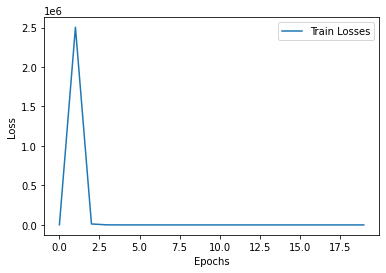

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2231.3166504
Epoch: 001, LR: 0.010000, Train Loss: 3260929.5000000
Epoch: 002, LR: 0.010000, Train Loss: 8480.2031250
Epoch: 003, LR: 0.010000, Train Loss: 740.5744629
Epoch: 004, LR: 0.010000, Train Loss: 823.9362183
Epoch: 005, LR: 0.010000, Train Loss: 615.0322266
Epoch: 006, LR: 0.010000, Train Loss: 270.8342896
Epoch: 007, LR: 0.010000, Train Loss: 521.1178589
Epoch: 008, LR: 0.010000, Train Loss: 98.5794907
Epoch: 009, LR: 0.010000, Train Loss: 248.5737152
Epoch: 010, LR: 0.010000, Train Loss: 130.5220032
Epoch: 011, LR: 0.010000, Train Loss: 122.1793823
Epoch: 012, LR: 0.010000, Train Loss: 186.2322845
Epoch: 013, LR: 0.010000, Train Loss: 45.8231964
Epoch: 014, LR: 0.010000, Train Loss: 140.9599762
Epoch: 015, LR: 0.010000, Train Loss: 53.0030441
Epoch: 016, LR: 0.010000, Train Loss: 61.1871796
Epoch: 017, LR: 0.010000, Train Loss: 84.9281540
Epoch: 018, LR: 0.010000, Train Loss: 

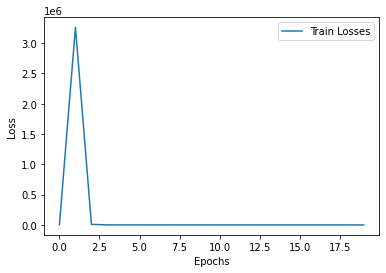

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2205.0639648
Epoch: 001, LR: 0.010000, Train Loss: 2677288.0000000
Epoch: 002, LR: 0.010000, Train Loss: 6117.5498047
Epoch: 003, LR: 0.010000, Train Loss: 6.8352480
Epoch: 004, LR: 0.010000, Train Loss: 0.7237642
Epoch: 005, LR: 0.010000, Train Loss: 0.7211345
Epoch: 006, LR: 0.010000, Train Loss: 0.7200370
Epoch: 007, LR: 0.010000, Train Loss: 0.7187466
Epoch: 008, LR: 0.010000, Train Loss: 0.7170274
Epoch: 009, LR: 0.010000, Train Loss: 0.7147386
Epoch: 010, LR: 0.010000, Train Loss: 0.7117638
Epoch: 011, LR: 0.010000, Train Loss: 0.7080374
Epoch: 012, LR: 0.010000, Train Loss: 0.7034888
Epoch: 013, LR: 0.010000, Train Loss: 0.6980460
Epoch: 014, LR: 0.010000, Train Loss: 0.6916246
Epoch: 015, LR: 0.010000, Train Loss: 0.6841961
Epoch: 016, LR: 0.010000, Train Loss: 0.6757281
Epoch: 017, LR: 0.010000, Train Loss: 0.6662024
Epoch: 018, LR: 0.010000, Train Loss: 0.6556088
Epoch: 019, LR:

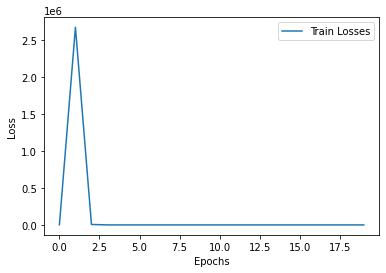

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2062.9248047
Epoch: 001, LR: 0.010000, Train Loss: 2124969.0000000
Epoch: 002, LR: 0.010000, Train Loss: 19228.9277344
Epoch: 003, LR: 0.010000, Train Loss: 15261.0683594
Epoch: 004, LR: 0.010000, Train Loss: 1058.8792725
Epoch: 005, LR: 0.010000, Train Loss: 2852.4846191
Epoch: 006, LR: 0.010000, Train Loss: 2591.2490234
Epoch: 007, LR: 0.010000, Train Loss: 874.2521973
Epoch: 008, LR: 0.010000, Train Loss: 304.1657410
Epoch: 009, LR: 0.010000, Train Loss: 359.3057861
Epoch: 010, LR: 0.010000, Train Loss: 277.2736511
Epoch: 011, LR: 0.010000, Train Loss: 168.5656281
Epoch: 012, LR: 0.010000, Train Loss: 82.0041733
Epoch: 013, LR: 0.010000, Train Loss: 29.5199032
Epoch: 014, LR: 0.010000, Train Loss: 22.3048592
Epoch: 015, LR: 0.010000, Train Loss: 33.7322731
Epoch: 016, LR: 0.010000, Train Loss: 16.7607479
Epoch: 017, LR: 0.010000, Train Loss: 63.2574921
Epoch: 018, LR: 0.010000, Train L

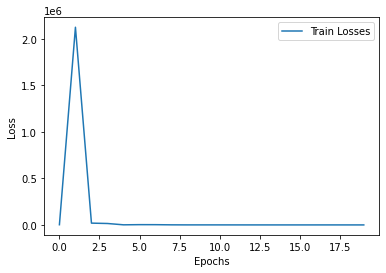

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2563.2790527
Epoch: 001, LR: 0.010000, Train Loss: 2625938.7500000
Epoch: 002, LR: 0.010000, Train Loss: 24498.4218750
Epoch: 003, LR: 0.010000, Train Loss: 603.2327881
Epoch: 004, LR: 0.010000, Train Loss: 157.9254761
Epoch: 005, LR: 0.010000, Train Loss: 252.8485413
Epoch: 006, LR: 0.010000, Train Loss: 100.7877655
Epoch: 007, LR: 0.010000, Train Loss: 104.0598068
Epoch: 008, LR: 0.010000, Train Loss: 103.1394196
Epoch: 009, LR: 0.010000, Train Loss: 55.1827393
Epoch: 010, LR: 0.010000, Train Loss: 55.9393654
Epoch: 011, LR: 0.010000, Train Loss: 49.1170273
Epoch: 012, LR: 0.010000, Train Loss: 21.4720650
Epoch: 013, LR: 0.010000, Train Loss: 27.2131462
Epoch: 014, LR: 0.010000, Train Loss: 26.9380569
Epoch: 015, LR: 0.010000, Train Loss: 10.7861938
Epoch: 016, LR: 0.010000, Train Loss: 14.2327957
Epoch: 017, LR: 0.010000, Train Loss: 17.5722752
Epoch: 018, LR: 0.010000, Train Loss: 7.3

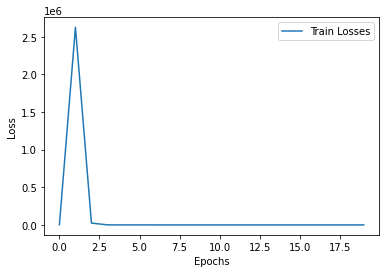

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2260.9765625
Epoch: 001, LR: 0.010000, Train Loss: 1663274.3750000
Epoch: 002, LR: 0.010000, Train Loss: 3844.7148438
Epoch: 003, LR: 0.010000, Train Loss: 12.7740240
Epoch: 004, LR: 0.010000, Train Loss: 0.7878810
Epoch: 005, LR: 0.010000, Train Loss: 0.7878628
Epoch: 006, LR: 0.010000, Train Loss: 0.7876178
Epoch: 007, LR: 0.010000, Train Loss: 0.7870574
Epoch: 008, LR: 0.010000, Train Loss: 0.7861480
Epoch: 009, LR: 0.010000, Train Loss: 0.7848155
Epoch: 010, LR: 0.010000, Train Loss: 0.7829803
Epoch: 011, LR: 0.010000, Train Loss: 0.7806009
Epoch: 012, LR: 0.010000, Train Loss: 0.7776607
Epoch: 013, LR: 0.010000, Train Loss: 0.7741119
Epoch: 014, LR: 0.010000, Train Loss: 0.7699162
Epoch: 015, LR: 0.010000, Train Loss: 0.7650455
Epoch: 016, LR: 0.010000, Train Loss: 0.7594568
Epoch: 017, LR: 0.010000, Train Loss: 0.7531223
Epoch: 018, LR: 0.010000, Train Loss: 0.7460194
Epoch: 019, LR

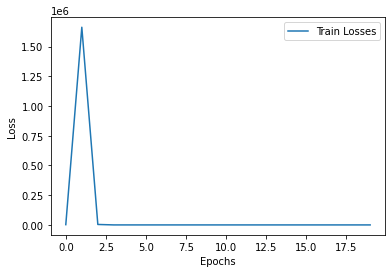

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1834.0771484
Epoch: 001, LR: 0.010000, Train Loss: 2389762.5000000
Epoch: 002, LR: 0.010000, Train Loss: 8038.4042969
Epoch: 003, LR: 0.010000, Train Loss: 712.8135986
Epoch: 004, LR: 0.010000, Train Loss: 284.6202393
Epoch: 005, LR: 0.010000, Train Loss: 373.0083313
Epoch: 006, LR: 0.010000, Train Loss: 185.3584137
Epoch: 007, LR: 0.010000, Train Loss: 195.7558441
Epoch: 008, LR: 0.010000, Train Loss: 154.8645935
Epoch: 009, LR: 0.010000, Train Loss: 109.8354034
Epoch: 010, LR: 0.010000, Train Loss: 153.4995880
Epoch: 011, LR: 0.010000, Train Loss: 44.5204964
Epoch: 012, LR: 0.010000, Train Loss: 129.2401123
Epoch: 013, LR: 0.010000, Train Loss: 29.7158928
Epoch: 014, LR: 0.010000, Train Loss: 110.3564377
Epoch: 015, LR: 0.010000, Train Loss: 17.5566368
Epoch: 016, LR: 0.010000, Train Loss: 77.8099670
Epoch: 017, LR: 0.010000, Train Loss: 12.6803303
Epoch: 018, LR: 0.010000, Train Loss: 

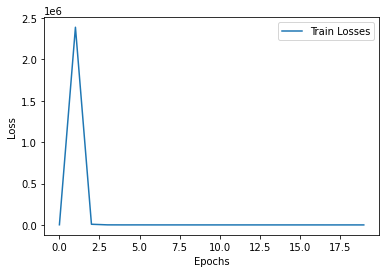

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1806.5693359
Epoch: 001, LR: 0.010000, Train Loss: 3634130.5000000
Epoch: 002, LR: 0.010000, Train Loss: 11045.2773438
Epoch: 003, LR: 0.010000, Train Loss: 2.5226519
Epoch: 004, LR: 0.010000, Train Loss: 1.0020556
Epoch: 005, LR: 0.010000, Train Loss: 1.0011191
Epoch: 006, LR: 0.010000, Train Loss: 0.9994236
Epoch: 007, LR: 0.010000, Train Loss: 0.9966298
Epoch: 008, LR: 0.010000, Train Loss: 0.9925854
Epoch: 009, LR: 0.010000, Train Loss: 0.9871516
Epoch: 010, LR: 0.010000, Train Loss: 0.9801896
Epoch: 011, LR: 0.010000, Train Loss: 0.9715643
Epoch: 012, LR: 0.010000, Train Loss: 0.9611543
Epoch: 013, LR: 0.010000, Train Loss: 0.9488788
Epoch: 014, LR: 0.010000, Train Loss: 0.9346985
Epoch: 015, LR: 0.010000, Train Loss: 0.9186042
Epoch: 016, LR: 0.010000, Train Loss: 0.9005942
Epoch: 017, LR: 0.010000, Train Loss: 0.8807386
Epoch: 018, LR: 0.010000, Train Loss: 0.8591459
Epoch: 019, LR

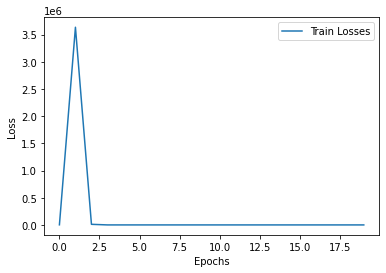

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1890.7415771
Epoch: 001, LR: 0.010000, Train Loss: 4731514.0000000
Epoch: 002, LR: 0.010000, Train Loss: 7796.0136719
Epoch: 003, LR: 0.010000, Train Loss: 1.7980095
Epoch: 004, LR: 0.010000, Train Loss: 1.1774356
Epoch: 005, LR: 0.010000, Train Loss: 1.1752855
Epoch: 006, LR: 0.010000, Train Loss: 1.1723974
Epoch: 007, LR: 0.010000, Train Loss: 1.1684124
Epoch: 008, LR: 0.010000, Train Loss: 1.1630204
Epoch: 009, LR: 0.010000, Train Loss: 1.1558586
Epoch: 010, LR: 0.010000, Train Loss: 1.1467712
Epoch: 011, LR: 0.010000, Train Loss: 1.1355764
Epoch: 012, LR: 0.010000, Train Loss: 1.1220915
Epoch: 013, LR: 0.010000, Train Loss: 1.1060333
Epoch: 014, LR: 0.010000, Train Loss: 1.0874151
Epoch: 015, LR: 0.010000, Train Loss: 1.0662042
Epoch: 016, LR: 0.010000, Train Loss: 1.0424323
Epoch: 017, LR: 0.010000, Train Loss: 1.0161895
Epoch: 018, LR: 0.010000, Train Loss: 0.9876364
Epoch: 019, LR:

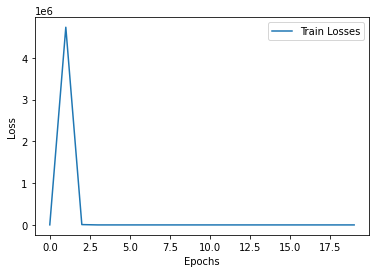

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2473.2817383
Epoch: 001, LR: 0.010000, Train Loss: 4684026.0000000
Epoch: 002, LR: 0.010000, Train Loss: 11604.5693359
Epoch: 003, LR: 0.010000, Train Loss: 1.5478315
Epoch: 004, LR: 0.010000, Train Loss: 1.0150642
Epoch: 005, LR: 0.010000, Train Loss: 1.0138909
Epoch: 006, LR: 0.010000, Train Loss: 1.0121518
Epoch: 007, LR: 0.010000, Train Loss: 1.0094432
Epoch: 008, LR: 0.010000, Train Loss: 1.0055759
Epoch: 009, LR: 0.010000, Train Loss: 1.0003697
Epoch: 010, LR: 0.010000, Train Loss: 0.9936325
Epoch: 011, LR: 0.010000, Train Loss: 0.9852204
Epoch: 012, LR: 0.010000, Train Loss: 0.9750217
Epoch: 013, LR: 0.010000, Train Loss: 0.9629452
Epoch: 014, LR: 0.010000, Train Loss: 0.9489334
Epoch: 015, LR: 0.010000, Train Loss: 0.9329235
Epoch: 016, LR: 0.010000, Train Loss: 0.9149085
Epoch: 017, LR: 0.010000, Train Loss: 0.8949186
Epoch: 018, LR: 0.010000, Train Loss: 0.8730288
Epoch: 019, LR

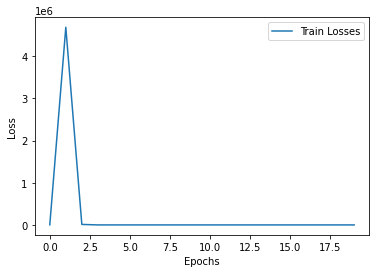

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1679.1220703
Epoch: 001, LR: 0.010000, Train Loss: 2888620.0000000
Epoch: 002, LR: 0.010000, Train Loss: 7875.5151367
Epoch: 003, LR: 0.010000, Train Loss: 8.4282846
Epoch: 004, LR: 0.010000, Train Loss: 0.6098730
Epoch: 005, LR: 0.010000, Train Loss: 0.6084162
Epoch: 006, LR: 0.010000, Train Loss: 0.6079590
Epoch: 007, LR: 0.010000, Train Loss: 0.6067132
Epoch: 008, LR: 0.010000, Train Loss: 0.6044945
Epoch: 009, LR: 0.010000, Train Loss: 0.6011662
Epoch: 010, LR: 0.010000, Train Loss: 0.5965661
Epoch: 011, LR: 0.010000, Train Loss: 0.5906335
Epoch: 012, LR: 0.010000, Train Loss: 0.5832543
Epoch: 013, LR: 0.010000, Train Loss: 0.5743906
Epoch: 014, LR: 0.010000, Train Loss: 0.5640211
Epoch: 015, LR: 0.010000, Train Loss: 0.5521442
Epoch: 016, LR: 0.010000, Train Loss: 0.5388037
Epoch: 017, LR: 0.010000, Train Loss: 0.5240819
Epoch: 018, LR: 0.010000, Train Loss: 0.5081082
Epoch: 019, LR:

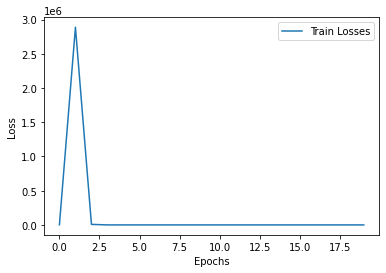

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1820.2301025
Epoch: 001, LR: 0.010000, Train Loss: 3118222.0000000
Epoch: 002, LR: 0.010000, Train Loss: 16962.3183594
Epoch: 003, LR: 0.010000, Train Loss: 1.1174474
Epoch: 004, LR: 0.010000, Train Loss: 0.9079219
Epoch: 005, LR: 0.010000, Train Loss: 0.9065582
Epoch: 006, LR: 0.010000, Train Loss: 0.9046254
Epoch: 007, LR: 0.010000, Train Loss: 0.9018432
Epoch: 008, LR: 0.010000, Train Loss: 0.8980836
Epoch: 009, LR: 0.010000, Train Loss: 0.8932158
Epoch: 010, LR: 0.010000, Train Loss: 0.8871006
Epoch: 011, LR: 0.010000, Train Loss: 0.8796154
Epoch: 012, LR: 0.010000, Train Loss: 0.8706542
Epoch: 013, LR: 0.010000, Train Loss: 0.8601317
Epoch: 014, LR: 0.010000, Train Loss: 0.8479813
Epoch: 015, LR: 0.010000, Train Loss: 0.8341601
Epoch: 016, LR: 0.010000, Train Loss: 0.8186554
Epoch: 017, LR: 0.010000, Train Loss: 0.8014922
Epoch: 018, LR: 0.010000, Train Loss: 0.7827342
Epoch: 019, LR

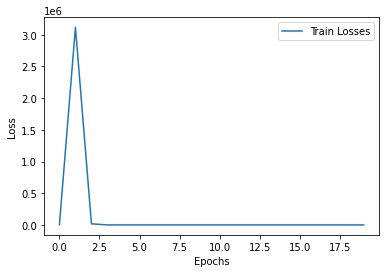

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2419.7282715
Epoch: 001, LR: 0.010000, Train Loss: 1397274.8750000
Epoch: 002, LR: 0.010000, Train Loss: 7809.6259766
Epoch: 003, LR: 0.010000, Train Loss: 1.4790184
Epoch: 004, LR: 0.010000, Train Loss: 1.0657854
Epoch: 005, LR: 0.010000, Train Loss: 1.0648758
Epoch: 006, LR: 0.010000, Train Loss: 1.0625836
Epoch: 007, LR: 0.010000, Train Loss: 1.0586804
Epoch: 008, LR: 0.010000, Train Loss: 1.0529581
Epoch: 009, LR: 0.010000, Train Loss: 1.0452222
Epoch: 010, LR: 0.010000, Train Loss: 1.0352950
Epoch: 011, LR: 0.010000, Train Loss: 1.0230236
Epoch: 012, LR: 0.010000, Train Loss: 1.0083457
Epoch: 013, LR: 0.010000, Train Loss: 0.9911726
Epoch: 014, LR: 0.010000, Train Loss: 0.9714549
Epoch: 015, LR: 0.010000, Train Loss: 0.9491947
Epoch: 016, LR: 0.010000, Train Loss: 0.9244484
Epoch: 017, LR: 0.010000, Train Loss: 0.8973383
Epoch: 018, LR: 0.010000, Train Loss: 0.8680667
Epoch: 019, LR:

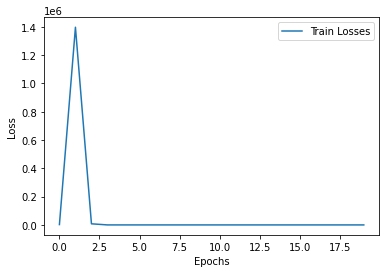

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2333.7209473
Epoch: 001, LR: 0.010000, Train Loss: 2589199.5000000
Epoch: 002, LR: 0.010000, Train Loss: 10056.8447266
Epoch: 003, LR: 0.010000, Train Loss: 263.1656189
Epoch: 004, LR: 0.010000, Train Loss: 18.5445271
Epoch: 005, LR: 0.010000, Train Loss: 4.8021836
Epoch: 006, LR: 0.010000, Train Loss: 1.0244899
Epoch: 007, LR: 0.010000, Train Loss: 0.9777839
Epoch: 008, LR: 0.010000, Train Loss: 0.9774053
Epoch: 009, LR: 0.010000, Train Loss: 0.9765577
Epoch: 010, LR: 0.010000, Train Loss: 0.9751894
Epoch: 011, LR: 0.010000, Train Loss: 0.9731405
Epoch: 012, LR: 0.010000, Train Loss: 0.9703144
Epoch: 013, LR: 0.010000, Train Loss: 0.9666396
Epoch: 014, LR: 0.010000, Train Loss: 0.9620399
Epoch: 015, LR: 0.010000, Train Loss: 0.9564304
Epoch: 016, LR: 0.010000, Train Loss: 0.9497513
Epoch: 017, LR: 0.010000, Train Loss: 0.9419519
Epoch: 018, LR: 0.010000, Train Loss: 0.9329941
Epoch: 019,

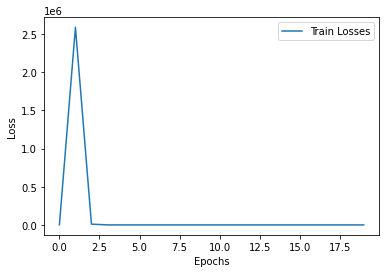

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1624.8002930
Epoch: 001, LR: 0.010000, Train Loss: 1677890.3750000
Epoch: 002, LR: 0.010000, Train Loss: 4319.3374023
Epoch: 003, LR: 0.010000, Train Loss: 4.7720847
Epoch: 004, LR: 0.010000, Train Loss: 1.1220784
Epoch: 005, LR: 0.010000, Train Loss: 1.1199161
Epoch: 006, LR: 0.010000, Train Loss: 1.1160852
Epoch: 007, LR: 0.010000, Train Loss: 1.1103624
Epoch: 008, LR: 0.010000, Train Loss: 1.1025461
Epoch: 009, LR: 0.010000, Train Loss: 1.0924459
Epoch: 010, LR: 0.010000, Train Loss: 1.0798124
Epoch: 011, LR: 0.010000, Train Loss: 1.0645610
Epoch: 012, LR: 0.010000, Train Loss: 1.0466373
Epoch: 013, LR: 0.010000, Train Loss: 1.0260020
Epoch: 014, LR: 0.010000, Train Loss: 1.0026916
Epoch: 015, LR: 0.010000, Train Loss: 0.9768093
Epoch: 016, LR: 0.010000, Train Loss: 0.9485267
Epoch: 017, LR: 0.010000, Train Loss: 0.9181021
Epoch: 018, LR: 0.010000, Train Loss: 0.8858824
Epoch: 019, LR:

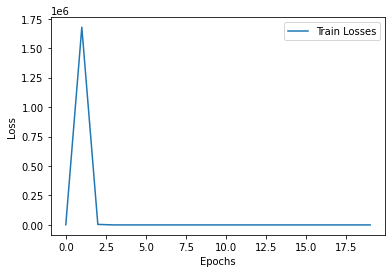

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2361.3662109
Epoch: 001, LR: 0.010000, Train Loss: 2229761.5000000
Epoch: 002, LR: 0.010000, Train Loss: 23255.5039062
Epoch: 003, LR: 0.010000, Train Loss: 1824.9587402
Epoch: 004, LR: 0.010000, Train Loss: 470.3996277
Epoch: 005, LR: 0.010000, Train Loss: 671.2825928
Epoch: 006, LR: 0.010000, Train Loss: 276.3460693
Epoch: 007, LR: 0.010000, Train Loss: 223.0231018
Epoch: 008, LR: 0.010000, Train Loss: 251.1260223
Epoch: 009, LR: 0.010000, Train Loss: 109.6939163
Epoch: 010, LR: 0.010000, Train Loss: 60.0536613
Epoch: 011, LR: 0.010000, Train Loss: 62.7411232
Epoch: 012, LR: 0.010000, Train Loss: 45.1501236
Epoch: 013, LR: 0.010000, Train Loss: 27.8021202
Epoch: 014, LR: 0.010000, Train Loss: 17.6315231
Epoch: 015, LR: 0.010000, Train Loss: 11.1816387
Epoch: 016, LR: 0.010000, Train Loss: 7.1219206
Epoch: 017, LR: 0.010000, Train Loss: 5.0038376
Epoch: 018, LR: 0.010000, Train Loss: 4.0

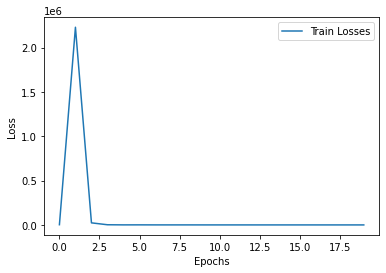

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1578.7171631
Epoch: 001, LR: 0.010000, Train Loss: 3532185.0000000
Epoch: 002, LR: 0.010000, Train Loss: 4008.5683594
Epoch: 003, LR: 0.010000, Train Loss: 1.0230004
Epoch: 004, LR: 0.010000, Train Loss: 0.9269482
Epoch: 005, LR: 0.010000, Train Loss: 0.9246960
Epoch: 006, LR: 0.010000, Train Loss: 0.9213076
Epoch: 007, LR: 0.010000, Train Loss: 0.9164739
Epoch: 008, LR: 0.010000, Train Loss: 0.9099208
Epoch: 009, LR: 0.010000, Train Loss: 0.9014370
Epoch: 010, LR: 0.010000, Train Loss: 0.8908020
Epoch: 011, LR: 0.010000, Train Loss: 0.8779132
Epoch: 012, LR: 0.010000, Train Loss: 0.8625796
Epoch: 013, LR: 0.010000, Train Loss: 0.8447993
Epoch: 014, LR: 0.010000, Train Loss: 0.8245955
Epoch: 015, LR: 0.010000, Train Loss: 0.8020505
Epoch: 016, LR: 0.010000, Train Loss: 0.7773280
Epoch: 017, LR: 0.010000, Train Loss: 0.7506838
Epoch: 018, LR: 0.010000, Train Loss: 0.7224735
Epoch: 019, LR:

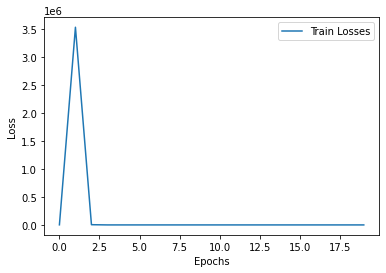

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2508.0363770
Epoch: 001, LR: 0.010000, Train Loss: 2540572.5000000
Epoch: 002, LR: 0.010000, Train Loss: 7299.8242188
Epoch: 003, LR: 0.010000, Train Loss: 1.2922550
Epoch: 004, LR: 0.010000, Train Loss: 1.1841676
Epoch: 005, LR: 0.010000, Train Loss: 1.1839622
Epoch: 006, LR: 0.010000, Train Loss: 1.1819315
Epoch: 007, LR: 0.010000, Train Loss: 1.1780593
Epoch: 008, LR: 0.010000, Train Loss: 1.1721599
Epoch: 009, LR: 0.010000, Train Loss: 1.1640606
Epoch: 010, LR: 0.010000, Train Loss: 1.1535779
Epoch: 011, LR: 0.010000, Train Loss: 1.1405649
Epoch: 012, LR: 0.010000, Train Loss: 1.1249331
Epoch: 013, LR: 0.010000, Train Loss: 1.1066401
Epoch: 014, LR: 0.010000, Train Loss: 1.0856558
Epoch: 015, LR: 0.010000, Train Loss: 1.0620172
Epoch: 016, LR: 0.010000, Train Loss: 1.0358021
Epoch: 017, LR: 0.010000, Train Loss: 1.0071659
Epoch: 018, LR: 0.010000, Train Loss: 0.9763547
Epoch: 019, LR:

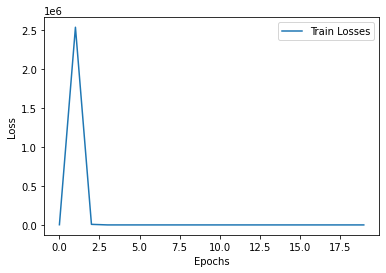

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1297.6403809
Epoch: 001, LR: 0.010000, Train Loss: 2563211.0000000
Epoch: 002, LR: 0.010000, Train Loss: 5306.1713867
Epoch: 003, LR: 0.010000, Train Loss: 2.2288868
Epoch: 004, LR: 0.010000, Train Loss: 0.8483492
Epoch: 005, LR: 0.010000, Train Loss: 0.8467502
Epoch: 006, LR: 0.010000, Train Loss: 0.8449961
Epoch: 007, LR: 0.010000, Train Loss: 0.8427431
Epoch: 008, LR: 0.010000, Train Loss: 0.8398153
Epoch: 009, LR: 0.010000, Train Loss: 0.8360788
Epoch: 010, LR: 0.010000, Train Loss: 0.8314633
Epoch: 011, LR: 0.010000, Train Loss: 0.8258371
Epoch: 012, LR: 0.010000, Train Loss: 0.8190918
Epoch: 013, LR: 0.010000, Train Loss: 0.8111492
Epoch: 014, LR: 0.010000, Train Loss: 0.8019536
Epoch: 015, LR: 0.010000, Train Loss: 0.7914492
Epoch: 016, LR: 0.010000, Train Loss: 0.7795995
Epoch: 017, LR: 0.010000, Train Loss: 0.7663899
Epoch: 018, LR: 0.010000, Train Loss: 0.7518355
Epoch: 019, LR:

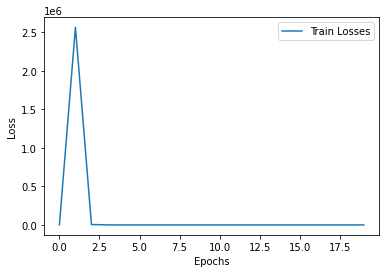

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2094.1799316
Epoch: 001, LR: 0.010000, Train Loss: 3261792.5000000
Epoch: 002, LR: 0.010000, Train Loss: 5957.2299805
Epoch: 003, LR: 0.010000, Train Loss: 5.1332312
Epoch: 004, LR: 0.010000, Train Loss: 0.6003888
Epoch: 005, LR: 0.010000, Train Loss: 0.5997582
Epoch: 006, LR: 0.010000, Train Loss: 0.5991960
Epoch: 007, LR: 0.010000, Train Loss: 0.5985702
Epoch: 008, LR: 0.010000, Train Loss: 0.5978047
Epoch: 009, LR: 0.010000, Train Loss: 0.5967835
Epoch: 010, LR: 0.010000, Train Loss: 0.5954675
Epoch: 011, LR: 0.010000, Train Loss: 0.5938253
Epoch: 012, LR: 0.010000, Train Loss: 0.5918154
Epoch: 013, LR: 0.010000, Train Loss: 0.5894005
Epoch: 014, LR: 0.010000, Train Loss: 0.5865571
Epoch: 015, LR: 0.010000, Train Loss: 0.5832574
Epoch: 016, LR: 0.010000, Train Loss: 0.5794759
Epoch: 017, LR: 0.010000, Train Loss: 0.5751877
Epoch: 018, LR: 0.010000, Train Loss: 0.5703793
Epoch: 019, LR:

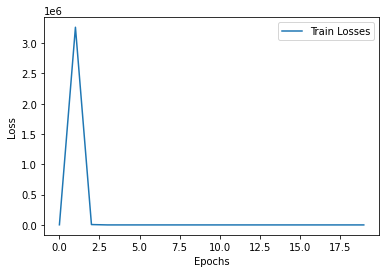

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1222.3160400
Epoch: 001, LR: 0.010000, Train Loss: 3421571.0000000
Epoch: 002, LR: 0.010000, Train Loss: 5897.5141602
Epoch: 003, LR: 0.010000, Train Loss: 1.1254411
Epoch: 004, LR: 0.010000, Train Loss: 1.0378354
Epoch: 005, LR: 0.010000, Train Loss: 1.0363469
Epoch: 006, LR: 0.010000, Train Loss: 1.0335964
Epoch: 007, LR: 0.010000, Train Loss: 1.0292464
Epoch: 008, LR: 0.010000, Train Loss: 1.0230836
Epoch: 009, LR: 0.010000, Train Loss: 1.0149338
Epoch: 010, LR: 0.010000, Train Loss: 1.0046402
Epoch: 011, LR: 0.010000, Train Loss: 0.9920306
Epoch: 012, LR: 0.010000, Train Loss: 0.9770134
Epoch: 013, LR: 0.010000, Train Loss: 0.9595456
Epoch: 014, LR: 0.010000, Train Loss: 0.9396478
Epoch: 015, LR: 0.010000, Train Loss: 0.9173566
Epoch: 016, LR: 0.010000, Train Loss: 0.8927819
Epoch: 017, LR: 0.010000, Train Loss: 0.8661082
Epoch: 018, LR: 0.010000, Train Loss: 0.8375806
Epoch: 019, LR:

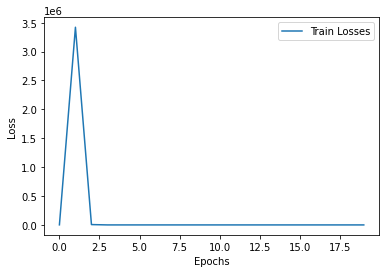

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1715.0103760
Epoch: 001, LR: 0.010000, Train Loss: 1514634.1250000
Epoch: 002, LR: 0.010000, Train Loss: 10073.1494141
Epoch: 003, LR: 0.010000, Train Loss: 1965.0551758
Epoch: 004, LR: 0.010000, Train Loss: 91.9826050
Epoch: 005, LR: 0.010000, Train Loss: 34.5150528
Epoch: 006, LR: 0.010000, Train Loss: 5.2815962
Epoch: 007, LR: 0.010000, Train Loss: 0.8872746
Epoch: 008, LR: 0.010000, Train Loss: 0.8466215
Epoch: 009, LR: 0.010000, Train Loss: 0.8460581
Epoch: 010, LR: 0.010000, Train Loss: 0.8454866
Epoch: 011, LR: 0.010000, Train Loss: 0.8444817
Epoch: 012, LR: 0.010000, Train Loss: 0.8429184
Epoch: 013, LR: 0.010000, Train Loss: 0.8406500
Epoch: 014, LR: 0.010000, Train Loss: 0.8375199
Epoch: 015, LR: 0.010000, Train Loss: 0.8334587
Epoch: 016, LR: 0.010000, Train Loss: 0.8283707
Epoch: 017, LR: 0.010000, Train Loss: 0.8221696
Epoch: 018, LR: 0.010000, Train Loss: 0.8147750
Epoch: 01

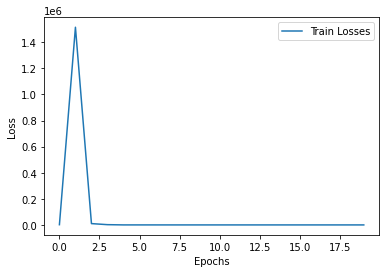

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1948.3480225
Epoch: 001, LR: 0.010000, Train Loss: 2622370.5000000
Epoch: 002, LR: 0.010000, Train Loss: 8490.5156250
Epoch: 003, LR: 0.010000, Train Loss: 1.4122006
Epoch: 004, LR: 0.010000, Train Loss: 1.1056046
Epoch: 005, LR: 0.010000, Train Loss: 1.1036856
Epoch: 006, LR: 0.010000, Train Loss: 1.1013536
Epoch: 007, LR: 0.010000, Train Loss: 1.0981740
Epoch: 008, LR: 0.010000, Train Loss: 1.0938673
Epoch: 009, LR: 0.010000, Train Loss: 1.0881877
Epoch: 010, LR: 0.010000, Train Loss: 1.0809619
Epoch: 011, LR: 0.010000, Train Loss: 1.0720056
Epoch: 012, LR: 0.010000, Train Loss: 1.0611784
Epoch: 013, LR: 0.010000, Train Loss: 1.0483050
Epoch: 014, LR: 0.010000, Train Loss: 1.0332979
Epoch: 015, LR: 0.010000, Train Loss: 1.0160987
Epoch: 016, LR: 0.010000, Train Loss: 0.9966458
Epoch: 017, LR: 0.010000, Train Loss: 0.9749638
Epoch: 018, LR: 0.010000, Train Loss: 0.9511191
Epoch: 019, LR:

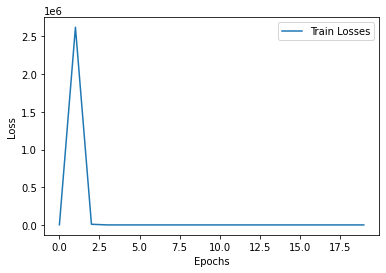

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1369.3883057
Epoch: 001, LR: 0.010000, Train Loss: 3344101.2500000
Epoch: 002, LR: 0.010000, Train Loss: 12115.0429688
Epoch: 003, LR: 0.010000, Train Loss: 1.2736447
Epoch: 004, LR: 0.010000, Train Loss: 1.0866152
Epoch: 005, LR: 0.010000, Train Loss: 1.0850596
Epoch: 006, LR: 0.010000, Train Loss: 1.0822188
Epoch: 007, LR: 0.010000, Train Loss: 1.0776887
Epoch: 008, LR: 0.010000, Train Loss: 1.0711422
Epoch: 009, LR: 0.010000, Train Loss: 1.0622900
Epoch: 010, LR: 0.010000, Train Loss: 1.0508817
Epoch: 011, LR: 0.010000, Train Loss: 1.0366930
Epoch: 012, LR: 0.010000, Train Loss: 1.0195880
Epoch: 013, LR: 0.010000, Train Loss: 0.9994385
Epoch: 014, LR: 0.010000, Train Loss: 0.9762069
Epoch: 015, LR: 0.010000, Train Loss: 0.9499483
Epoch: 016, LR: 0.010000, Train Loss: 0.9208063
Epoch: 017, LR: 0.010000, Train Loss: 0.8890193
Epoch: 018, LR: 0.010000, Train Loss: 0.8549361
Epoch: 019, LR

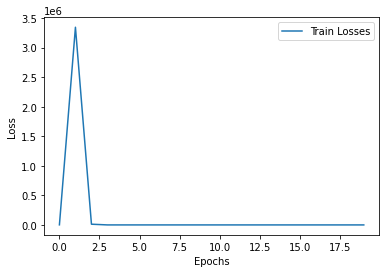

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2058.1457520
Epoch: 001, LR: 0.010000, Train Loss: 7643602.5000000
Epoch: 002, LR: 0.010000, Train Loss: 6091.4174805
Epoch: 003, LR: 0.010000, Train Loss: 4.6536827
Epoch: 004, LR: 0.010000, Train Loss: 1.0711006
Epoch: 005, LR: 0.010000, Train Loss: 1.0695302
Epoch: 006, LR: 0.010000, Train Loss: 1.0672139
Epoch: 007, LR: 0.010000, Train Loss: 1.0636022
Epoch: 008, LR: 0.010000, Train Loss: 1.0582507
Epoch: 009, LR: 0.010000, Train Loss: 1.0507765
Epoch: 010, LR: 0.010000, Train Loss: 1.0409207
Epoch: 011, LR: 0.010000, Train Loss: 1.0284824
Epoch: 012, LR: 0.010000, Train Loss: 1.0133125
Epoch: 013, LR: 0.010000, Train Loss: 0.9953161
Epoch: 014, LR: 0.010000, Train Loss: 0.9745100
Epoch: 015, LR: 0.010000, Train Loss: 0.9509526
Epoch: 016, LR: 0.010000, Train Loss: 0.9247921
Epoch: 017, LR: 0.010000, Train Loss: 0.8962772
Epoch: 018, LR: 0.010000, Train Loss: 0.8657535
Epoch: 019, LR:

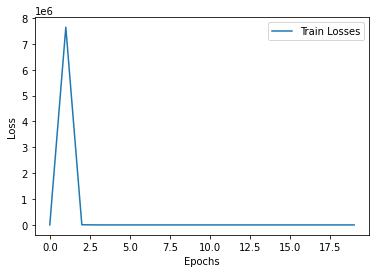

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1004.4796753
Epoch: 001, LR: 0.010000, Train Loss: 1920937.6250000
Epoch: 002, LR: 0.010000, Train Loss: 12071.4316406
Epoch: 003, LR: 0.010000, Train Loss: 627.8489990
Epoch: 004, LR: 0.010000, Train Loss: 19.0727940
Epoch: 005, LR: 0.010000, Train Loss: 5.6962538
Epoch: 006, LR: 0.010000, Train Loss: 1.0293412
Epoch: 007, LR: 0.010000, Train Loss: 1.0270201
Epoch: 008, LR: 0.010000, Train Loss: 1.0256010
Epoch: 009, LR: 0.010000, Train Loss: 1.0235589
Epoch: 010, LR: 0.010000, Train Loss: 1.0208063
Epoch: 011, LR: 0.010000, Train Loss: 1.0172230
Epoch: 012, LR: 0.010000, Train Loss: 1.0126885
Epoch: 013, LR: 0.010000, Train Loss: 1.0071416
Epoch: 014, LR: 0.010000, Train Loss: 1.0005249
Epoch: 015, LR: 0.010000, Train Loss: 0.9928005
Epoch: 016, LR: 0.010000, Train Loss: 0.9839244
Epoch: 017, LR: 0.010000, Train Loss: 0.9738751
Epoch: 018, LR: 0.010000, Train Loss: 0.9626411
Epoch: 019,

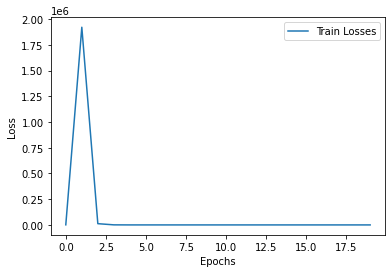

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2834.0043945
Epoch: 001, LR: 0.010000, Train Loss: 1926160.5000000
Epoch: 002, LR: 0.010000, Train Loss: 18596.6796875
Epoch: 003, LR: 0.010000, Train Loss: 1684.6743164
Epoch: 004, LR: 0.010000, Train Loss: 282.5464783
Epoch: 005, LR: 0.010000, Train Loss: 725.4740601
Epoch: 006, LR: 0.010000, Train Loss: 465.9358215
Epoch: 007, LR: 0.010000, Train Loss: 140.0419159
Epoch: 008, LR: 0.010000, Train Loss: 338.8198547
Epoch: 009, LR: 0.010000, Train Loss: 163.7372589
Epoch: 010, LR: 0.010000, Train Loss: 49.8608742
Epoch: 011, LR: 0.010000, Train Loss: 126.0539322
Epoch: 012, LR: 0.010000, Train Loss: 85.9238586
Epoch: 013, LR: 0.010000, Train Loss: 36.7915916
Epoch: 014, LR: 0.010000, Train Loss: 103.3215790
Epoch: 015, LR: 0.010000, Train Loss: 28.2017517
Epoch: 016, LR: 0.010000, Train Loss: 51.0495071
Epoch: 017, LR: 0.010000, Train Loss: 58.8024368
Epoch: 018, LR: 0.010000, Train Loss:

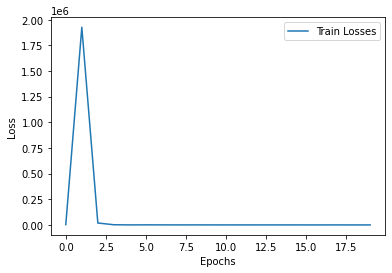

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2863.6945801
Epoch: 001, LR: 0.010000, Train Loss: 1861961.8750000
Epoch: 002, LR: 0.010000, Train Loss: 20081.7246094
Epoch: 003, LR: 0.010000, Train Loss: 707.3137817
Epoch: 004, LR: 0.010000, Train Loss: 125.7563629
Epoch: 005, LR: 0.010000, Train Loss: 71.0989914
Epoch: 006, LR: 0.010000, Train Loss: 39.3499908
Epoch: 007, LR: 0.010000, Train Loss: 26.6564980
Epoch: 008, LR: 0.010000, Train Loss: 17.4591064
Epoch: 009, LR: 0.010000, Train Loss: 9.1491566
Epoch: 010, LR: 0.010000, Train Loss: 7.7714868
Epoch: 011, LR: 0.010000, Train Loss: 6.3740335
Epoch: 012, LR: 0.010000, Train Loss: 4.9773088
Epoch: 013, LR: 0.010000, Train Loss: 3.5135067
Epoch: 014, LR: 0.010000, Train Loss: 3.5846653
Epoch: 015, LR: 0.010000, Train Loss: 2.1626194
Epoch: 016, LR: 0.010000, Train Loss: 1.7211783
Epoch: 017, LR: 0.010000, Train Loss: 1.6558796
Epoch: 018, LR: 0.010000, Train Loss: 1.4873085
Epoch:

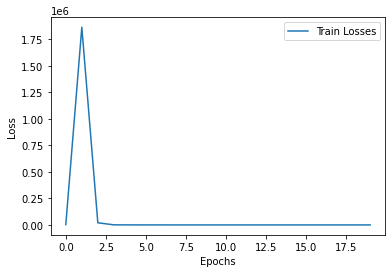

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2283.3564453
Epoch: 001, LR: 0.010000, Train Loss: 1738751.2500000
Epoch: 002, LR: 0.010000, Train Loss: 4619.7993164
Epoch: 003, LR: 0.010000, Train Loss: 1.0748844
Epoch: 004, LR: 0.010000, Train Loss: 1.0361919
Epoch: 005, LR: 0.010000, Train Loss: 1.0341996
Epoch: 006, LR: 0.010000, Train Loss: 1.0306611
Epoch: 007, LR: 0.010000, Train Loss: 1.0254426
Epoch: 008, LR: 0.010000, Train Loss: 1.0183536
Epoch: 009, LR: 0.010000, Train Loss: 1.0092586
Epoch: 010, LR: 0.010000, Train Loss: 0.9978536
Epoch: 011, LR: 0.010000, Train Loss: 0.9840317
Epoch: 012, LR: 0.010000, Train Loss: 0.9675894
Epoch: 013, LR: 0.010000, Train Loss: 0.9485618
Epoch: 014, LR: 0.010000, Train Loss: 0.9270043
Epoch: 015, LR: 0.010000, Train Loss: 0.9030133
Epoch: 016, LR: 0.010000, Train Loss: 0.8767578
Epoch: 017, LR: 0.010000, Train Loss: 0.8484803
Epoch: 018, LR: 0.010000, Train Loss: 0.8185139
Epoch: 019, LR:

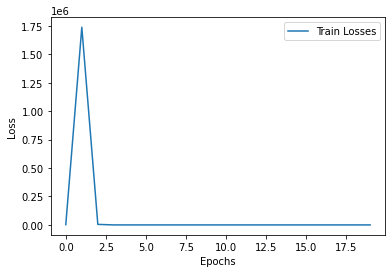

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1426.2536621
Epoch: 001, LR: 0.010000, Train Loss: 2312660.0000000
Epoch: 002, LR: 0.010000, Train Loss: 9354.6757812
Epoch: 003, LR: 0.010000, Train Loss: 1.2774206
Epoch: 004, LR: 0.010000, Train Loss: 1.0478938
Epoch: 005, LR: 0.010000, Train Loss: 1.0456976
Epoch: 006, LR: 0.010000, Train Loss: 1.0431656
Epoch: 007, LR: 0.010000, Train Loss: 1.0400438
Epoch: 008, LR: 0.010000, Train Loss: 1.0361862
Epoch: 009, LR: 0.010000, Train Loss: 1.0313587
Epoch: 010, LR: 0.010000, Train Loss: 1.0254457
Epoch: 011, LR: 0.010000, Train Loss: 1.0183363
Epoch: 012, LR: 0.010000, Train Loss: 1.0099642
Epoch: 013, LR: 0.010000, Train Loss: 1.0001911
Epoch: 014, LR: 0.010000, Train Loss: 0.9889939
Epoch: 015, LR: 0.010000, Train Loss: 0.9763167
Epoch: 016, LR: 0.010000, Train Loss: 0.9621275
Epoch: 017, LR: 0.010000, Train Loss: 0.9463949
Epoch: 018, LR: 0.010000, Train Loss: 0.9291151
Epoch: 019, LR:

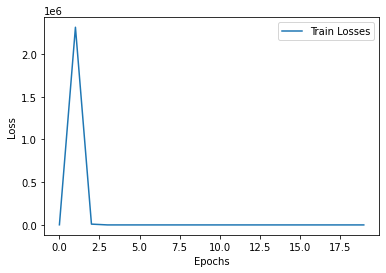

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1940.1926270
Epoch: 001, LR: 0.010000, Train Loss: 1726636.7500000
Epoch: 002, LR: 0.010000, Train Loss: 4916.3735352
Epoch: 003, LR: 0.010000, Train Loss: 893.3978882
Epoch: 004, LR: 0.010000, Train Loss: 284.8522339
Epoch: 005, LR: 0.010000, Train Loss: 410.6466980
Epoch: 006, LR: 0.010000, Train Loss: 75.5860062
Epoch: 007, LR: 0.010000, Train Loss: 231.9074402
Epoch: 008, LR: 0.010000, Train Loss: 75.1998749
Epoch: 009, LR: 0.010000, Train Loss: 47.6096916
Epoch: 010, LR: 0.010000, Train Loss: 69.6055908
Epoch: 011, LR: 0.010000, Train Loss: 37.1393471
Epoch: 012, LR: 0.010000, Train Loss: 9.2027035
Epoch: 013, LR: 0.010000, Train Loss: 30.2258759
Epoch: 014, LR: 0.010000, Train Loss: 37.3683853
Epoch: 015, LR: 0.010000, Train Loss: 17.2690182
Epoch: 016, LR: 0.010000, Train Loss: 6.0115013
Epoch: 017, LR: 0.010000, Train Loss: 9.7907438
Epoch: 018, LR: 0.010000, Train Loss: 12.735305

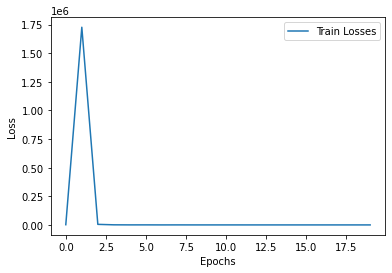

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2675.5749512
Epoch: 001, LR: 0.010000, Train Loss: 2037898.8750000
Epoch: 002, LR: 0.010000, Train Loss: 4803.4394531
Epoch: 003, LR: 0.010000, Train Loss: 3.7909434
Epoch: 004, LR: 0.010000, Train Loss: 0.9364271
Epoch: 005, LR: 0.010000, Train Loss: 0.9353606
Epoch: 006, LR: 0.010000, Train Loss: 0.9340793
Epoch: 007, LR: 0.010000, Train Loss: 0.9323581
Epoch: 008, LR: 0.010000, Train Loss: 0.9300433
Epoch: 009, LR: 0.010000, Train Loss: 0.9269513
Epoch: 010, LR: 0.010000, Train Loss: 0.9229194
Epoch: 011, LR: 0.010000, Train Loss: 0.9178379
Epoch: 012, LR: 0.010000, Train Loss: 0.9115617
Epoch: 013, LR: 0.010000, Train Loss: 0.9039716
Epoch: 014, LR: 0.010000, Train Loss: 0.8949770
Epoch: 015, LR: 0.010000, Train Loss: 0.8844928
Epoch: 016, LR: 0.010000, Train Loss: 0.8724561
Epoch: 017, LR: 0.010000, Train Loss: 0.8588275
Epoch: 018, LR: 0.010000, Train Loss: 0.8435970
Epoch: 019, LR:

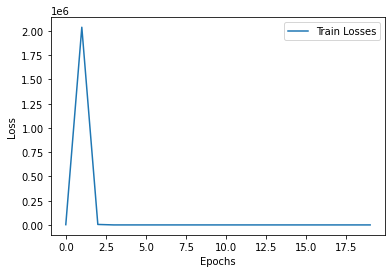

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2458.2441406
Epoch: 001, LR: 0.010000, Train Loss: 2307634.0000000
Epoch: 002, LR: 0.010000, Train Loss: 10653.3916016
Epoch: 003, LR: 0.010000, Train Loss: 1316.6403809
Epoch: 004, LR: 0.010000, Train Loss: 120.9521332
Epoch: 005, LR: 0.010000, Train Loss: 186.6888428
Epoch: 006, LR: 0.010000, Train Loss: 155.4576569
Epoch: 007, LR: 0.010000, Train Loss: 64.9368286
Epoch: 008, LR: 0.010000, Train Loss: 43.1731873
Epoch: 009, LR: 0.010000, Train Loss: 56.0919647
Epoch: 010, LR: 0.010000, Train Loss: 43.0222130
Epoch: 011, LR: 0.010000, Train Loss: 19.0259418
Epoch: 012, LR: 0.010000, Train Loss: 5.5173230
Epoch: 013, LR: 0.010000, Train Loss: 3.7535651
Epoch: 014, LR: 0.010000, Train Loss: 6.4021349
Epoch: 015, LR: 0.010000, Train Loss: 8.7394476
Epoch: 016, LR: 0.010000, Train Loss: 9.2796564
Epoch: 017, LR: 0.010000, Train Loss: 8.3316145
Epoch: 018, LR: 0.010000, Train Loss: 6.7449207


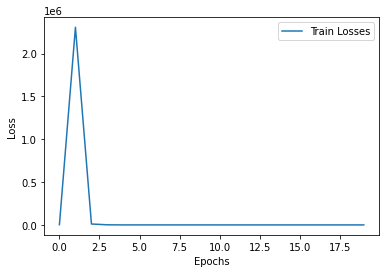

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2117.3500977
Epoch: 001, LR: 0.010000, Train Loss: 2551077.2500000
Epoch: 002, LR: 0.010000, Train Loss: 7726.5761719
Epoch: 003, LR: 0.010000, Train Loss: 4.3254161
Epoch: 004, LR: 0.010000, Train Loss: 1.2180144
Epoch: 005, LR: 0.010000, Train Loss: 1.2156107
Epoch: 006, LR: 0.010000, Train Loss: 1.2131077
Epoch: 007, LR: 0.010000, Train Loss: 1.2100326
Epoch: 008, LR: 0.010000, Train Loss: 1.2059977
Epoch: 009, LR: 0.010000, Train Loss: 1.2007295
Epoch: 010, LR: 0.010000, Train Loss: 1.1939962
Epoch: 011, LR: 0.010000, Train Loss: 1.1855834
Epoch: 012, LR: 0.010000, Train Loss: 1.1753315
Epoch: 013, LR: 0.010000, Train Loss: 1.1630591
Epoch: 014, LR: 0.010000, Train Loss: 1.1486202
Epoch: 015, LR: 0.010000, Train Loss: 1.1318798
Epoch: 016, LR: 0.010000, Train Loss: 1.1127676
Epoch: 017, LR: 0.010000, Train Loss: 1.0912319
Epoch: 018, LR: 0.010000, Train Loss: 1.0672510
Epoch: 019, LR:

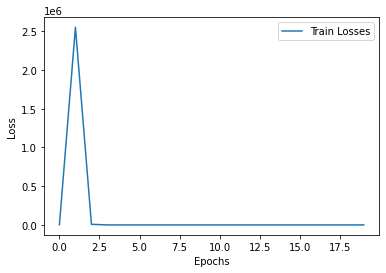

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1995.5834961
Epoch: 001, LR: 0.010000, Train Loss: 3822451.5000000
Epoch: 002, LR: 0.010000, Train Loss: 9987.9003906
Epoch: 003, LR: 0.010000, Train Loss: 1.3338147
Epoch: 004, LR: 0.010000, Train Loss: 1.0247405
Epoch: 005, LR: 0.010000, Train Loss: 1.0244266
Epoch: 006, LR: 0.010000, Train Loss: 1.0236217
Epoch: 007, LR: 0.010000, Train Loss: 1.0221498
Epoch: 008, LR: 0.010000, Train Loss: 1.0198539
Epoch: 009, LR: 0.010000, Train Loss: 1.0165645
Epoch: 010, LR: 0.010000, Train Loss: 1.0121652
Epoch: 011, LR: 0.010000, Train Loss: 1.0065478
Epoch: 012, LR: 0.010000, Train Loss: 0.9995413
Epoch: 013, LR: 0.010000, Train Loss: 0.9910476
Epoch: 014, LR: 0.010000, Train Loss: 0.9808913
Epoch: 015, LR: 0.010000, Train Loss: 0.9689867
Epoch: 016, LR: 0.010000, Train Loss: 0.9552585
Epoch: 017, LR: 0.010000, Train Loss: 0.9396374
Epoch: 018, LR: 0.010000, Train Loss: 0.9220883
Epoch: 019, LR:

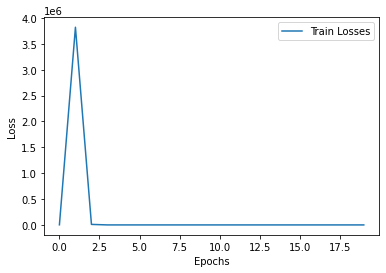

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1522.8360596
Epoch: 001, LR: 0.010000, Train Loss: 3975829.5000000
Epoch: 002, LR: 0.010000, Train Loss: 8360.3203125
Epoch: 003, LR: 0.010000, Train Loss: 620.7705078
Epoch: 004, LR: 0.010000, Train Loss: 143.7803802
Epoch: 005, LR: 0.010000, Train Loss: 284.0875549
Epoch: 006, LR: 0.010000, Train Loss: 223.9330139
Epoch: 007, LR: 0.010000, Train Loss: 111.9318695
Epoch: 008, LR: 0.010000, Train Loss: 121.8629074
Epoch: 009, LR: 0.010000, Train Loss: 72.2681656
Epoch: 010, LR: 0.010000, Train Loss: 27.7232914
Epoch: 011, LR: 0.010000, Train Loss: 23.2207336
Epoch: 012, LR: 0.010000, Train Loss: 23.0008469
Epoch: 013, LR: 0.010000, Train Loss: 15.5502071
Epoch: 014, LR: 0.010000, Train Loss: 11.2487993
Epoch: 015, LR: 0.010000, Train Loss: 13.3234739
Epoch: 016, LR: 0.010000, Train Loss: 11.2051067
Epoch: 017, LR: 0.010000, Train Loss: 7.6234560
Epoch: 018, LR: 0.010000, Train Loss: 5.544

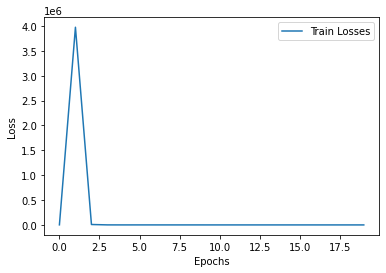

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2082.9116211
Epoch: 001, LR: 0.010000, Train Loss: 2505339.7500000
Epoch: 002, LR: 0.010000, Train Loss: 9480.8271484
Epoch: 003, LR: 0.010000, Train Loss: 1.7295511
Epoch: 004, LR: 0.010000, Train Loss: 0.8666914
Epoch: 005, LR: 0.010000, Train Loss: 0.8661649
Epoch: 006, LR: 0.010000, Train Loss: 0.8649312
Epoch: 007, LR: 0.010000, Train Loss: 0.8627396
Epoch: 008, LR: 0.010000, Train Loss: 0.8595040
Epoch: 009, LR: 0.010000, Train Loss: 0.8550373
Epoch: 010, LR: 0.010000, Train Loss: 0.8492290
Epoch: 011, LR: 0.010000, Train Loss: 0.8419163
Epoch: 012, LR: 0.010000, Train Loss: 0.8329916
Epoch: 013, LR: 0.010000, Train Loss: 0.8223472
Epoch: 014, LR: 0.010000, Train Loss: 0.8098950
Epoch: 015, LR: 0.010000, Train Loss: 0.7955486
Epoch: 016, LR: 0.010000, Train Loss: 0.7792912
Epoch: 017, LR: 0.010000, Train Loss: 0.7611479
Epoch: 018, LR: 0.010000, Train Loss: 0.7412112
Epoch: 019, LR:

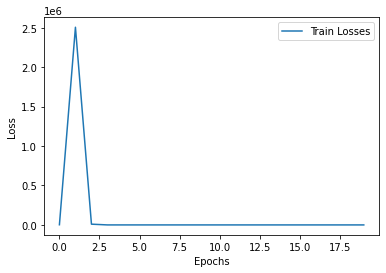

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1700.2261963
Epoch: 001, LR: 0.010000, Train Loss: 1185507.7500000
Epoch: 002, LR: 0.010000, Train Loss: 3686.1098633
Epoch: 003, LR: 0.010000, Train Loss: 1754.9919434
Epoch: 004, LR: 0.010000, Train Loss: 217.1064911
Epoch: 005, LR: 0.010000, Train Loss: 501.3740234
Epoch: 006, LR: 0.010000, Train Loss: 541.0125732
Epoch: 007, LR: 0.010000, Train Loss: 257.4483032
Epoch: 008, LR: 0.010000, Train Loss: 53.2924309
Epoch: 009, LR: 0.010000, Train Loss: 90.0787964
Epoch: 010, LR: 0.010000, Train Loss: 90.2428055
Epoch: 011, LR: 0.010000, Train Loss: 46.6610985
Epoch: 012, LR: 0.010000, Train Loss: 20.7929916
Epoch: 013, LR: 0.010000, Train Loss: 5.9734387
Epoch: 014, LR: 0.010000, Train Loss: 2.1600502
Epoch: 015, LR: 0.010000, Train Loss: 1.4206079
Epoch: 016, LR: 0.010000, Train Loss: 1.2741560
Epoch: 017, LR: 0.010000, Train Loss: 1.1957228
Epoch: 018, LR: 0.010000, Train Loss: 1.1549308

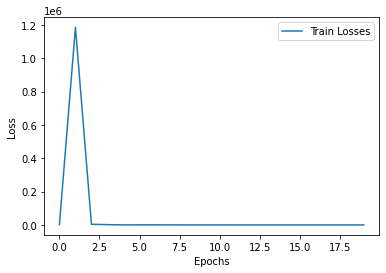

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2146.4028320
Epoch: 001, LR: 0.010000, Train Loss: 2682406.2500000
Epoch: 002, LR: 0.010000, Train Loss: 13839.8886719
Epoch: 003, LR: 0.010000, Train Loss: 918.8874512
Epoch: 004, LR: 0.010000, Train Loss: 319.3914185
Epoch: 005, LR: 0.010000, Train Loss: 276.0404663
Epoch: 006, LR: 0.010000, Train Loss: 107.2562943
Epoch: 007, LR: 0.010000, Train Loss: 108.4756012
Epoch: 008, LR: 0.010000, Train Loss: 50.3662033
Epoch: 009, LR: 0.010000, Train Loss: 34.7537422
Epoch: 010, LR: 0.010000, Train Loss: 28.8549519
Epoch: 011, LR: 0.010000, Train Loss: 15.3666601
Epoch: 012, LR: 0.010000, Train Loss: 14.8345346
Epoch: 013, LR: 0.010000, Train Loss: 5.1833658
Epoch: 014, LR: 0.010000, Train Loss: 2.6056099
Epoch: 015, LR: 0.010000, Train Loss: 1.8439018
Epoch: 016, LR: 0.010000, Train Loss: 1.4013070
Epoch: 017, LR: 0.010000, Train Loss: 1.3485899
Epoch: 018, LR: 0.010000, Train Loss: 1.3311087

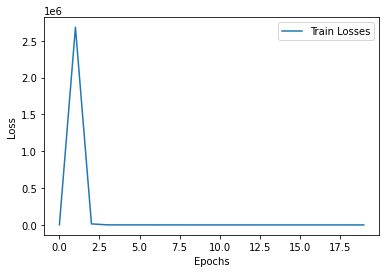

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2437.3498535
Epoch: 001, LR: 0.010000, Train Loss: 2174313.5000000
Epoch: 002, LR: 0.010000, Train Loss: 7944.8320312
Epoch: 003, LR: 0.010000, Train Loss: 3.3342574
Epoch: 004, LR: 0.010000, Train Loss: 1.0040609
Epoch: 005, LR: 0.010000, Train Loss: 1.0042371
Epoch: 006, LR: 0.010000, Train Loss: 1.0034106
Epoch: 007, LR: 0.010000, Train Loss: 1.0016652
Epoch: 008, LR: 0.010000, Train Loss: 0.9987247
Epoch: 009, LR: 0.010000, Train Loss: 0.9944857
Epoch: 010, LR: 0.010000, Train Loss: 0.9888481
Epoch: 011, LR: 0.010000, Train Loss: 0.9817142
Epoch: 012, LR: 0.010000, Train Loss: 0.9729873
Epoch: 013, LR: 0.010000, Train Loss: 0.9625804
Epoch: 014, LR: 0.010000, Train Loss: 0.9504163
Epoch: 015, LR: 0.010000, Train Loss: 0.9364355
Epoch: 016, LR: 0.010000, Train Loss: 0.9206043
Epoch: 017, LR: 0.010000, Train Loss: 0.9029209
Epoch: 018, LR: 0.010000, Train Loss: 0.8834252
Epoch: 019, LR:

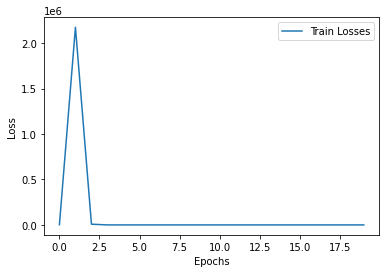

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2439.0688477
Epoch: 001, LR: 0.010000, Train Loss: 3088711.5000000
Epoch: 002, LR: 0.010000, Train Loss: 4118.8740234
Epoch: 003, LR: 0.010000, Train Loss: 8.5877104
Epoch: 004, LR: 0.010000, Train Loss: 0.9727165
Epoch: 005, LR: 0.010000, Train Loss: 0.9730194
Epoch: 006, LR: 0.010000, Train Loss: 0.9725699
Epoch: 007, LR: 0.010000, Train Loss: 0.9712211
Epoch: 008, LR: 0.010000, Train Loss: 0.9687938
Epoch: 009, LR: 0.010000, Train Loss: 0.9650816
Epoch: 010, LR: 0.010000, Train Loss: 0.9599988
Epoch: 011, LR: 0.010000, Train Loss: 0.9533664
Epoch: 012, LR: 0.010000, Train Loss: 0.9450943
Epoch: 013, LR: 0.010000, Train Loss: 0.9351127
Epoch: 014, LR: 0.010000, Train Loss: 0.9233871
Epoch: 015, LR: 0.010000, Train Loss: 0.9098919
Epoch: 016, LR: 0.010000, Train Loss: 0.8946275
Epoch: 017, LR: 0.010000, Train Loss: 0.8776103
Epoch: 018, LR: 0.010000, Train Loss: 0.8589356
Epoch: 019, LR:

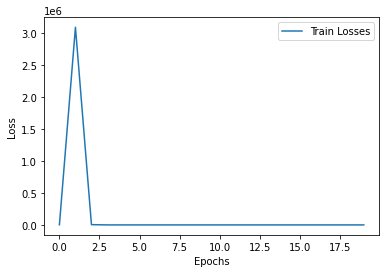

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1784.3975830
Epoch: 001, LR: 0.010000, Train Loss: 3342578.5000000
Epoch: 002, LR: 0.010000, Train Loss: 8954.3798828
Epoch: 003, LR: 0.010000, Train Loss: 1.4021109
Epoch: 004, LR: 0.010000, Train Loss: 1.0515448
Epoch: 005, LR: 0.010000, Train Loss: 1.0491828
Epoch: 006, LR: 0.010000, Train Loss: 1.0467178
Epoch: 007, LR: 0.010000, Train Loss: 1.0436277
Epoch: 008, LR: 0.010000, Train Loss: 1.0397769
Epoch: 009, LR: 0.010000, Train Loss: 1.0349678
Epoch: 010, LR: 0.010000, Train Loss: 1.0289841
Epoch: 011, LR: 0.010000, Train Loss: 1.0216253
Epoch: 012, LR: 0.010000, Train Loss: 1.0128037
Epoch: 013, LR: 0.010000, Train Loss: 1.0024241
Epoch: 014, LR: 0.010000, Train Loss: 0.9903202
Epoch: 015, LR: 0.010000, Train Loss: 0.9764105
Epoch: 016, LR: 0.010000, Train Loss: 0.9605860
Epoch: 017, LR: 0.010000, Train Loss: 0.9427813
Epoch: 018, LR: 0.010000, Train Loss: 0.9229693
Epoch: 019, LR:

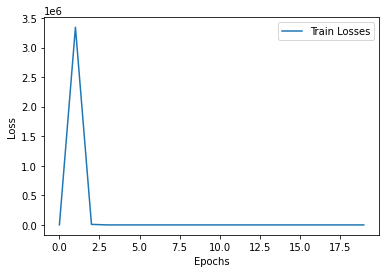

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 964.9509277
Epoch: 001, LR: 0.010000, Train Loss: 1833705.8750000
Epoch: 002, LR: 0.010000, Train Loss: 5010.7656250
Epoch: 003, LR: 0.010000, Train Loss: 1.2568038
Epoch: 004, LR: 0.010000, Train Loss: 1.1831896
Epoch: 005, LR: 0.010000, Train Loss: 1.1812475
Epoch: 006, LR: 0.010000, Train Loss: 1.1777701
Epoch: 007, LR: 0.010000, Train Loss: 1.1724110
Epoch: 008, LR: 0.010000, Train Loss: 1.1649488
Epoch: 009, LR: 0.010000, Train Loss: 1.1550819
Epoch: 010, LR: 0.010000, Train Loss: 1.1425917
Epoch: 011, LR: 0.010000, Train Loss: 1.1272655
Epoch: 012, LR: 0.010000, Train Loss: 1.1089053
Epoch: 013, LR: 0.010000, Train Loss: 1.0874408
Epoch: 014, LR: 0.010000, Train Loss: 1.0628693
Epoch: 015, LR: 0.010000, Train Loss: 1.0352632
Epoch: 016, LR: 0.010000, Train Loss: 1.0048008
Epoch: 017, LR: 0.010000, Train Loss: 0.9717758
Epoch: 018, LR: 0.010000, Train Loss: 0.9366084
Epoch: 019, LR: 

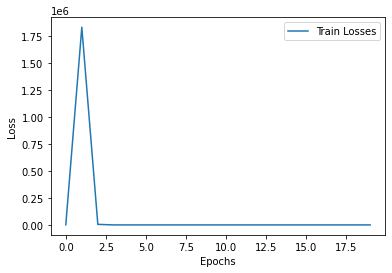

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1422.7484131
Epoch: 001, LR: 0.010000, Train Loss: 2019384.5000000
Epoch: 002, LR: 0.010000, Train Loss: 5759.7211914
Epoch: 003, LR: 0.010000, Train Loss: 1.3128508
Epoch: 004, LR: 0.010000, Train Loss: 1.0796498
Epoch: 005, LR: 0.010000, Train Loss: 1.0785378
Epoch: 006, LR: 0.010000, Train Loss: 1.0760584
Epoch: 007, LR: 0.010000, Train Loss: 1.0721509
Epoch: 008, LR: 0.010000, Train Loss: 1.0666789
Epoch: 009, LR: 0.010000, Train Loss: 1.0595571
Epoch: 010, LR: 0.010000, Train Loss: 1.0506830
Epoch: 011, LR: 0.010000, Train Loss: 1.0399647
Epoch: 012, LR: 0.010000, Train Loss: 1.0273603
Epoch: 013, LR: 0.010000, Train Loss: 1.0128140
Epoch: 014, LR: 0.010000, Train Loss: 0.9963313
Epoch: 015, LR: 0.010000, Train Loss: 0.9779383
Epoch: 016, LR: 0.010000, Train Loss: 0.9576901
Epoch: 017, LR: 0.010000, Train Loss: 0.9356697
Epoch: 018, LR: 0.010000, Train Loss: 0.9119989
Epoch: 019, LR:

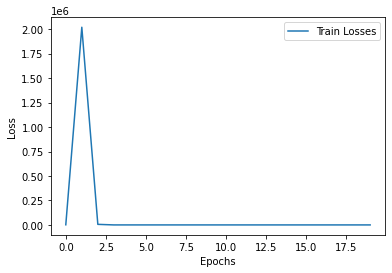

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1697.8853760
Epoch: 001, LR: 0.010000, Train Loss: 3242027.7500000
Epoch: 002, LR: 0.010000, Train Loss: 11464.9716797
Epoch: 003, LR: 0.010000, Train Loss: 1514.9752197
Epoch: 004, LR: 0.010000, Train Loss: 33.9944420
Epoch: 005, LR: 0.010000, Train Loss: 1.2284757
Epoch: 006, LR: 0.010000, Train Loss: 1.1519523
Epoch: 007, LR: 0.010000, Train Loss: 1.1508688
Epoch: 008, LR: 0.010000, Train Loss: 1.1489873
Epoch: 009, LR: 0.010000, Train Loss: 1.1461811
Epoch: 010, LR: 0.010000, Train Loss: 1.1422795
Epoch: 011, LR: 0.010000, Train Loss: 1.1372193
Epoch: 012, LR: 0.010000, Train Loss: 1.1308825
Epoch: 013, LR: 0.010000, Train Loss: 1.1231675
Epoch: 014, LR: 0.010000, Train Loss: 1.1140038
Epoch: 015, LR: 0.010000, Train Loss: 1.1033474
Epoch: 016, LR: 0.010000, Train Loss: 1.0911572
Epoch: 017, LR: 0.010000, Train Loss: 1.0774187
Epoch: 018, LR: 0.010000, Train Loss: 1.0621359
Epoch: 019

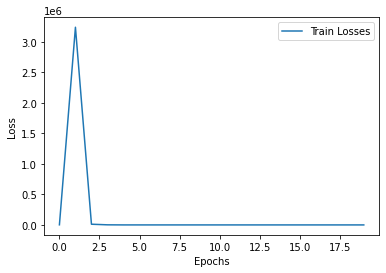

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2348.8566895
Epoch: 001, LR: 0.010000, Train Loss: 2666058.2500000
Epoch: 002, LR: 0.010000, Train Loss: 20837.3359375
Epoch: 003, LR: 0.010000, Train Loss: 67.0929489
Epoch: 004, LR: 0.010000, Train Loss: 0.9681678
Epoch: 005, LR: 0.010000, Train Loss: 0.9667937
Epoch: 006, LR: 0.010000, Train Loss: 0.9646986
Epoch: 007, LR: 0.010000, Train Loss: 0.9614791
Epoch: 008, LR: 0.010000, Train Loss: 0.9568716
Epoch: 009, LR: 0.010000, Train Loss: 0.9507231
Epoch: 010, LR: 0.010000, Train Loss: 0.9428667
Epoch: 011, LR: 0.010000, Train Loss: 0.9331792
Epoch: 012, LR: 0.010000, Train Loss: 0.9215638
Epoch: 013, LR: 0.010000, Train Loss: 0.9080166
Epoch: 014, LR: 0.010000, Train Loss: 0.8924998
Epoch: 015, LR: 0.010000, Train Loss: 0.8749921
Epoch: 016, LR: 0.010000, Train Loss: 0.8555773
Epoch: 017, LR: 0.010000, Train Loss: 0.8343467
Epoch: 018, LR: 0.010000, Train Loss: 0.8114508
Epoch: 019, L

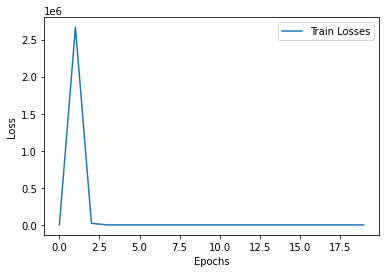

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1999.2868652
Epoch: 001, LR: 0.010000, Train Loss: 2427582.7500000
Epoch: 002, LR: 0.010000, Train Loss: 10098.8662109
Epoch: 003, LR: 0.010000, Train Loss: 7.2254710
Epoch: 004, LR: 0.010000, Train Loss: 1.1171800
Epoch: 005, LR: 0.010000, Train Loss: 1.1168797
Epoch: 006, LR: 0.010000, Train Loss: 1.1154964
Epoch: 007, LR: 0.010000, Train Loss: 1.1127146
Epoch: 008, LR: 0.010000, Train Loss: 1.1084547
Epoch: 009, LR: 0.010000, Train Loss: 1.1024947
Epoch: 010, LR: 0.010000, Train Loss: 1.0945958
Epoch: 011, LR: 0.010000, Train Loss: 1.0846250
Epoch: 012, LR: 0.010000, Train Loss: 1.0724095
Epoch: 013, LR: 0.010000, Train Loss: 1.0578021
Epoch: 014, LR: 0.010000, Train Loss: 1.0407538
Epoch: 015, LR: 0.010000, Train Loss: 1.0212162
Epoch: 016, LR: 0.010000, Train Loss: 0.9992324
Epoch: 017, LR: 0.010000, Train Loss: 0.9748999
Epoch: 018, LR: 0.010000, Train Loss: 0.9483775
Epoch: 019, LR

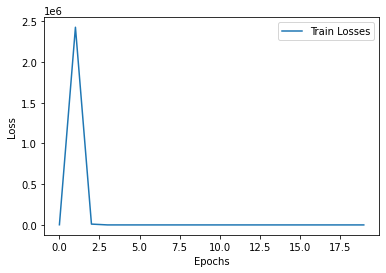

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1641.5085449
Epoch: 001, LR: 0.010000, Train Loss: 2070556.8750000
Epoch: 002, LR: 0.010000, Train Loss: 9606.9326172
Epoch: 003, LR: 0.010000, Train Loss: 2859.9562988
Epoch: 004, LR: 0.010000, Train Loss: 394.5018311
Epoch: 005, LR: 0.010000, Train Loss: 579.8651123
Epoch: 006, LR: 0.010000, Train Loss: 321.8766785
Epoch: 007, LR: 0.010000, Train Loss: 119.0545044
Epoch: 008, LR: 0.010000, Train Loss: 56.9167175
Epoch: 009, LR: 0.010000, Train Loss: 30.2602596
Epoch: 010, LR: 0.010000, Train Loss: 20.0820923
Epoch: 011, LR: 0.010000, Train Loss: 17.6786003
Epoch: 012, LR: 0.010000, Train Loss: 15.3605585
Epoch: 013, LR: 0.010000, Train Loss: 9.4201870
Epoch: 014, LR: 0.010000, Train Loss: 3.8893325
Epoch: 015, LR: 0.010000, Train Loss: 5.4813666
Epoch: 016, LR: 0.010000, Train Loss: 1.1731887
Epoch: 017, LR: 0.010000, Train Loss: 1.1639973
Epoch: 018, LR: 0.010000, Train Loss: 1.1596173

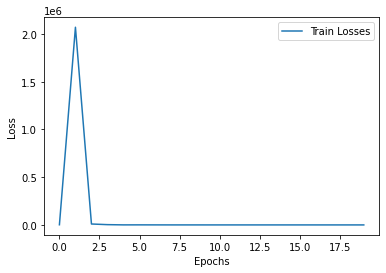

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1544.4147949
Epoch: 001, LR: 0.010000, Train Loss: 3331236.7500000
Epoch: 002, LR: 0.010000, Train Loss: 10356.4667969
Epoch: 003, LR: 0.010000, Train Loss: 1.0914234
Epoch: 004, LR: 0.010000, Train Loss: 0.9804790
Epoch: 005, LR: 0.010000, Train Loss: 0.9789832
Epoch: 006, LR: 0.010000, Train Loss: 0.9764768
Epoch: 007, LR: 0.010000, Train Loss: 0.9726329
Epoch: 008, LR: 0.010000, Train Loss: 0.9672676
Epoch: 009, LR: 0.010000, Train Loss: 0.9602591
Epoch: 010, LR: 0.010000, Train Loss: 0.9514017
Epoch: 011, LR: 0.010000, Train Loss: 0.9405506
Epoch: 012, LR: 0.010000, Train Loss: 0.9274934
Epoch: 013, LR: 0.010000, Train Loss: 0.9121447
Epoch: 014, LR: 0.010000, Train Loss: 0.8943954
Epoch: 015, LR: 0.010000, Train Loss: 0.8741776
Epoch: 016, LR: 0.010000, Train Loss: 0.8515027
Epoch: 017, LR: 0.010000, Train Loss: 0.8264787
Epoch: 018, LR: 0.010000, Train Loss: 0.7993215
Epoch: 019, LR

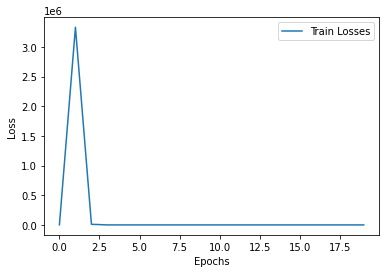

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2478.7673340
Epoch: 001, LR: 0.010000, Train Loss: 3250881.5000000
Epoch: 002, LR: 0.010000, Train Loss: 8132.4946289
Epoch: 003, LR: 0.010000, Train Loss: 2.2465067
Epoch: 004, LR: 0.010000, Train Loss: 0.8928816
Epoch: 005, LR: 0.010000, Train Loss: 0.8927285
Epoch: 006, LR: 0.010000, Train Loss: 0.8918307
Epoch: 007, LR: 0.010000, Train Loss: 0.8899221
Epoch: 008, LR: 0.010000, Train Loss: 0.8868438
Epoch: 009, LR: 0.010000, Train Loss: 0.8824087
Epoch: 010, LR: 0.010000, Train Loss: 0.8764012
Epoch: 011, LR: 0.010000, Train Loss: 0.8686007
Epoch: 012, LR: 0.010000, Train Loss: 0.8587867
Epoch: 013, LR: 0.010000, Train Loss: 0.8467685
Epoch: 014, LR: 0.010000, Train Loss: 0.8324524
Epoch: 015, LR: 0.010000, Train Loss: 0.8157931
Epoch: 016, LR: 0.010000, Train Loss: 0.7967941
Epoch: 017, LR: 0.010000, Train Loss: 0.7755266
Epoch: 018, LR: 0.010000, Train Loss: 0.7521412
Epoch: 019, LR:

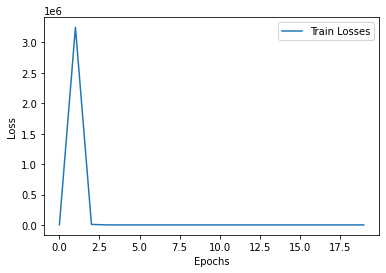

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2553.0434570
Epoch: 001, LR: 0.010000, Train Loss: 2744929.7500000
Epoch: 002, LR: 0.010000, Train Loss: 6882.7250977
Epoch: 003, LR: 0.010000, Train Loss: 2451.0849609
Epoch: 004, LR: 0.010000, Train Loss: 407.1043701
Epoch: 005, LR: 0.010000, Train Loss: 1132.1712646
Epoch: 006, LR: 0.010000, Train Loss: 462.6327209
Epoch: 007, LR: 0.010000, Train Loss: 174.7042236
Epoch: 008, LR: 0.010000, Train Loss: 336.4262390
Epoch: 009, LR: 0.010000, Train Loss: 143.0325317
Epoch: 010, LR: 0.010000, Train Loss: 47.5208435
Epoch: 011, LR: 0.010000, Train Loss: 133.0908508
Epoch: 012, LR: 0.010000, Train Loss: 97.7692337
Epoch: 013, LR: 0.010000, Train Loss: 18.1352978
Epoch: 014, LR: 0.010000, Train Loss: 62.3815880
Epoch: 015, LR: 0.010000, Train Loss: 78.0612030
Epoch: 016, LR: 0.010000, Train Loss: 26.9673595
Epoch: 017, LR: 0.010000, Train Loss: 8.7060804
Epoch: 018, LR: 0.010000, Train Loss: 2

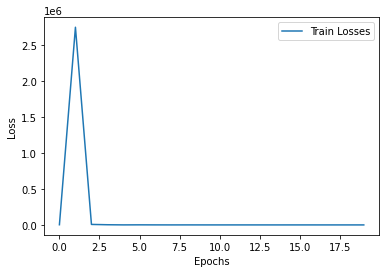

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2329.9677734
Epoch: 001, LR: 0.010000, Train Loss: 1646135.3750000
Epoch: 002, LR: 0.010000, Train Loss: 12931.4511719
Epoch: 003, LR: 0.010000, Train Loss: 311.4320068
Epoch: 004, LR: 0.010000, Train Loss: 1.1259818
Epoch: 005, LR: 0.010000, Train Loss: 0.9534393
Epoch: 006, LR: 0.010000, Train Loss: 0.9539387
Epoch: 007, LR: 0.010000, Train Loss: 0.9537068
Epoch: 008, LR: 0.010000, Train Loss: 0.9527168
Epoch: 009, LR: 0.010000, Train Loss: 0.9508063
Epoch: 010, LR: 0.010000, Train Loss: 0.9478997
Epoch: 011, LR: 0.010000, Train Loss: 0.9439156
Epoch: 012, LR: 0.010000, Train Loss: 0.9388210
Epoch: 013, LR: 0.010000, Train Loss: 0.9325533
Epoch: 014, LR: 0.010000, Train Loss: 0.9250433
Epoch: 015, LR: 0.010000, Train Loss: 0.9162708
Epoch: 016, LR: 0.010000, Train Loss: 0.9062264
Epoch: 017, LR: 0.010000, Train Loss: 0.8949313
Epoch: 018, LR: 0.010000, Train Loss: 0.8823957
Epoch: 019, 

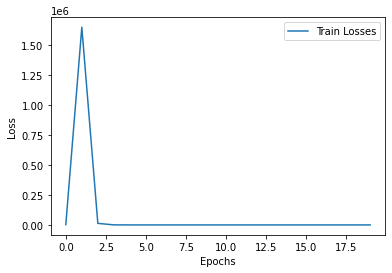

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1925.1783447
Epoch: 001, LR: 0.010000, Train Loss: 1907998.8750000
Epoch: 002, LR: 0.010000, Train Loss: 6779.7041016
Epoch: 003, LR: 0.010000, Train Loss: 3.1208594
Epoch: 004, LR: 0.010000, Train Loss: 0.8637816
Epoch: 005, LR: 0.010000, Train Loss: 0.8634247
Epoch: 006, LR: 0.010000, Train Loss: 0.8623308
Epoch: 007, LR: 0.010000, Train Loss: 0.8603577
Epoch: 008, LR: 0.010000, Train Loss: 0.8573056
Epoch: 009, LR: 0.010000, Train Loss: 0.8530042
Epoch: 010, LR: 0.010000, Train Loss: 0.8473355
Epoch: 011, LR: 0.010000, Train Loss: 0.8401452
Epoch: 012, LR: 0.010000, Train Loss: 0.8312658
Epoch: 013, LR: 0.010000, Train Loss: 0.8205691
Epoch: 014, LR: 0.010000, Train Loss: 0.8079601
Epoch: 015, LR: 0.010000, Train Loss: 0.7933713
Epoch: 016, LR: 0.010000, Train Loss: 0.7767860
Epoch: 017, LR: 0.010000, Train Loss: 0.7582521
Epoch: 018, LR: 0.010000, Train Loss: 0.7378814
Epoch: 019, LR:

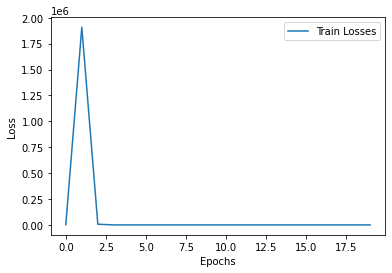

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1841.5932617
Epoch: 001, LR: 0.010000, Train Loss: 2276466.0000000
Epoch: 002, LR: 0.010000, Train Loss: 9061.4560547
Epoch: 003, LR: 0.010000, Train Loss: 1.0589852
Epoch: 004, LR: 0.010000, Train Loss: 0.9151780
Epoch: 005, LR: 0.010000, Train Loss: 0.9134371
Epoch: 006, LR: 0.010000, Train Loss: 0.9109403
Epoch: 007, LR: 0.010000, Train Loss: 0.9073245
Epoch: 008, LR: 0.010000, Train Loss: 0.9023013
Epoch: 009, LR: 0.010000, Train Loss: 0.8956406
Epoch: 010, LR: 0.010000, Train Loss: 0.8870487
Epoch: 011, LR: 0.010000, Train Loss: 0.8763920
Epoch: 012, LR: 0.010000, Train Loss: 0.8635186
Epoch: 013, LR: 0.010000, Train Loss: 0.8483400
Epoch: 014, LR: 0.010000, Train Loss: 0.8308285
Epoch: 015, LR: 0.010000, Train Loss: 0.8110237
Epoch: 016, LR: 0.010000, Train Loss: 0.7890415
Epoch: 017, LR: 0.010000, Train Loss: 0.7650607
Epoch: 018, LR: 0.010000, Train Loss: 0.7393365
Epoch: 019, LR:

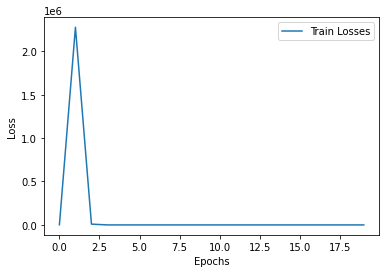

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2237.2915039
Epoch: 001, LR: 0.010000, Train Loss: 1854071.3750000
Epoch: 002, LR: 0.010000, Train Loss: 11560.5644531
Epoch: 003, LR: 0.010000, Train Loss: 7.6666622
Epoch: 004, LR: 0.010000, Train Loss: 1.1889632
Epoch: 005, LR: 0.010000, Train Loss: 1.1876620
Epoch: 006, LR: 0.010000, Train Loss: 1.1857156
Epoch: 007, LR: 0.010000, Train Loss: 1.1826754
Epoch: 008, LR: 0.010000, Train Loss: 1.1782265
Epoch: 009, LR: 0.010000, Train Loss: 1.1720930
Epoch: 010, LR: 0.010000, Train Loss: 1.1641120
Epoch: 011, LR: 0.010000, Train Loss: 1.1540024
Epoch: 012, LR: 0.010000, Train Loss: 1.1416216
Epoch: 013, LR: 0.010000, Train Loss: 1.1268903
Epoch: 014, LR: 0.010000, Train Loss: 1.1097468
Epoch: 015, LR: 0.010000, Train Loss: 1.0901551
Epoch: 016, LR: 0.010000, Train Loss: 1.0681267
Epoch: 017, LR: 0.010000, Train Loss: 1.0437261
Epoch: 018, LR: 0.010000, Train Loss: 1.0170747
Epoch: 019, LR

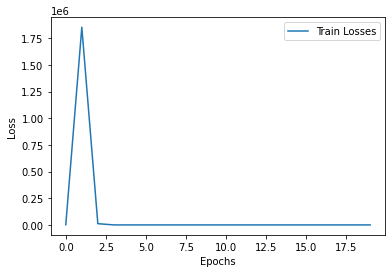

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1189.7780762
Epoch: 001, LR: 0.010000, Train Loss: 3176316.5000000
Epoch: 002, LR: 0.010000, Train Loss: 7958.6582031
Epoch: 003, LR: 0.010000, Train Loss: 0.9871942
Epoch: 004, LR: 0.010000, Train Loss: 0.8476126
Epoch: 005, LR: 0.010000, Train Loss: 0.8470088
Epoch: 006, LR: 0.010000, Train Loss: 0.8452832
Epoch: 007, LR: 0.010000, Train Loss: 0.8421893
Epoch: 008, LR: 0.010000, Train Loss: 0.8375585
Epoch: 009, LR: 0.010000, Train Loss: 0.8311779
Epoch: 010, LR: 0.010000, Train Loss: 0.8227692
Epoch: 011, LR: 0.010000, Train Loss: 0.8122076
Epoch: 012, LR: 0.010000, Train Loss: 0.7993565
Epoch: 013, LR: 0.010000, Train Loss: 0.7841401
Epoch: 014, LR: 0.010000, Train Loss: 0.7664970
Epoch: 015, LR: 0.010000, Train Loss: 0.7464949
Epoch: 016, LR: 0.010000, Train Loss: 0.7242396
Epoch: 017, LR: 0.010000, Train Loss: 0.6999334
Epoch: 018, LR: 0.010000, Train Loss: 0.6738800
Epoch: 019, LR:

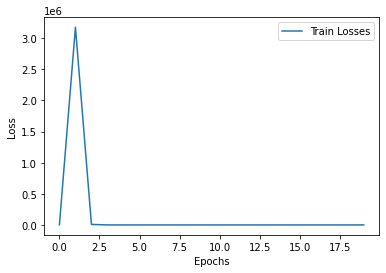

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2108.6516113
Epoch: 001, LR: 0.010000, Train Loss: 1292333.8750000
Epoch: 002, LR: 0.010000, Train Loss: 14050.2646484
Epoch: 003, LR: 0.010000, Train Loss: 1.2019533
Epoch: 004, LR: 0.010000, Train Loss: 1.0817237
Epoch: 005, LR: 0.010000, Train Loss: 1.0800545
Epoch: 006, LR: 0.010000, Train Loss: 1.0772121
Epoch: 007, LR: 0.010000, Train Loss: 1.0728731
Epoch: 008, LR: 0.010000, Train Loss: 1.0668092
Epoch: 009, LR: 0.010000, Train Loss: 1.0587963
Epoch: 010, LR: 0.010000, Train Loss: 1.0486016
Epoch: 011, LR: 0.010000, Train Loss: 1.0360186
Epoch: 012, LR: 0.010000, Train Loss: 1.0209123
Epoch: 013, LR: 0.010000, Train Loss: 1.0031943
Epoch: 014, LR: 0.010000, Train Loss: 0.9828613
Epoch: 015, LR: 0.010000, Train Loss: 0.9599257
Epoch: 016, LR: 0.010000, Train Loss: 0.9344481
Epoch: 017, LR: 0.010000, Train Loss: 0.9065571
Epoch: 018, LR: 0.010000, Train Loss: 0.8764670
Epoch: 019, LR

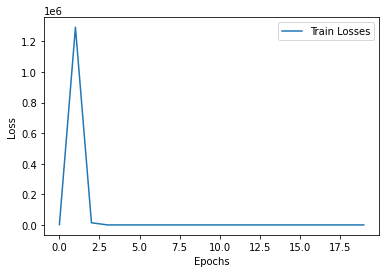

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1777.7222900
Epoch: 001, LR: 0.010000, Train Loss: 3506570.5000000
Epoch: 002, LR: 0.010000, Train Loss: 4901.9516602
Epoch: 003, LR: 0.010000, Train Loss: 0.8009064
Epoch: 004, LR: 0.010000, Train Loss: 0.7396156
Epoch: 005, LR: 0.010000, Train Loss: 0.7384201
Epoch: 006, LR: 0.010000, Train Loss: 0.7362862
Epoch: 007, LR: 0.010000, Train Loss: 0.7327774
Epoch: 008, LR: 0.010000, Train Loss: 0.7275877
Epoch: 009, LR: 0.010000, Train Loss: 0.7204928
Epoch: 010, LR: 0.010000, Train Loss: 0.7112591
Epoch: 011, LR: 0.010000, Train Loss: 0.6997196
Epoch: 012, LR: 0.010000, Train Loss: 0.6857765
Epoch: 013, LR: 0.010000, Train Loss: 0.6693932
Epoch: 014, LR: 0.010000, Train Loss: 0.6506262
Epoch: 015, LR: 0.010000, Train Loss: 0.6296513
Epoch: 016, LR: 0.010000, Train Loss: 0.6067252
Epoch: 017, LR: 0.010000, Train Loss: 0.5822327
Epoch: 018, LR: 0.010000, Train Loss: 0.5566733
Epoch: 019, LR:

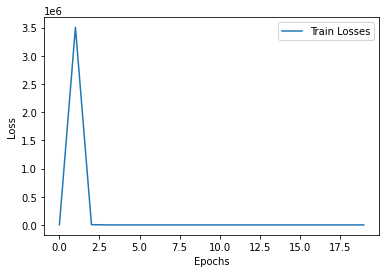

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2156.5322266
Epoch: 001, LR: 0.010000, Train Loss: 3127201.0000000
Epoch: 002, LR: 0.010000, Train Loss: 14027.4843750
Epoch: 003, LR: 0.010000, Train Loss: 736.8693237
Epoch: 004, LR: 0.010000, Train Loss: 50.4652100
Epoch: 005, LR: 0.010000, Train Loss: 50.9425697
Epoch: 006, LR: 0.010000, Train Loss: 5.4325814
Epoch: 007, LR: 0.010000, Train Loss: 0.5611191
Epoch: 008, LR: 0.010000, Train Loss: 0.5208451
Epoch: 009, LR: 0.010000, Train Loss: 0.5169544
Epoch: 010, LR: 0.010000, Train Loss: 0.5165398
Epoch: 011, LR: 0.010000, Train Loss: 0.5157878
Epoch: 012, LR: 0.010000, Train Loss: 0.5145893
Epoch: 013, LR: 0.010000, Train Loss: 0.5128658
Epoch: 014, LR: 0.010000, Train Loss: 0.5104871
Epoch: 015, LR: 0.010000, Train Loss: 0.5073810
Epoch: 016, LR: 0.010000, Train Loss: 0.5034512
Epoch: 017, LR: 0.010000, Train Loss: 0.4986108
Epoch: 018, LR: 0.010000, Train Loss: 0.4927958
Epoch: 019

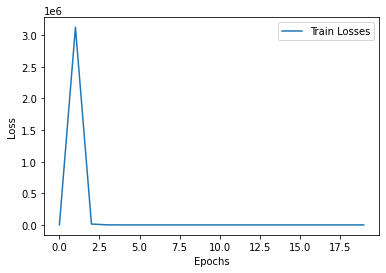

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1432.1811523
Epoch: 001, LR: 0.010000, Train Loss: 2222992.0000000
Epoch: 002, LR: 0.010000, Train Loss: 11484.9433594
Epoch: 003, LR: 0.010000, Train Loss: 4.6548624
Epoch: 004, LR: 0.010000, Train Loss: 0.9221982
Epoch: 005, LR: 0.010000, Train Loss: 0.9218295
Epoch: 006, LR: 0.010000, Train Loss: 0.9201560
Epoch: 007, LR: 0.010000, Train Loss: 0.9169735
Epoch: 008, LR: 0.010000, Train Loss: 0.9121112
Epoch: 009, LR: 0.010000, Train Loss: 0.9054045
Epoch: 010, LR: 0.010000, Train Loss: 0.8965799
Epoch: 011, LR: 0.010000, Train Loss: 0.8854840
Epoch: 012, LR: 0.010000, Train Loss: 0.8720140
Epoch: 013, LR: 0.010000, Train Loss: 0.8561051
Epoch: 014, LR: 0.010000, Train Loss: 0.8377515
Epoch: 015, LR: 0.010000, Train Loss: 0.8170182
Epoch: 016, LR: 0.010000, Train Loss: 0.7940288
Epoch: 017, LR: 0.010000, Train Loss: 0.7689696
Epoch: 018, LR: 0.010000, Train Loss: 0.7421250
Epoch: 019, LR

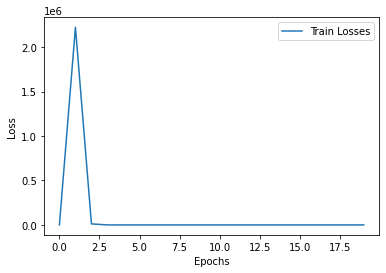

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2260.9252930
Epoch: 001, LR: 0.010000, Train Loss: 2469774.7500000
Epoch: 002, LR: 0.010000, Train Loss: 8450.9052734
Epoch: 003, LR: 0.010000, Train Loss: 55.2655106
Epoch: 004, LR: 0.010000, Train Loss: 1.1060059
Epoch: 005, LR: 0.010000, Train Loss: 1.1055312
Epoch: 006, LR: 0.010000, Train Loss: 1.1047063
Epoch: 007, LR: 0.010000, Train Loss: 1.1031415
Epoch: 008, LR: 0.010000, Train Loss: 1.1006954
Epoch: 009, LR: 0.010000, Train Loss: 1.0970640
Epoch: 010, LR: 0.010000, Train Loss: 1.0921588
Epoch: 011, LR: 0.010000, Train Loss: 1.0858181
Epoch: 012, LR: 0.010000, Train Loss: 1.0779335
Epoch: 013, LR: 0.010000, Train Loss: 1.0684040
Epoch: 014, LR: 0.010000, Train Loss: 1.0571282
Epoch: 015, LR: 0.010000, Train Loss: 1.0440295
Epoch: 016, LR: 0.010000, Train Loss: 1.0290745
Epoch: 017, LR: 0.010000, Train Loss: 1.0122489
Epoch: 018, LR: 0.010000, Train Loss: 0.9935672
Epoch: 019, LR

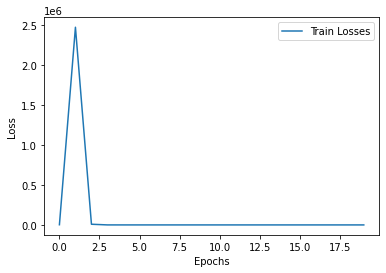

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 1563.9954834
Epoch: 001, LR: 0.010000, Train Loss: 1467476.6250000
Epoch: 002, LR: 0.010000, Train Loss: 4488.2011719
Epoch: 003, LR: 0.010000, Train Loss: 0.8779687
Epoch: 004, LR: 0.010000, Train Loss: 0.8189348
Epoch: 005, LR: 0.010000, Train Loss: 0.8172487
Epoch: 006, LR: 0.010000, Train Loss: 0.8152270
Epoch: 007, LR: 0.010000, Train Loss: 0.8125433
Epoch: 008, LR: 0.010000, Train Loss: 0.8089072
Epoch: 009, LR: 0.010000, Train Loss: 0.8040598
Epoch: 010, LR: 0.010000, Train Loss: 0.7979252
Epoch: 011, LR: 0.010000, Train Loss: 0.7903177
Epoch: 012, LR: 0.010000, Train Loss: 0.7810884
Epoch: 013, LR: 0.010000, Train Loss: 0.7701371
Epoch: 014, LR: 0.010000, Train Loss: 0.7573982
Epoch: 015, LR: 0.010000, Train Loss: 0.7427982
Epoch: 016, LR: 0.010000, Train Loss: 0.7264020
Epoch: 017, LR: 0.010000, Train Loss: 0.7082962
Epoch: 018, LR: 0.010000, Train Loss: 0.6886185
Epoch: 019, LR:

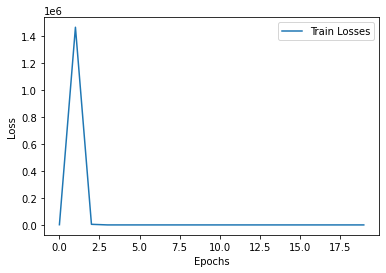

Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: 2519.2099609
Epoch: 001, LR: 0.010000, Train Loss: 3473680.5000000
Epoch: 002, LR: 0.010000, Train Loss: 12300.4306641
Epoch: 003, LR: 0.010000, Train Loss: 1.4942505
Epoch: 004, LR: 0.010000, Train Loss: 1.1473910
Epoch: 005, LR: 0.010000, Train Loss: 1.1462932
Epoch: 006, LR: 0.010000, Train Loss: 1.1441989
Epoch: 007, LR: 0.010000, Train Loss: 1.1408058
Epoch: 008, LR: 0.010000, Train Loss: 1.1357920
Epoch: 009, LR: 0.010000, Train Loss: 1.1289275
Epoch: 010, LR: 0.010000, Train Loss: 1.1200187
Epoch: 011, LR: 0.010000, Train Loss: 1.1088799
Epoch: 012, LR: 0.010000, Train Loss: 1.0953165
Epoch: 013, LR: 0.010000, Train Loss: 1.0791564
Epoch: 014, LR: 0.010000, Train Loss: 1.0602206
Epoch: 015, LR: 0.010000, Train Loss: 1.0384753


KeyboardInterrupt: ignored

In [ ]:
for j, (train_dataset, test_dataset) in enumerate(zip(toy_datasets_list_20210712, toy_datasets_list_20210712)):

    # output_shape = dataset_list[j].num_neural_units
    # print('Date: {}'.format(dataset_list[j].date))
    models_list = [TempConvNet(input_dim = 92, output_dim=142, num_conv_layers = 2, kernel_size = 5, padding = 2).to(device),\
                  # TempConvNet(input_dim = 92, output_dim=output_shape, num_conv_layers = 3, kernel_size = 5, padding = 2).to(device),\
                  # TempConvNet(input_dim = 92, output_dim=output_shape, num_conv_layers = 4, kernel_size = 5, padding = 2).to(device)
                  ]

    model_instance_data = []
    for i, model in enumerate(models_list):
        criterion = torch.nn.MSELoss()
        optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.7, patience=5, min_lr=0.00001)   
        total_params = sum(p.numel() for p in model.parameters())

        print('Model Number: {}'.format(i))
        print('Num Conv Layers: {}, Total Parameters: {}'\
            .format(model.num_conv_layers, total_params))

        train_losses = []
        val_losses = []
        test_losses = []
        start = time.time()
        for epoch in range(20):
            lr = scheduler.optimizer.param_groups[0]['lr']
            train_loss = train(train_dataset, model, optimizer, criterion)
            test_loss = test(test_dataset, model, optimizer, criterion)
            scheduler.step(test_loss)
            # if epoch % 50==0:
            #     print('Epoch: {:03d}, LR: {:7f}, Train Loss: {:.7f}, Test Loss: {:.7f}'\
            #           .format(epoch, lr, train_loss, test_loss))

            train_losses.append(train_loss)
            test_losses.append(test_loss)
            print('Epoch: {:03d}, LR: {:7f}, Train Loss: {:.7f}'\
                      .format(epoch, lr, train_loss, test_loss))
        end = time.time()
        print('Time to train model: {}'.format(end-start))
        plt.plot(train_losses)
        # plt.plot(test_losses)
        # plt.title('Losses - Date: {}, Model: {}, Layers: {}'.format(dataset_list[j].date, i, model.num_conv_layers))
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend(['Train Losses', 'Test Losses'])
        plt.show()

        # train_instance_data = get_instance_losses(train_dataset, model)
        # test_instance_data = get_instance_losses(test_dataset, model)
        # instance_data = [train_instance_data, test_instance_data]

        # r2_train = sklearn.metrics.r2_score(train_instance_data[2],train_instance_data[3],multioutput='variance_weighted')
        # r2_test = sklearn.metrics.r2_score(test_instance_data[2],test_instance_data[3],multioutput='variance_weighted')

        # r2_train_list.append(r2_train)
        # r2_test_list.append(r2_test)

        # save model
        # directory = '/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/PopJarvisExperiments/'
        # model_name = 'date{}_layers{}.pth'.format(dataset_list[j].date, model.num_conv_layers)
        # torch.save(model.state_dict(), directory+model_name)

In [ ]:
all_instance_data = []

r2_train_list = []
r2_test_list = []

for j, (train_dataset, test_dataset) in enumerate(zip(train_dataset_list, test_dataset_list)):

    output_shape = dataset_list[j].num_neural_units
    print('Date: {}'.format(dataset_list[j].date))
    models_list = [TempConvNet(input_dim = 92, output_dim=output_shape, num_conv_layers = 2, kernel_size = 5, padding = 2).to(device),\
                  # TempConvNet(input_dim = 92, output_dim=output_shape, num_conv_layers = 3, kernel_size = 5, padding = 2).to(device),\
                  # TempConvNet(input_dim = 92, output_dim=output_shape, num_conv_layers = 4, kernel_size = 5, padding = 2).to(device)
                  ]

    model_instance_data = []
    for i, model in enumerate(models_list):
        criterion = torch.nn.MSELoss()
        optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.7, patience=5, min_lr=0.00001)   
        total_params = sum(p.numel() for p in model.parameters())

        print('Model Number: {}'.format(i))
        print('Num Conv Layers: {}, Total Parameters: {}'\
            .format(model.num_conv_layers, total_params))

        train_losses = []
        val_losses = []
        test_losses = []
        start = time.time()
        for epoch in range(300):
            lr = scheduler.optimizer.param_groups[0]['lr']
            train_loss = train(train_dataset, model, optimizer, criterion)
            test_loss = test(test_dataset, model, optimizer, criterion)
            scheduler.step(test_loss)
            # if epoch % 50==0:
            #     print('Epoch: {:03d}, LR: {:7f}, Train Loss: {:.7f}, Test Loss: {:.7f}'\
            #           .format(epoch, lr, train_loss, test_loss))

            train_losses.append(train_loss)
            test_losses.append(test_loss)
            print('Epoch: {:03d}, LR: {:7f}, Train Loss: {:.7f}, Test Loss: {:.7f}'\
                      .format(epoch, lr, train_loss, test_loss))
        end = time.time()
        print('Time to train model: {}'.format(end-start))
        plt.plot(train_losses)
        plt.plot(test_losses)
        plt.title('Losses - Date: {}, Model: {}, Layers: {}'.format(dataset_list[j].date, i, model.num_conv_layers))
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend(['Train Losses', 'Test Losses'])
        plt.show()

        train_instance_data = get_instance_losses(train_dataset, model)
        test_instance_data = get_instance_losses(test_dataset, model)
        instance_data = [train_instance_data, test_instance_data]

        r2_train = sklearn.metrics.r2_score(train_instance_data[2],train_instance_data[3],multioutput='variance_weighted')
        r2_test = sklearn.metrics.r2_score(test_instance_data[2],test_instance_data[3],multioutput='variance_weighted')

        r2_train_list.append(r2_train)
        r2_test_list.append(r2_test)

        # save model
        directory = '/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/PopJarvisExperiments/'
        model_name = 'date{}_layers{}.pth'.format(dataset_list[j].date, model.num_conv_layers)
        torch.save(model.state_dict(), directory+model_name)

Date: 20210712
Model Number: 0
Num Conv Layers: 2, Total Parameters: 476150
Epoch: 000, LR: 0.010000, Train Loss: nan, Test Loss: nan
Epoch: 001, LR: 0.010000, Train Loss: nan, Test Loss: nan
Epoch: 002, LR: 0.010000, Train Loss: nan, Test Loss: nan
Epoch: 003, LR: 0.010000, Train Loss: nan, Test Loss: nan
Epoch: 004, LR: 0.010000, Train Loss: nan, Test Loss: nan
Epoch: 005, LR: 0.010000, Train Loss: nan, Test Loss: nan
Epoch: 006, LR: 0.007000, Train Loss: nan, Test Loss: nan
Epoch: 007, LR: 0.007000, Train Loss: nan, Test Loss: nan
Epoch: 008, LR: 0.007000, Train Loss: nan, Test Loss: nan
Epoch: 009, LR: 0.007000, Train Loss: nan, Test Loss: nan
Epoch: 010, LR: 0.007000, Train Loss: nan, Test Loss: nan
Epoch: 011, LR: 0.007000, Train Loss: nan, Test Loss: nan
Epoch: 012, LR: 0.004900, Train Loss: nan, Test Loss: nan
Epoch: 013, LR: 0.004900, Train Loss: nan, Test Loss: nan
Epoch: 014, LR: 0.004900, Train Loss: nan, Test Loss: nan
Epoch: 015, LR: 0.004900, Train Loss: nan, Test Loss: 

KeyboardInterrupt: ignored